
# Libraries and Data Information

## Mount Google Drive

In [1]:
from google.colab import drive, files, runtime
drive.mount('/content/drive')

Mounted at /content/drive


## Check for Nvidia GPU.

In [2]:
!nvidia-smi

/bin/bash: line 1: nvidia-smi: command not found


## Create Virtual Environment.

In [3]:
#!python -m venv /content/drive/My Drive/my_env  # Store in your Drive

## Activate Environment

In [4]:
!source /content/drive/My Drive/my_env/bin/activate

/bin/bash: line 1: /content/drive/My: No such file or directory


## Installations

In [5]:
!pip install numpy  # Install or upgrade NumPy first
!pip install tensorflow
!pip install keras-spiking --upgrade
!pip install statsforecast pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.6/354.6 kB 17.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 689.1/689.1 kB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 348.2/348.2 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 281.0/281.0 kB 13.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 16.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.3/40.3 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.9/59.9 kB 2.9 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.16.3
    Uninstalling scipy-1.16.3:
      Successfully uninstalled scipy-1.16.3


## Libraries

In [6]:
import keras
print(keras.__version__)

import keras_spiking
print(keras_spiking.__version__)

3.13.2
0.3.0


In [163]:
#matplotlib imports
import matplotlib.pyplot as plt
import matplotlib.pyplot as scatter
import matplotlib.cm as cm
import time

# sklearn imports
from sklearn.preprocessing import (MinMaxScaler, StandardScaler, MaxAbsScaler,
                                   RobustScaler)
from sklearn.metrics import (mean_absolute_error, mean_squared_error, r2_score,
                             mean_absolute_percentage_error)

# keras/tensorflow imports
import tensorflow as tf
import keras_spiking
from keras.layers import (Dense, Dropout, SimpleRNN, LSTM, GRU, Flatten, Conv1D,
                          MaxPooling1D, TimeDistributed, Conv2D, MaxPooling2D,
                          Lambda)
from keras.models import Sequential
import keras_spiking



# warnings imports
import warnings
warnings.filterwarnings("ignore")

# torch imports
import torch
import torch.nn as nn
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"{device}" " is available.")

# Other imports
import numpy as np
import pandas as pd
from math import sqrt
import os
import pickle
from datetime import datetime, timedelta
import random
import scipy.stats

cpu is available.


# Load Data

In [9]:
data_to_load = files.upload()

Saving pems_time_series_traffic_Q.csv to pems_time_series_traffic_Q.csv


# Read and Check Data

## Preprocessing stage.

In [10]:
filename_list = list(data_to_load.keys())
filename = filename_list[0]

In [11]:
df = pd.read_csv(filename)
df.head()

,Hour,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
0,3/6/2023 0:00,"4,730,945.90","71,292.80",66.359379,430583,55.0
1,3/6/2023 1:00,"3,539,705.60","53,661.00",65.964212,430728,55.0
2,3/6/2023 2:00,"3,303,421.80","50,292.40",65.684314,430476,54.9
3,3/6/2023 3:00,"4,293,866.20","65,046.60",66.012154,430728,54.9
4,3/6/2023 4:00,"7,919,316.80","119,801.60",66.103598,430728,54.8


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8795 entries, 0 to 8794
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Hour             8795 non-null   object 
 1   VMT (Veh-Miles)  8795 non-null   object 
 2   VHT (Veh-Hours)  8795 non-null   object 
 3   Q (VMT/VHT)      8795 non-null   float64
 4   # Lane Points    8795 non-null   int64  
 5   % Observed       8795 non-null   float64
dtypes: float64(2), int64(1), object(3)
memory usage: 412.4+ KB


In [13]:
title_name = 'CalTrans PeMS Data from 03-06-2023 to 03-06-2024'

In [14]:
df['VMT (Veh-Miles)'] = [float(str(i).replace(",", "")) for i in df['VMT (Veh-Miles)']]
df['VHT (Veh-Hours)'] = [float(str(i).replace(",", "")) for i in df['VHT (Veh-Hours)']]

## Other Pre-Processing Information

In [15]:
# We must convert the Datetime column to Datetime format
df['Hour'] = pd.to_datetime(df['Hour'])

# We index the Datetime column after transformation
df.set_index('Hour', inplace=True)
df.head()

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8


In [16]:
# checking missing data
df.isna().sum()

,0
VMT (Veh-Miles),0
VHT (Veh-Hours),0
Q (VMT/VHT),0
# Lane Points,0
% Observed,0


In [17]:
# Let's look at the years in the data set
years = df.index.year.unique()
years

Index([2023, 2024], dtype='int32', name='Hour')

In [18]:
# Let's see the average energy consumed per year
df_yr_obs = df['% Observed'].resample('Y').mean()
df_yr_obs.to_frame()

,% Observed
Hour,
2023-12-31,52.018206
2024-12-31,52.886260


In [19]:
df_yr_lane_pts = df['# Lane Points'].resample('Y').mean()
df_yr_lane_pts.to_frame()

,# Lane Points
Hour,
2023-12-31,436930.190503
2024-12-31,444306.233461


In [20]:
df_yr_avg_vmt = df['VMT (Veh-Miles)'].resample('Y').mean()
df_yr_avg_vmt.to_frame()

,VMT (Veh-Miles)
Hour,
2023-12-31,1.664968e+07
2024-12-31,1.608081e+07


In [21]:
df_yr_avg_vht = df['VHT (Veh-Hours)'].resample('Y').mean()
df_yr_avg_vht.to_frame()

,VHT (Veh-Hours)
Hour,
2023-12-31,285529.216904
2024-12-31,275036.663677


* As can be seen, there are no missing values in our data
* Now let's observe our data set on the graph

In [22]:
df_yr_avg_vmt = df['Q (VMT/VHT)'].resample('Y').mean()
df_yr_avg_vmt.to_frame()

,Q (VMT/VHT)
Hour,
2023-12-31,60.974523
2024-12-31,61.079063


## Plot Vehicle-Miles Traveled, Vehicle-Hours Traveled, Q based on Trends and Seasonality.

In [23]:
def plot_veh_mi_hrs(select_df, start, end, seasonality, title_name):
  fig1, ax11 = plt.subplots(figsize=(16, 16))
  ax12 = ax11.twinx()
  ax11.plot(select_df['VMT (Veh-Miles)'][start:end], color='blue',
            label='Vehicle Miles')
  ax11.set_ylabel("Vehicle Miles", fontsize = 20)
  ax11.set_xlabel("Hour", fontsize = 20)
  ax12.plot(select_df['VHT (Veh-Hours)'][start:end], alpha=0.7, color='orange',
            label='Vehicle Hours')
  ax12.set_ylabel("Vehicle Hours", fontsize = 20)
  plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
  plt.title("Vehicle Miles and Hours for {0} ({1})".
            format(title_name, seasonality), fontsize = 20)
  plt.show()

def plot_veh_mi_hrs_Q(select_df, start, end, seasonality, title_name, feature):
    plt.figure(figsize=(16, 16))
    plt.plot(select_df[start:end], label=feature)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=20)
    plt.rc('ytick', labelsize=20)
    plt.ylabel(feature, fontsize = 20)
    plt.xlabel("Hour", fontsize = 20)
    plt.title("{0} for {1} ({2})".format(feature, title_name, seasonality),
              fontsize = 20)
    plt.show()

### Yearly Plots (Trend)

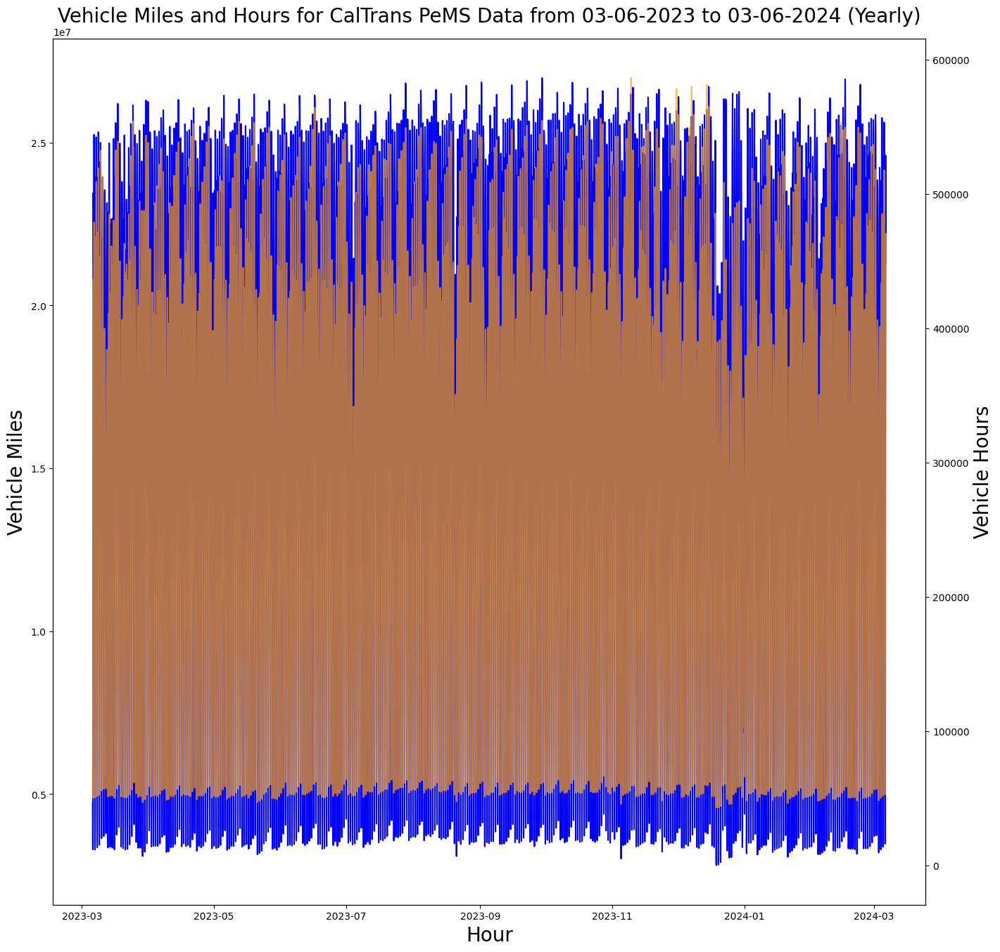

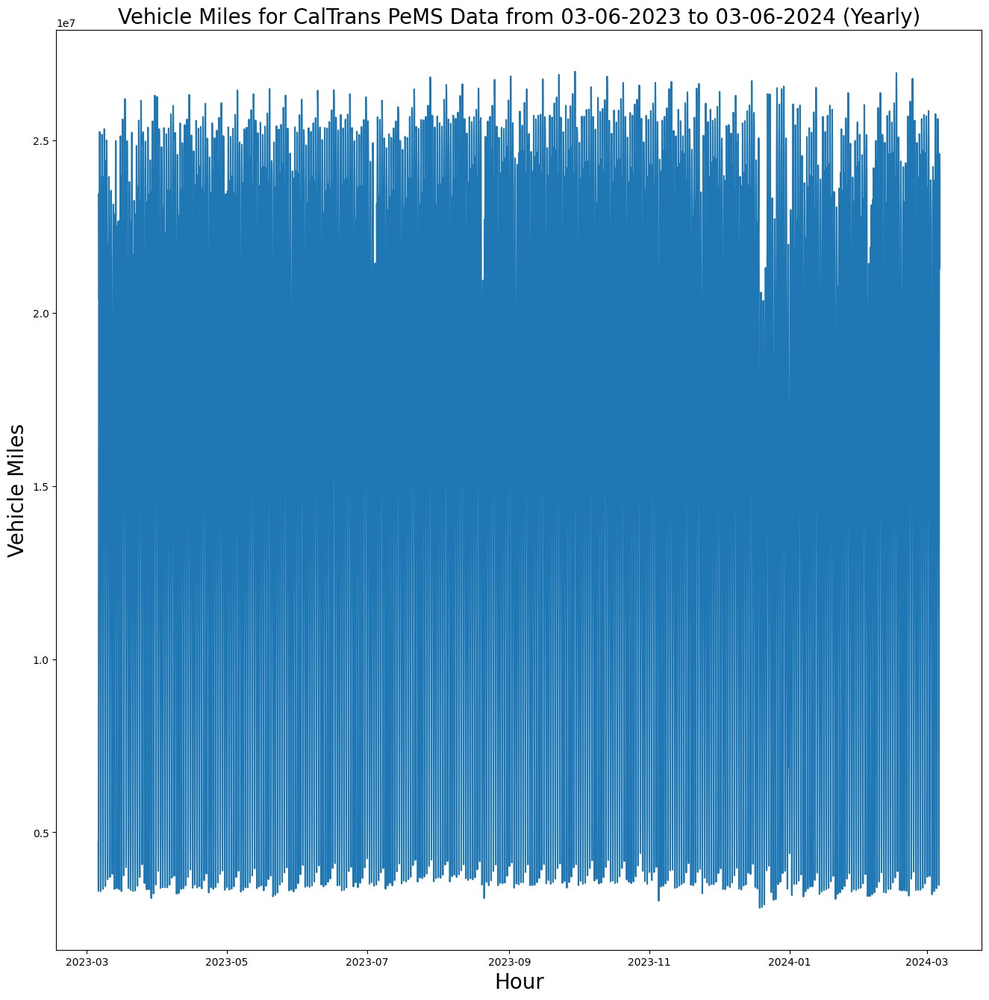

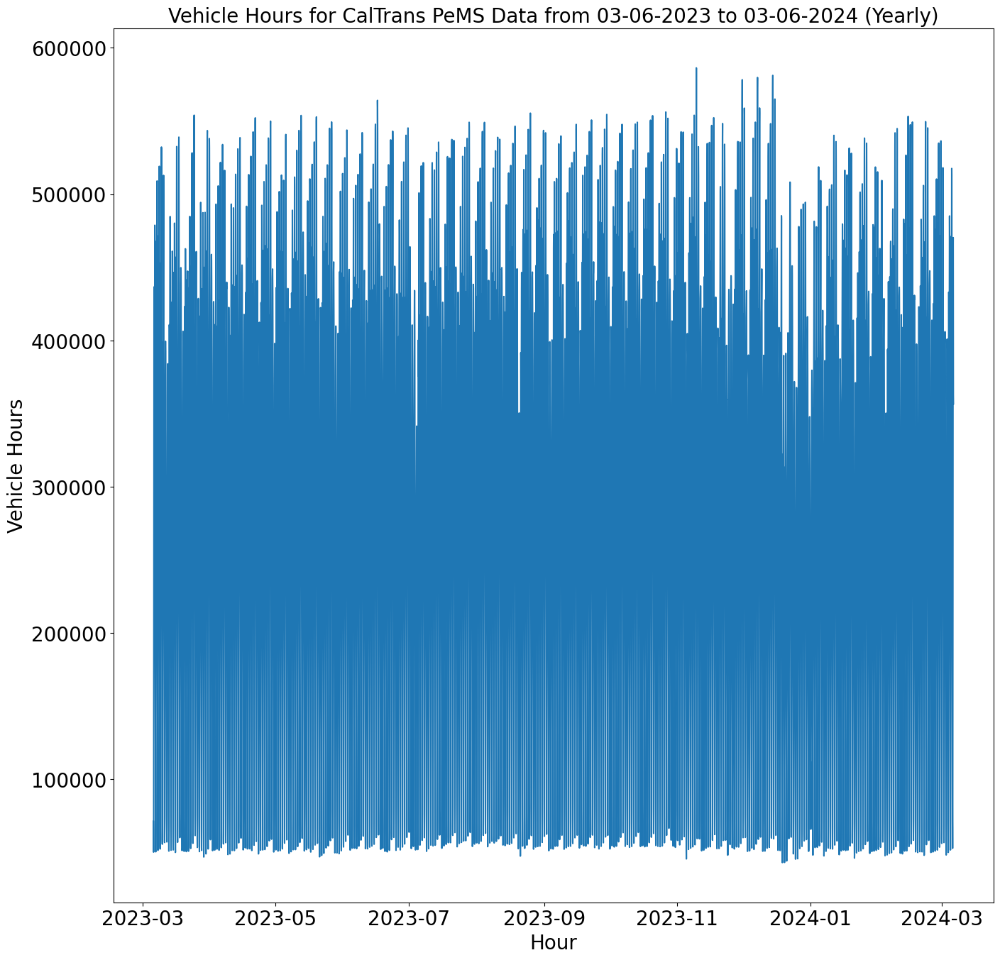

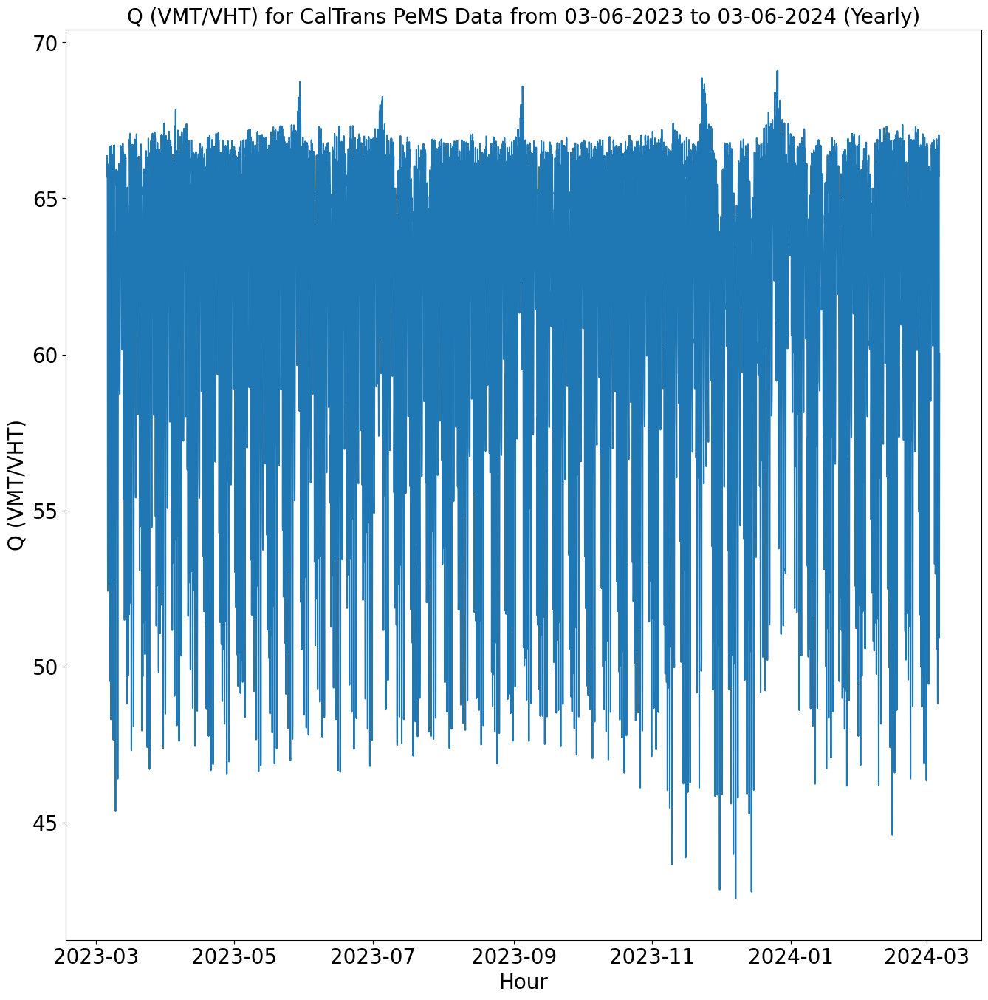

In [24]:
plot_veh_mi_hrs(df, 0, df.shape[0], "Yearly", title_name)
plot_veh_mi_hrs_Q(df['VMT (Veh-Miles)'], 0, df.shape[0], "Yearly", title_name,
                  'Vehicle Miles')
plot_veh_mi_hrs_Q(df['VHT (Veh-Hours)'], 0, df.shape[0], "Yearly", title_name,
                  'Vehicle Hours')
plot_veh_mi_hrs_Q(df['Q (VMT/VHT)'], 0, df.shape[0], "Yearly", title_name,
                  'Q (VMT/VHT)')

### Daily Plots (Seasonality)

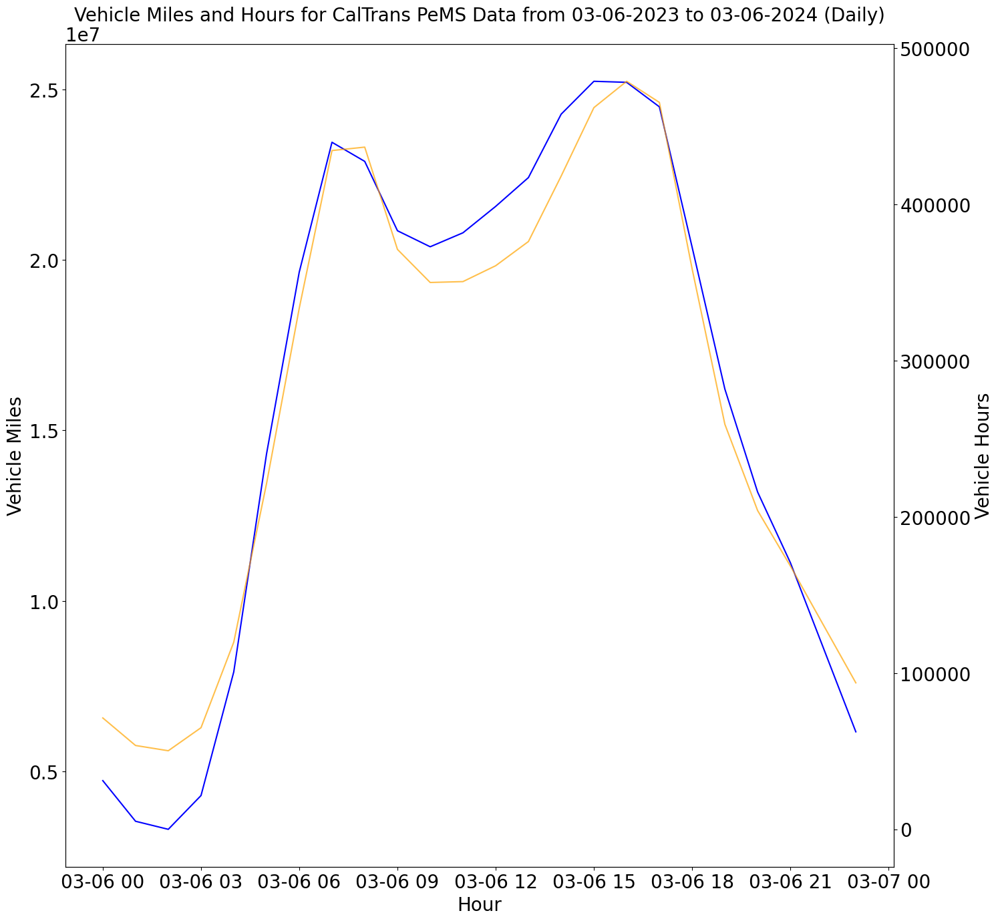

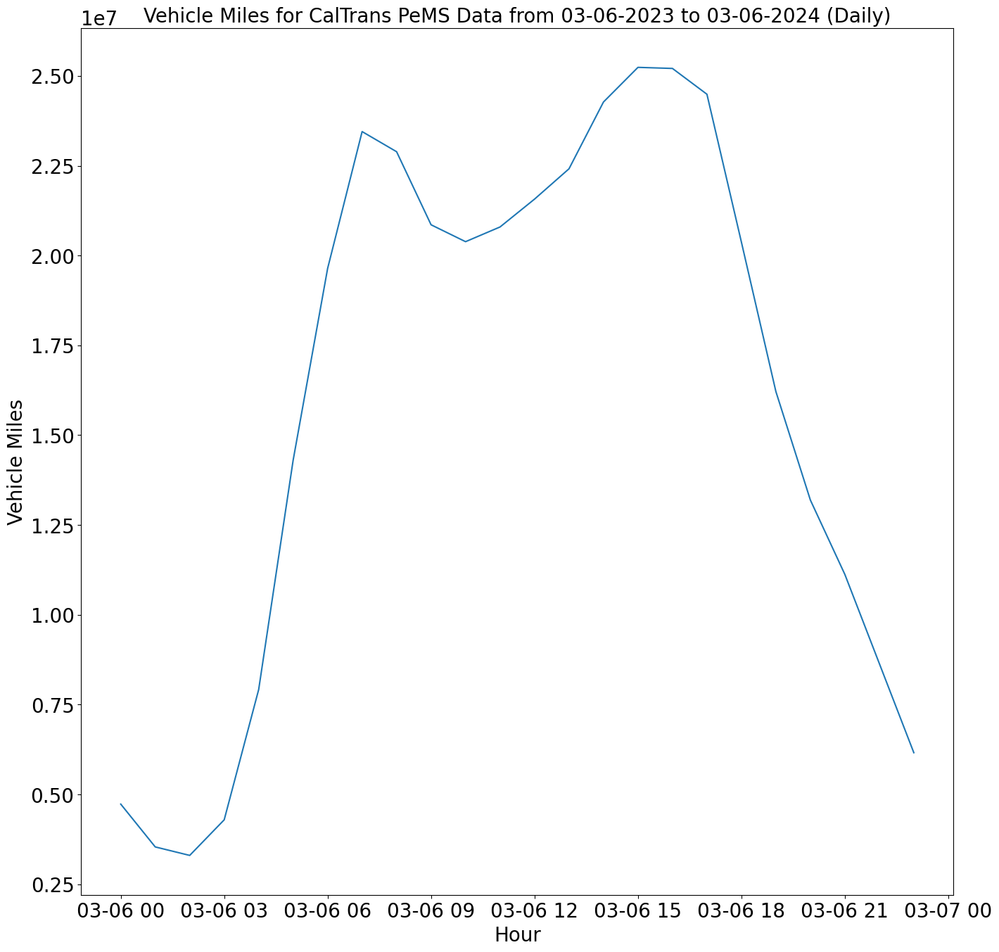

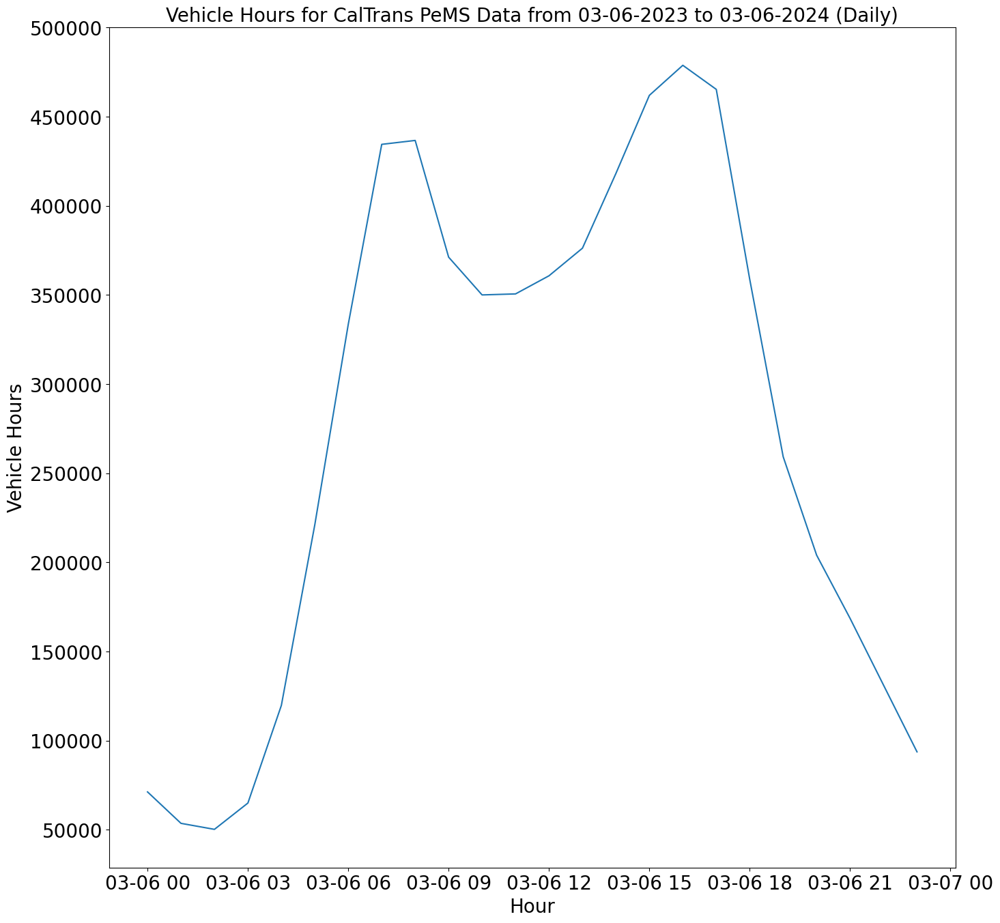

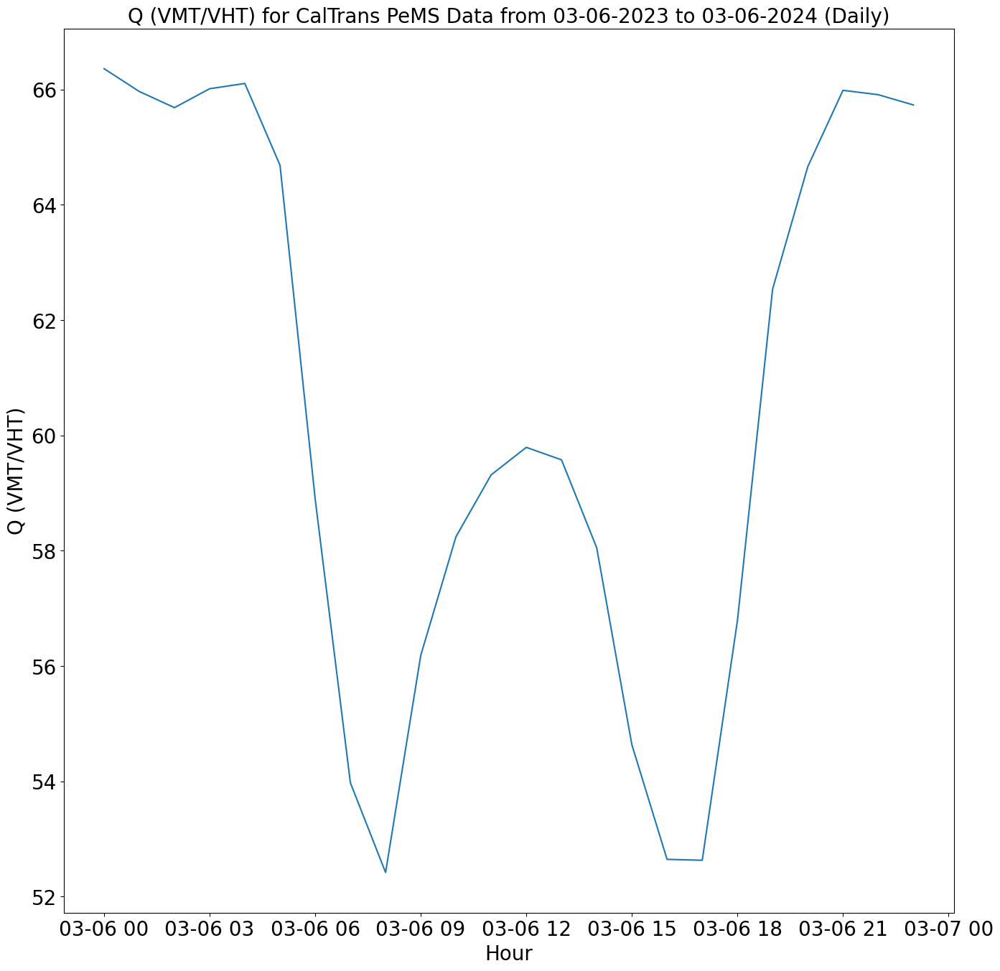

In [25]:
plot_veh_mi_hrs(df, 0, 24, "Daily", title_name)
plot_veh_mi_hrs_Q(df['VMT (Veh-Miles)'], 0, 24, "Daily", title_name,
                  'Vehicle Miles')
plot_veh_mi_hrs_Q(df['VHT (Veh-Hours)'], 0, 24, "Daily", title_name,
                  'Vehicle Hours')
plot_veh_mi_hrs_Q(df['Q (VMT/VHT)'], 0, 24, "Daily", title_name, 'Q (VMT/VHT)')

### Weekly Plots (Seasonality)

In [26]:
weekly_df = df.query("Hour >= '2023-04-09' \
                       and Hour <= '2023-04-16'")
weekly_df

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-04-09 00:00:00,7338493.3,109208.5,67.197089,431550,57.0
2023-04-09 01:00:00,5093904.2,76290.6,66.769749,431640,57.0
2023-04-09 02:00:00,4049969.8,60785.5,66.627235,431640,57.0
2023-04-09 03:00:00,3223051.7,48650.7,66.248825,431646,57.0
2023-04-09 04:00:00,3293754.2,49713.6,66.254590,431624,57.0
...,...,...,...,...,...
2023-04-15 20:00:00,17747047.8,276707.1,64.136583,431697,57.0
2023-04-15 21:00:00,16665800.0,250957.2,66.408933,431680,56.9
2023-04-15 22:00:00,14581376.4,218670.8,66.681863,431670,56.9


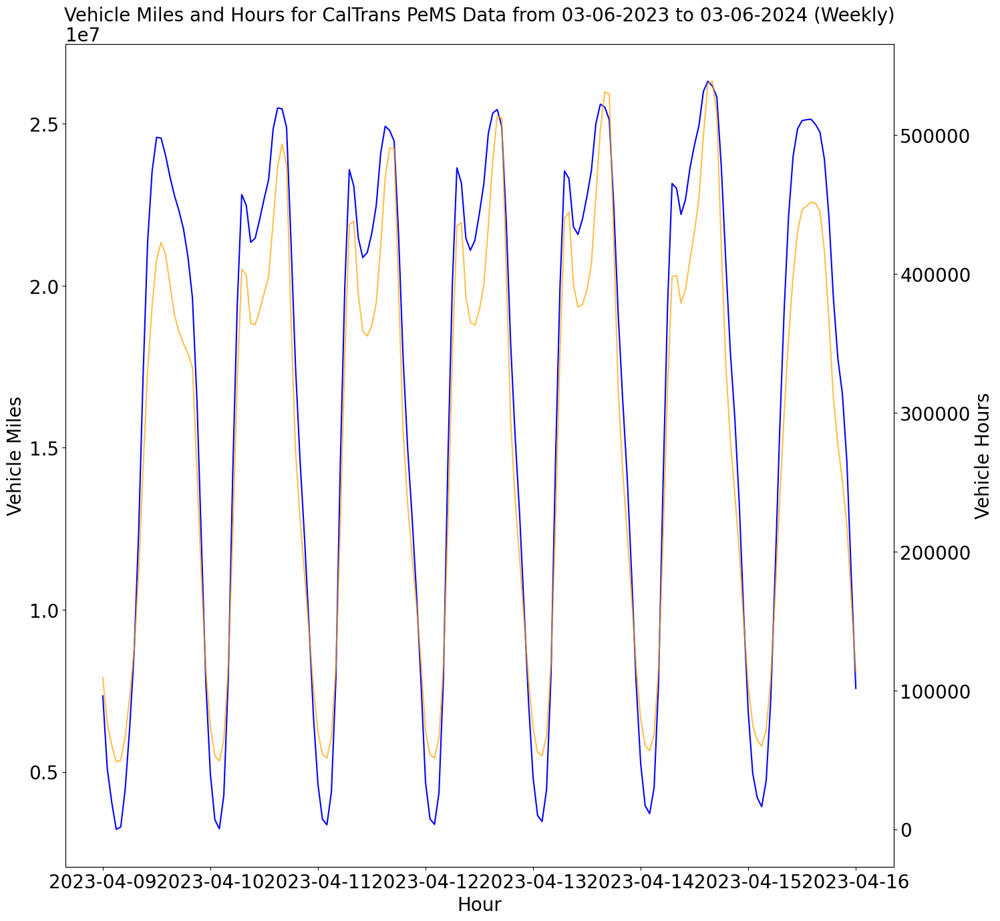

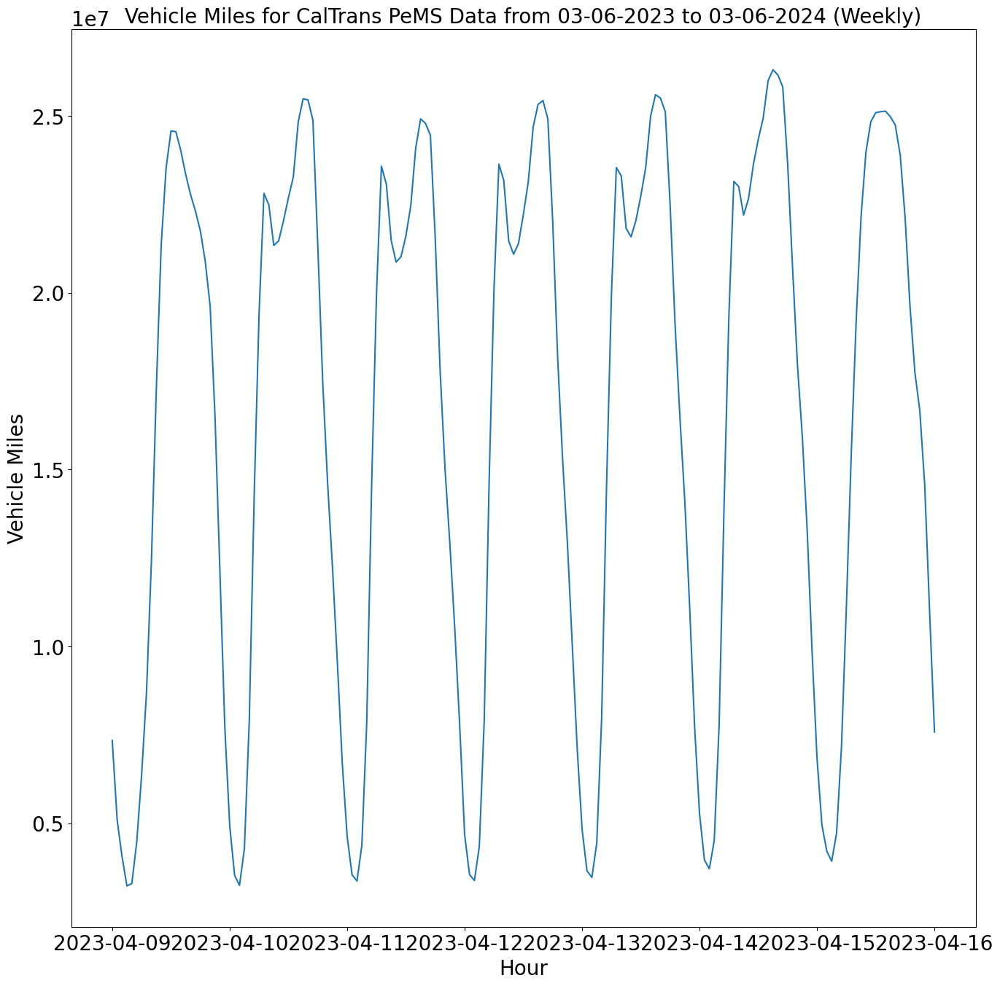

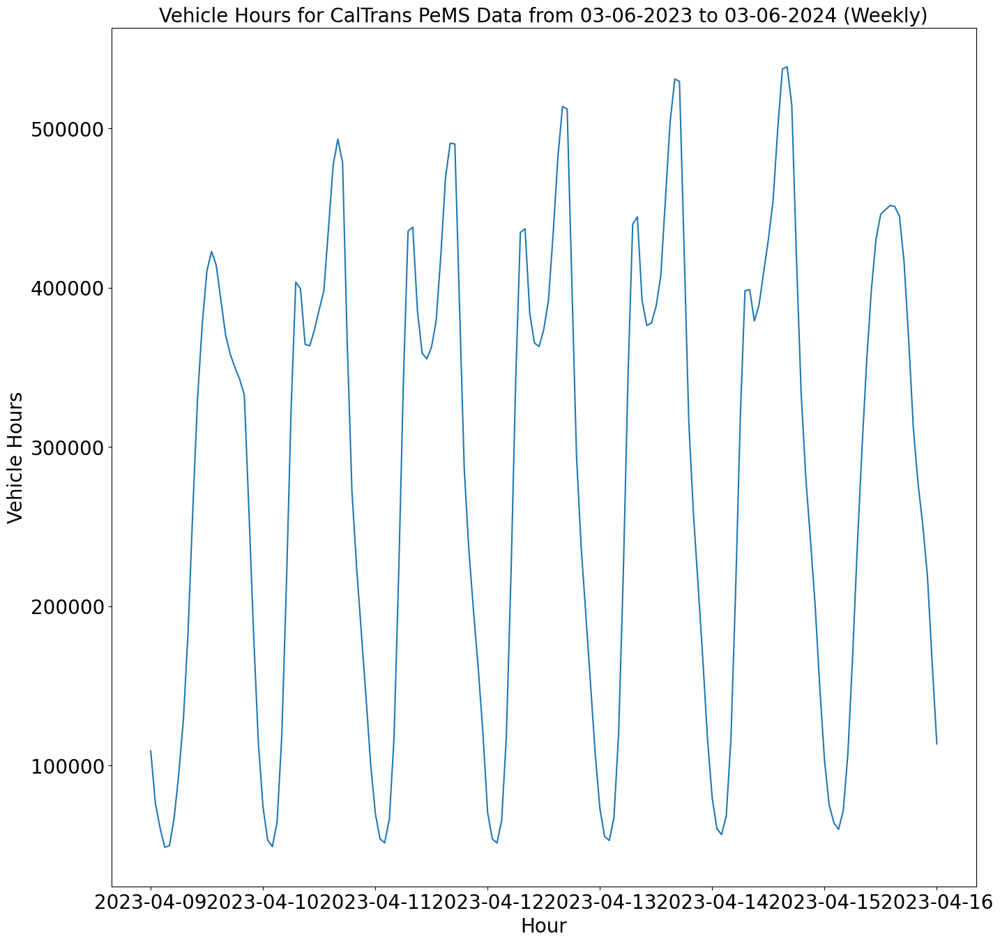

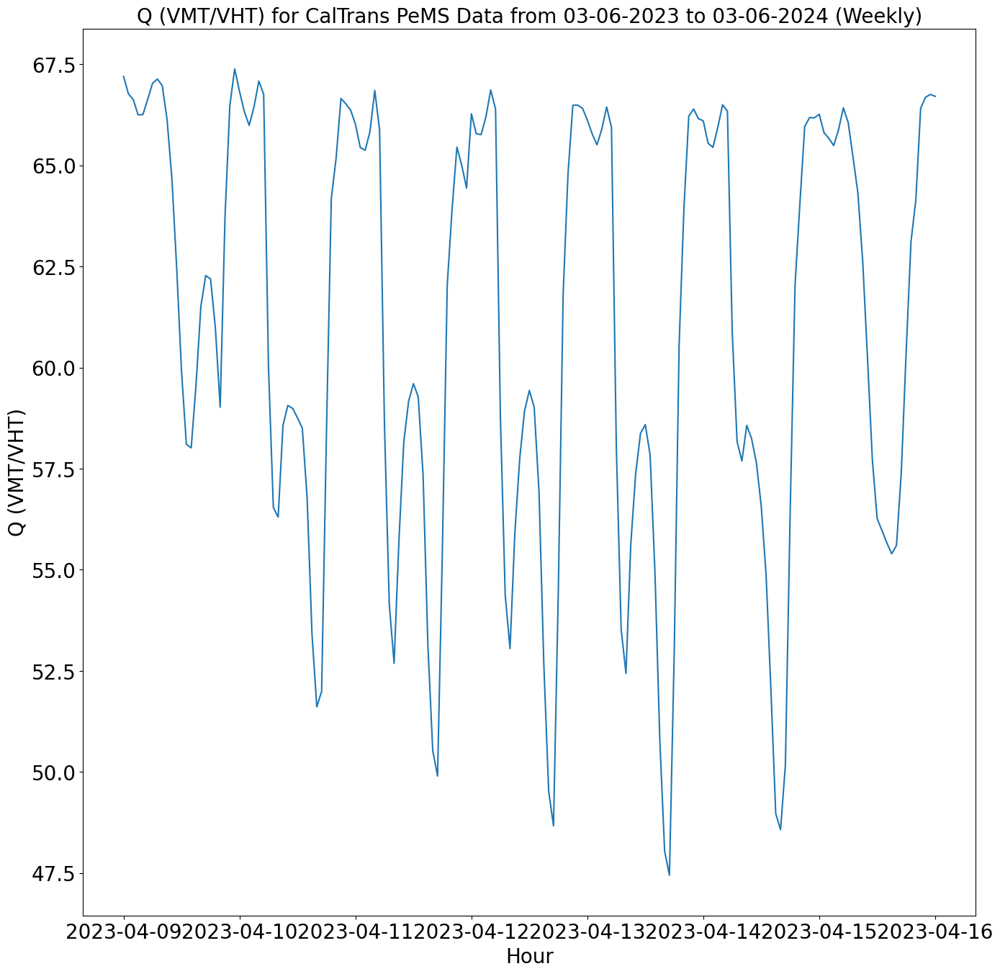

In [27]:
plot_veh_mi_hrs(weekly_df, 0, weekly_df.shape[0], "Weekly", title_name)
plot_veh_mi_hrs_Q(weekly_df['VMT (Veh-Miles)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Vehicle Miles')
plot_veh_mi_hrs_Q(weekly_df['VHT (Veh-Hours)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Vehicle Hours')
plot_veh_mi_hrs_Q(weekly_df['Q (VMT/VHT)'], 0, weekly_df.shape[0], "Weekly",
                  title_name, 'Q (VMT/VHT)')

### Monthly Plots (Seasonality)

In [28]:
monthly_df = df.query("Hour >= '2023-05-01' \
                       and Hour <= '2023-06-01'")

monthly_df

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed
Hour,,,,,
2023-05-01 00:00:00,5026912.3,75439.4,66.635104,431709,52.5
2023-05-01 01:00:00,3701062.9,55985.2,66.107880,431704,52.5
2023-05-01 02:00:00,3414046.6,51859.2,65.832998,431698,52.5
2023-05-01 03:00:00,4413611.8,66772.5,66.099244,431704,52.4
2023-05-01 04:00:00,8122783.4,122095.1,66.528332,431719,52.4
...,...,...,...,...,...
2023-05-31 20:00:00,15473197.3,238845.5,64.783290,431647,48.7
2023-05-31 21:00:00,13272015.7,199268.5,66.603681,431741,48.7
2023-05-31 22:00:00,10321713.0,154610.6,66.759414,431748,48.5


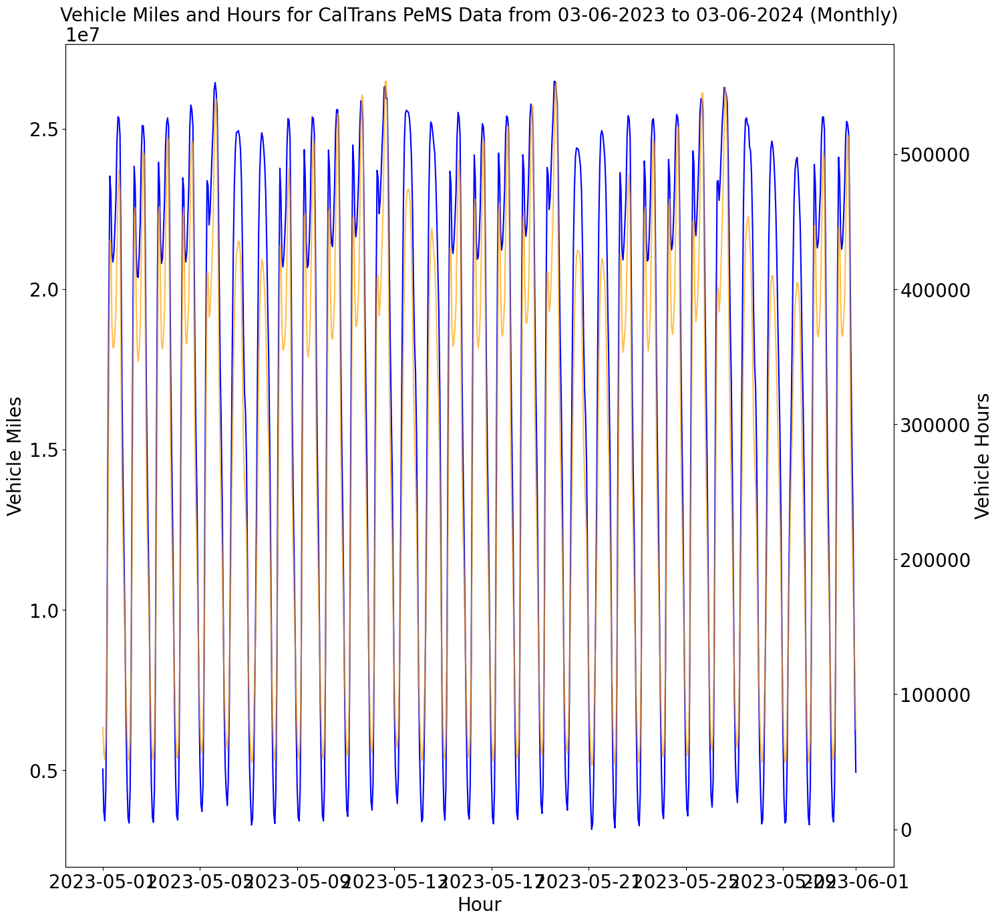

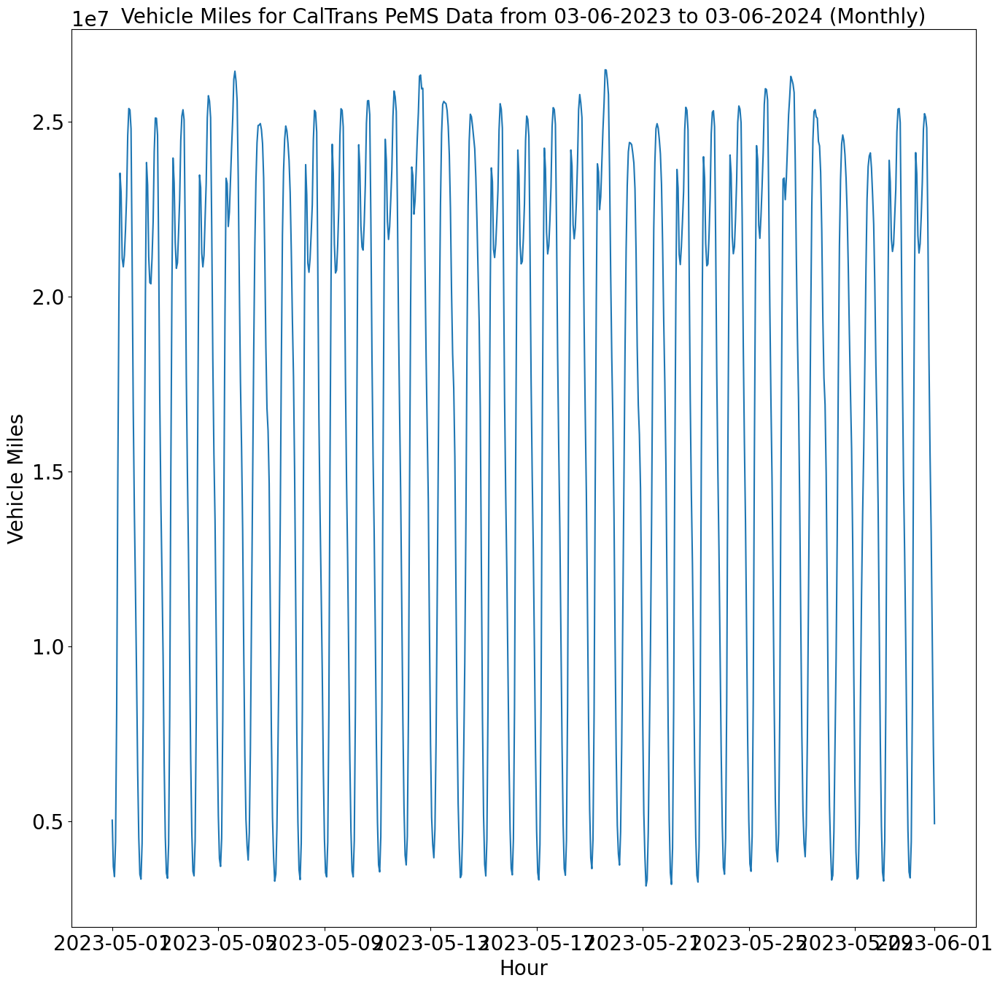

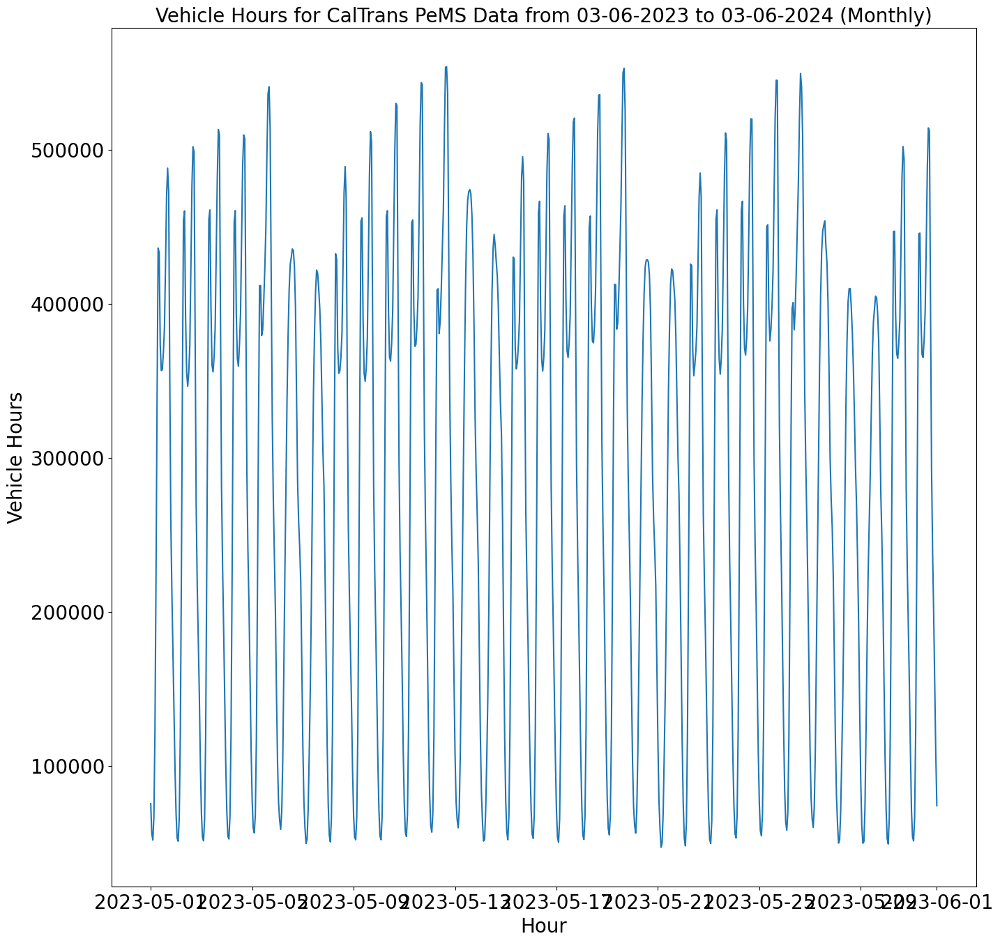

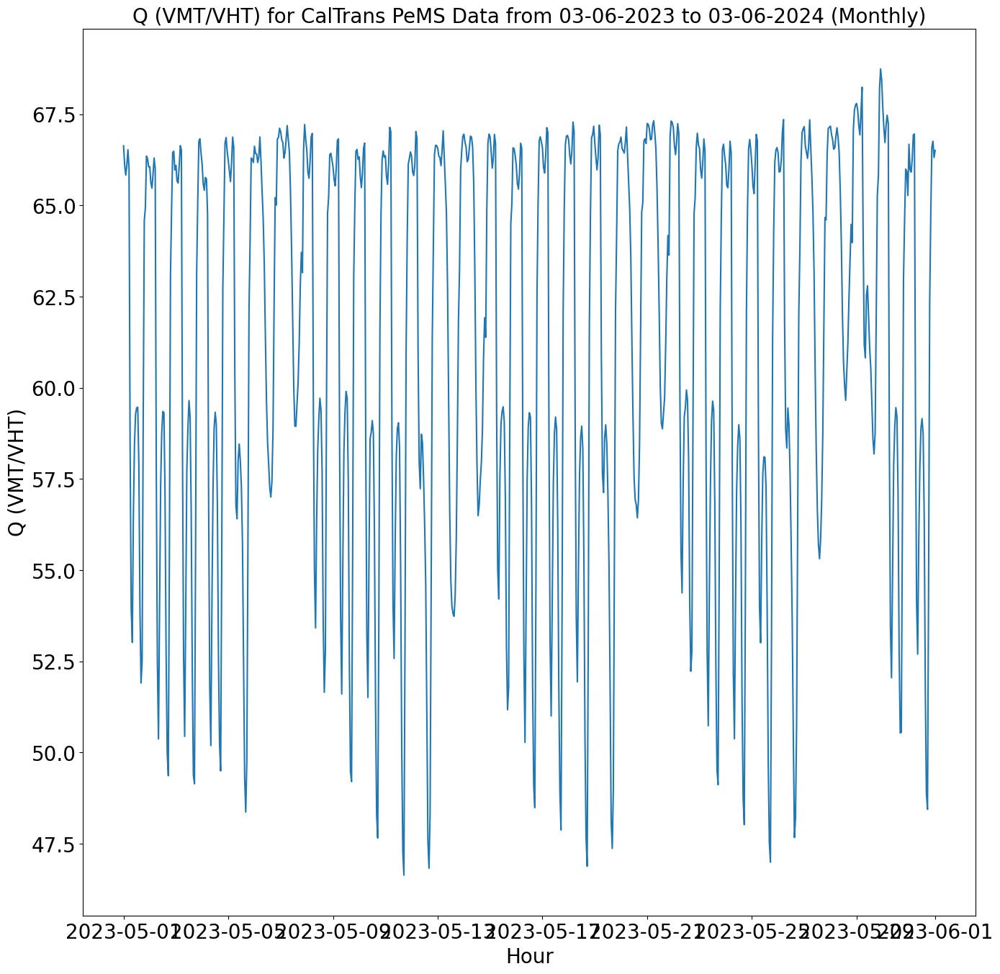

In [29]:
plot_veh_mi_hrs(monthly_df, 0, monthly_df.shape[0], "Monthly", title_name)
plot_veh_mi_hrs_Q(monthly_df['VMT (Veh-Miles)'], 0, monthly_df.shape[0],
                  "Monthly", title_name, 'Vehicle Miles')
plot_veh_mi_hrs_Q(monthly_df['VHT (Veh-Hours)'], 0, monthly_df.shape[0],
                  "Monthly", title_name, 'Vehicle Hours')
plot_veh_mi_hrs_Q(monthly_df['Q (VMT/VHT)'], 0, monthly_df.shape[0], "Monthly",
                  title_name, 'Q (VMT/VHT)')

# Normalization Process

In [30]:
def get_scaler(scaler):
    scalers = {
        "minmax": MinMaxScaler,
        "standard": StandardScaler,
        "maxabs": MaxAbsScaler,
        "robust": RobustScaler,
    }
    return scalers.get(scaler.lower())()

def normalize_data(df):
    scaler_type = 'minmax'
    #scaler_type = input("Enter a scaler type (minmax,standard, maxabs, robust): ")
    if (scaler_type != 'minmax') and (scaler_type != 'standard') and (scaler_type != 'maxabs') and (scaler_type != 'robust'):
      runtime.unassign()

    scaler = get_scaler(scaler_type)
    normalized_data_vmt = scaler.fit_transform(df['VMT (Veh-Miles)'].
                                               values.reshape(-1,1))
    df['vmt_norm'] = normalized_data_vmt
    normalized_data_vht = scaler.fit_transform(df['VHT (Veh-Hours)'].
                                               values.reshape(-1,1))
    df['vht_norm'] = normalized_data_vht
    normalized_data_Q = scaler.fit_transform(df['Q (VMT/VHT)'].
                                               values.reshape(-1,1))
    df['Q_norm'] = normalized_data_Q
    return df, scaler

df_norm, scaler = normalize_data(df)
df_norm_mon, scaler = normalize_data(monthly_df)
df_norm_wk, scaler = normalize_data(weekly_df)
df_norm_day, scaler = normalize_data(monthly_df)


In [31]:
df_norm

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...
2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477


## Plot VMT, VHT, Q Normalized based on Trend and Seasonality.

Now after normalization we can observe that the data range on y-axis is 0.0 - 1.0.

### Yearly Plots (Trend)

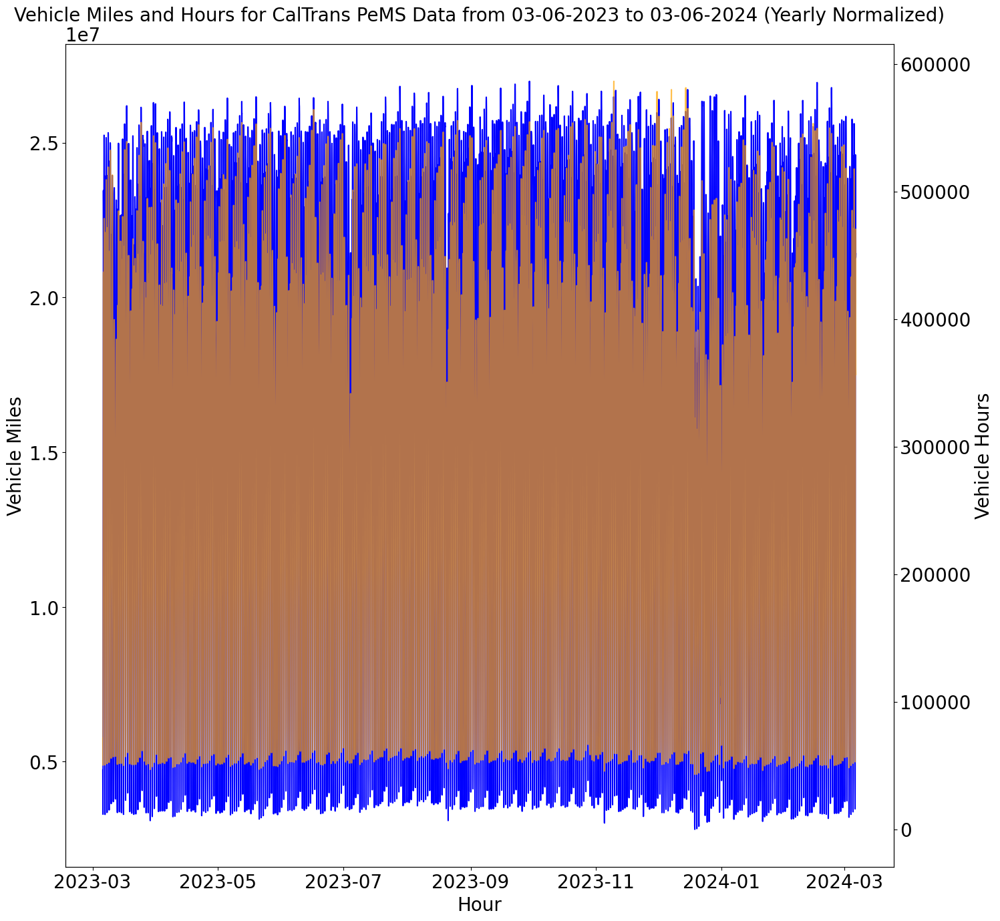

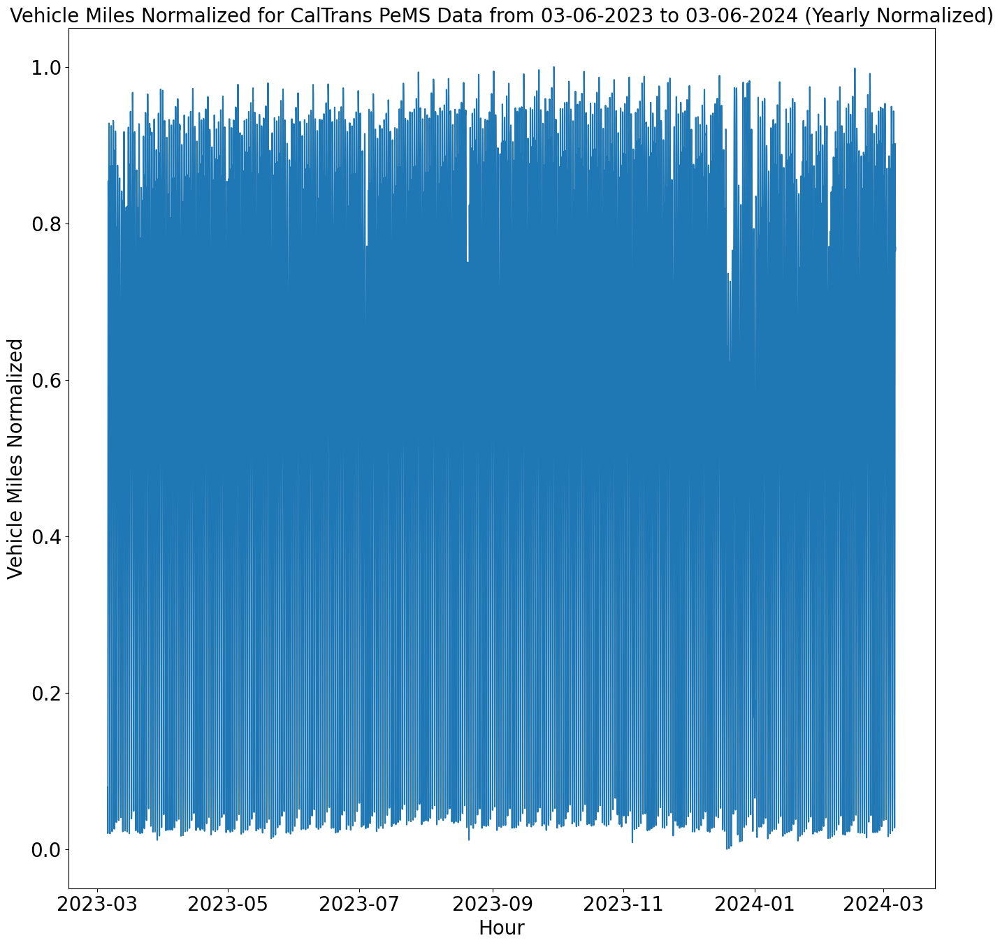

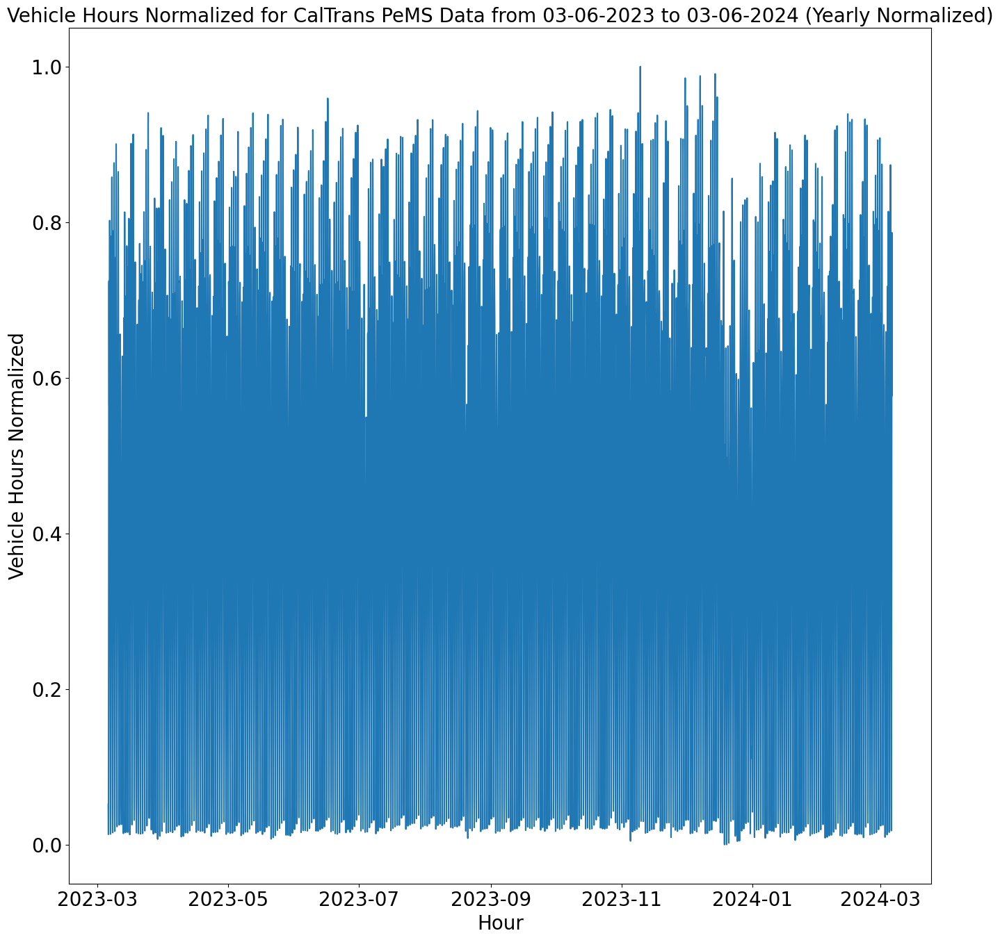

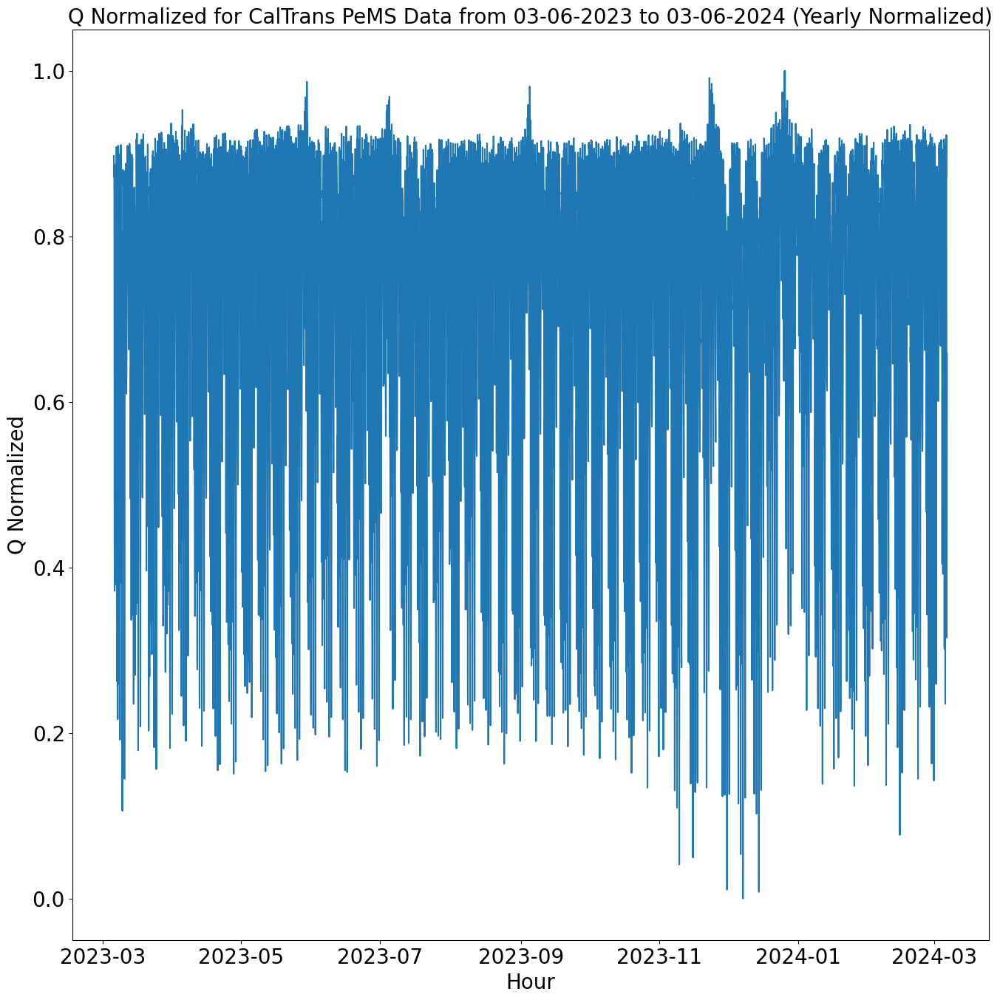

In [32]:
plot_veh_mi_hrs(df_norm, 0, df_norm.shape[0], 'Yearly Normalized', title_name)
plot_veh_mi_hrs_Q(df_norm['vmt_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Vehicle Miles Normalized')
plot_veh_mi_hrs_Q(df_norm['vht_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Vehicle Hours Normalized')
plot_veh_mi_hrs_Q(df_norm['Q_norm'], 0, df_norm.shape[0], 'Yearly Normalized',
                  title_name, 'Q Normalized')

### Daily Plots (Seasonality)

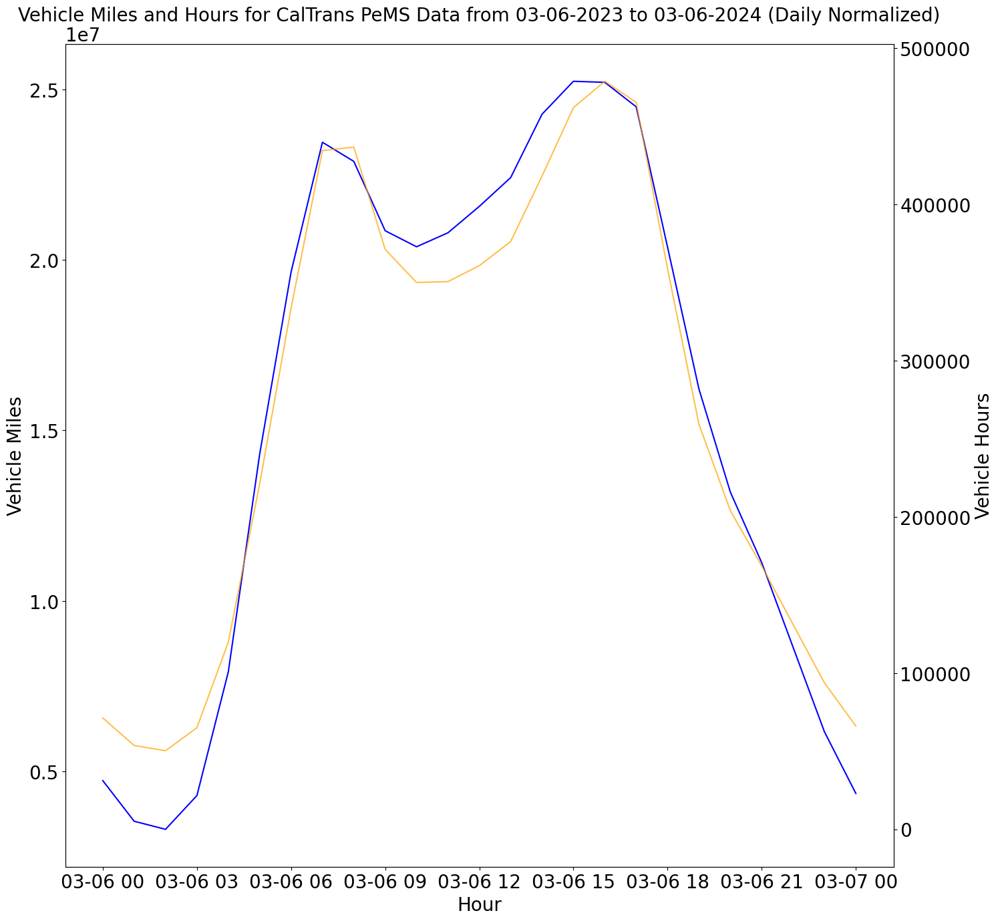

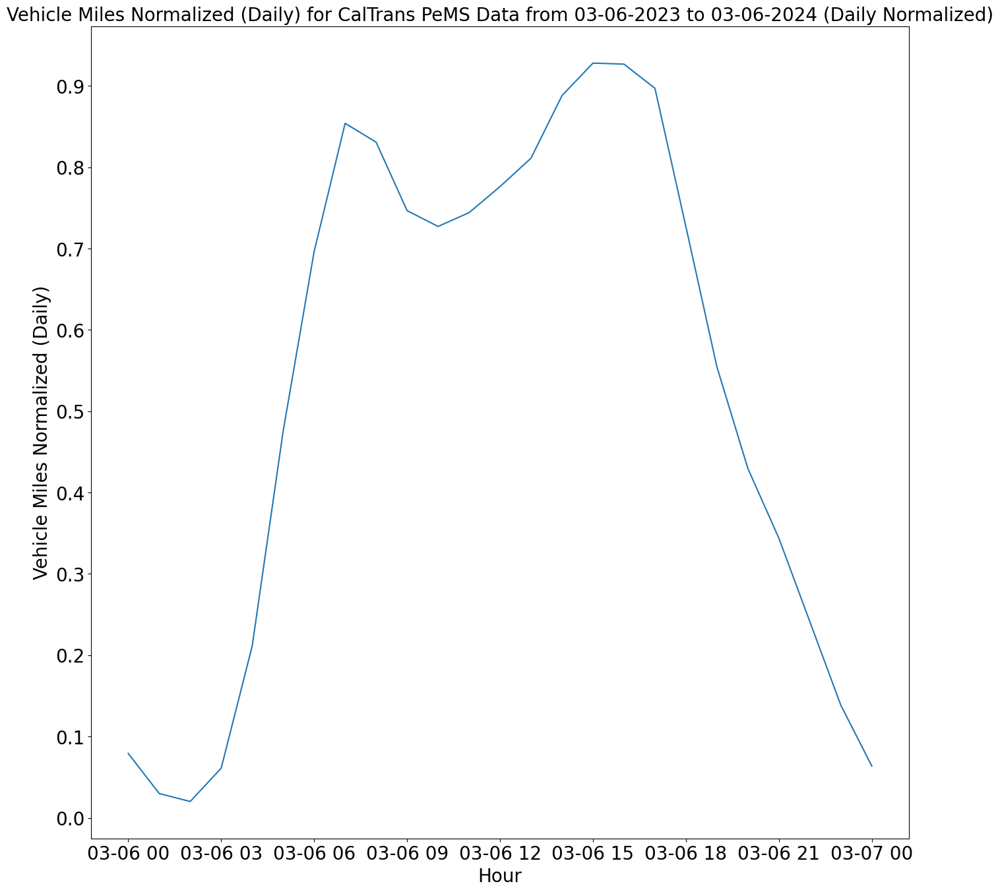

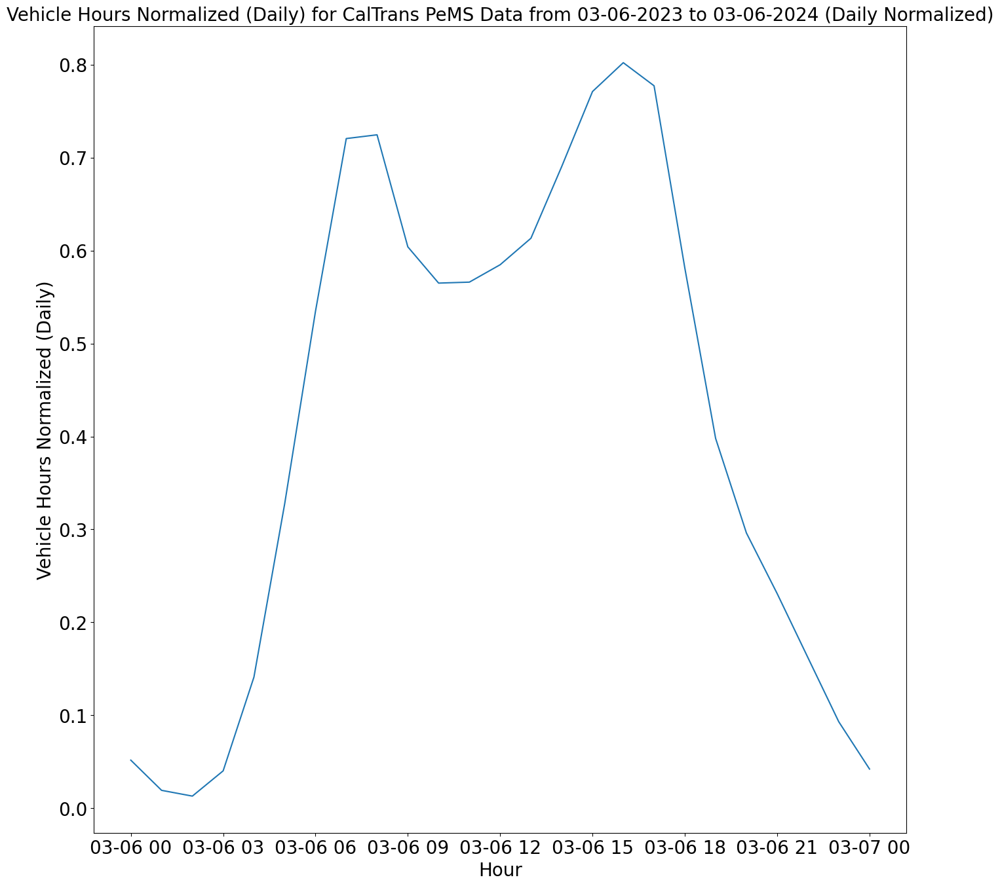

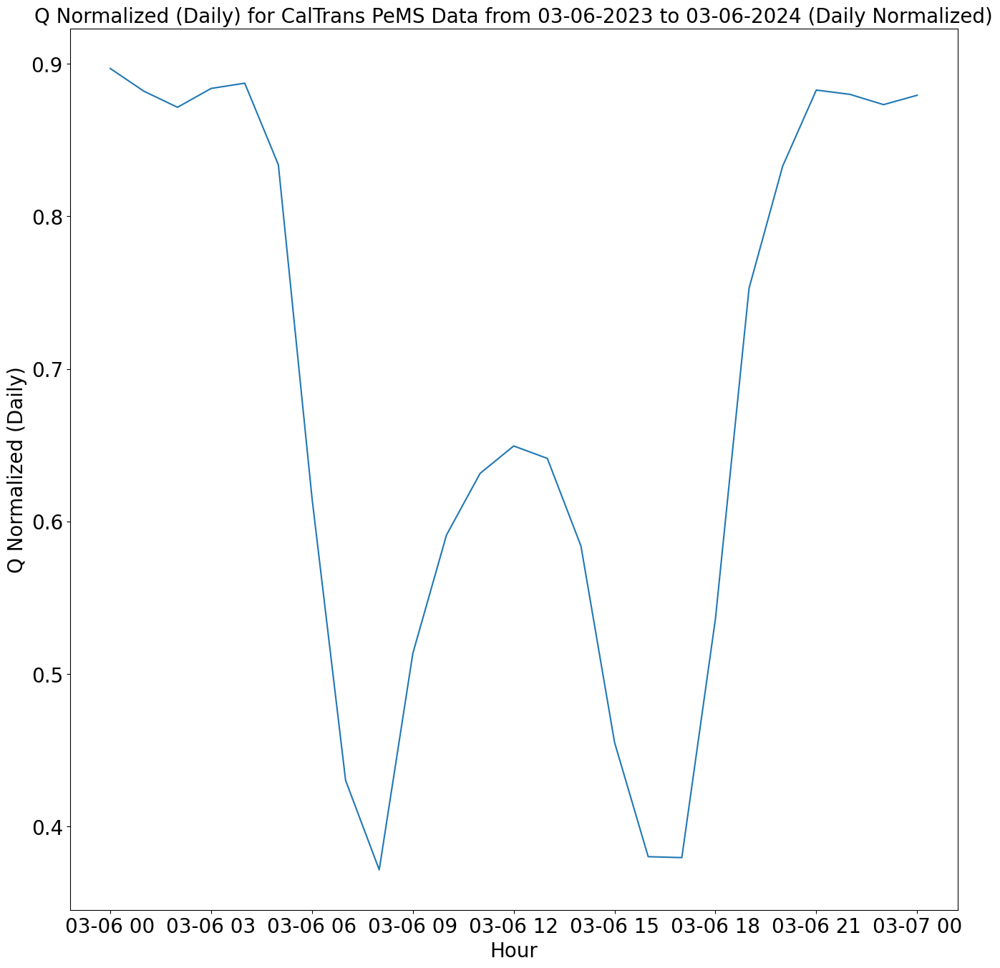

In [33]:
plot_veh_mi_hrs(df_norm, 0, 25, 'Daily Normalized', title_name)
plot_veh_mi_hrs_Q(df_norm['vmt_norm'], 0, 25, 'Daily Normalized', title_name,
                  'Vehicle Miles Normalized (Daily)')
plot_veh_mi_hrs_Q(df_norm['vht_norm'], 0, 25, 'Daily Normalized', title_name,
                  'Vehicle Hours Normalized (Daily)')
plot_veh_mi_hrs_Q(df_norm['Q_norm'], 0, 25, 'Daily Normalized', title_name,
                  'Q Normalized (Daily)')

### Weekly Plots (Seasonality)

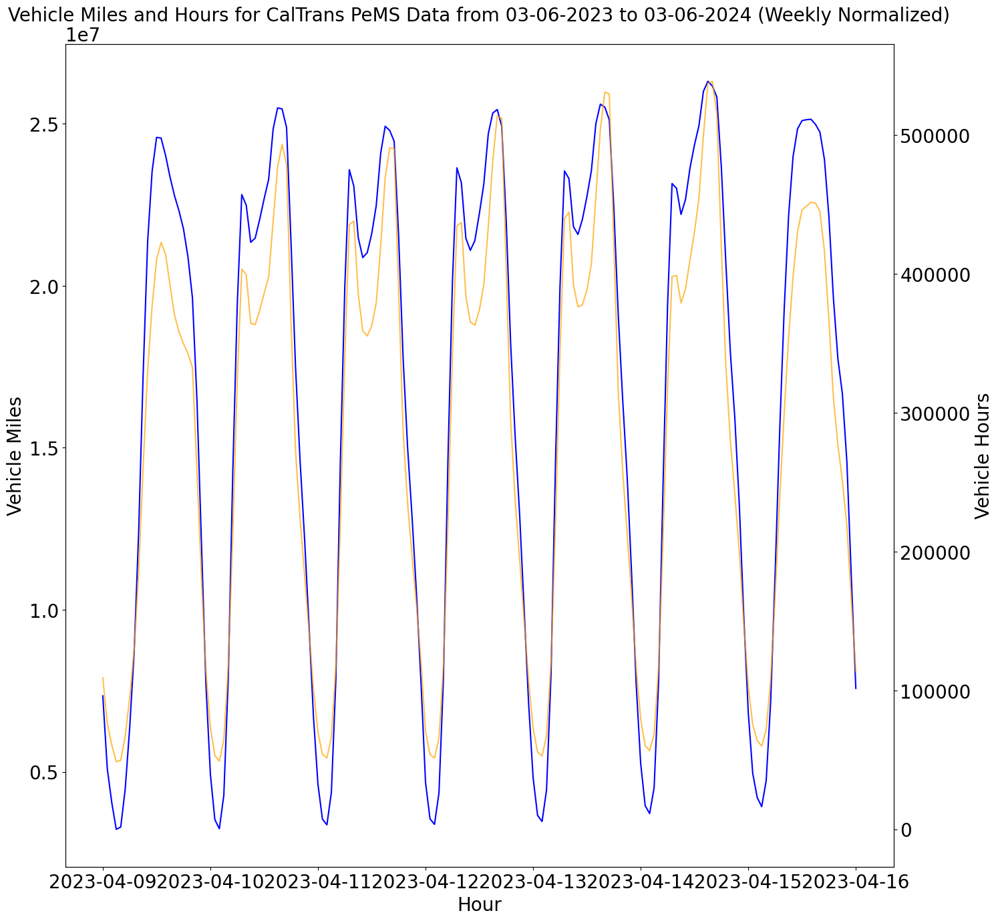

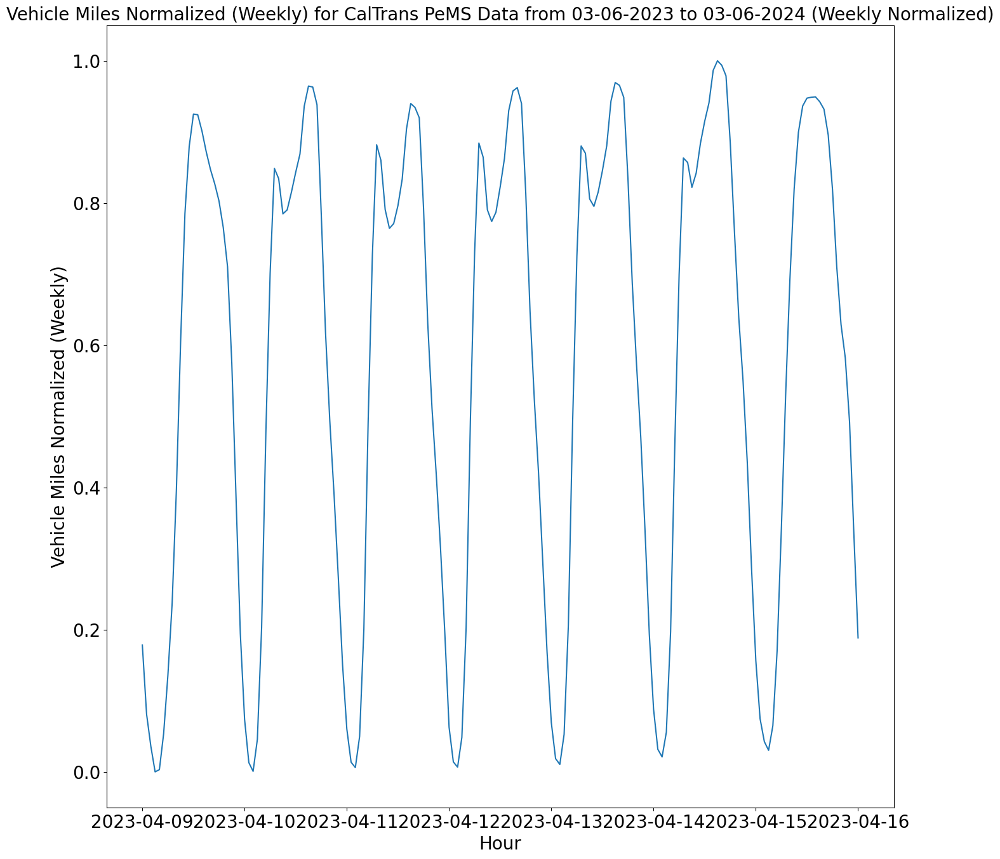

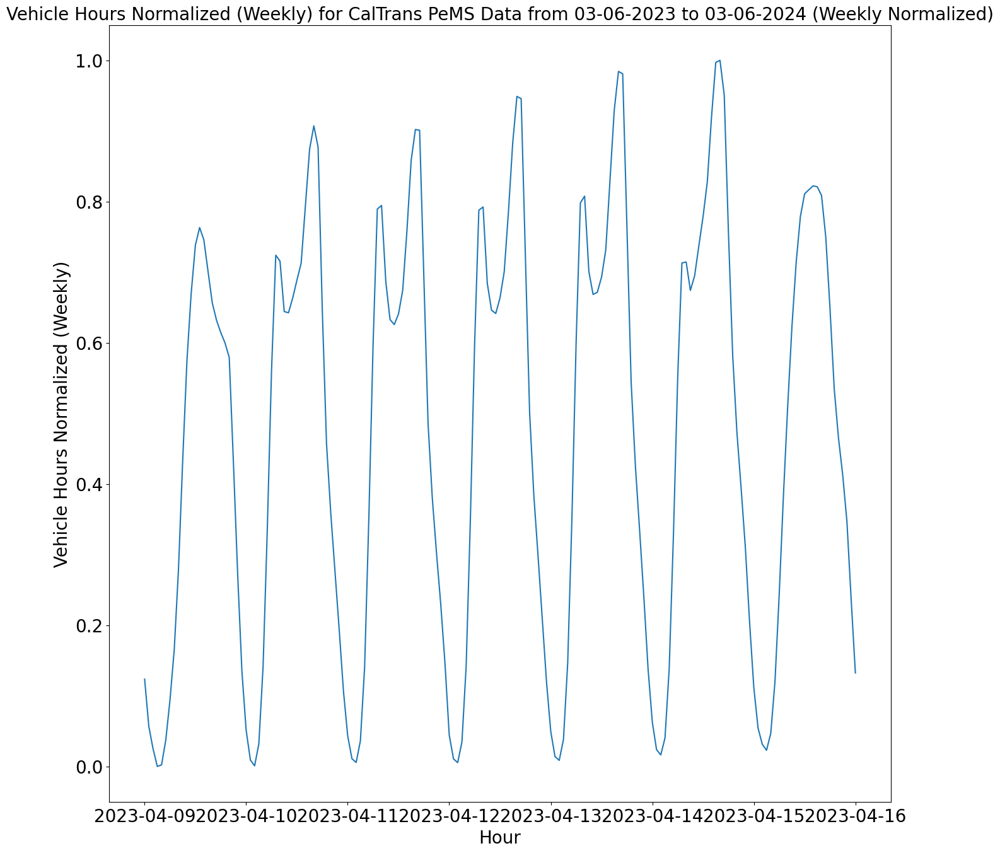

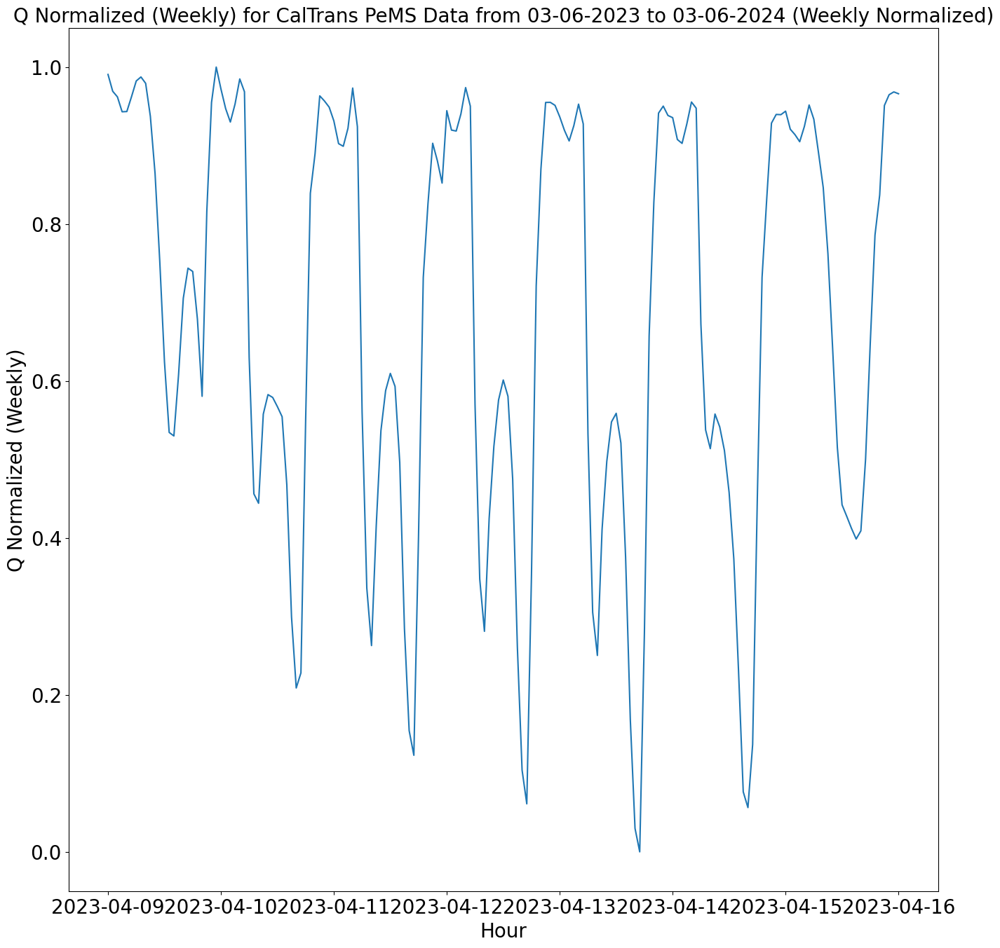

In [34]:
plot_veh_mi_hrs(df_norm_wk, 0, df_norm_wk.shape[0], 'Weekly Normalized',
                title_name)
plot_veh_mi_hrs_Q(df_norm_wk['vmt_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name,
                  'Vehicle Miles Normalized (Weekly)')
plot_veh_mi_hrs_Q(df_norm_wk['vht_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name,
                  'Vehicle Hours Normalized (Weekly)')
plot_veh_mi_hrs_Q(df_norm_wk['Q_norm'], 0, df_norm_wk.shape[0],
                  'Weekly Normalized', title_name, 'Q Normalized (Weekly)')

### Monthly Plots (Seasonality)

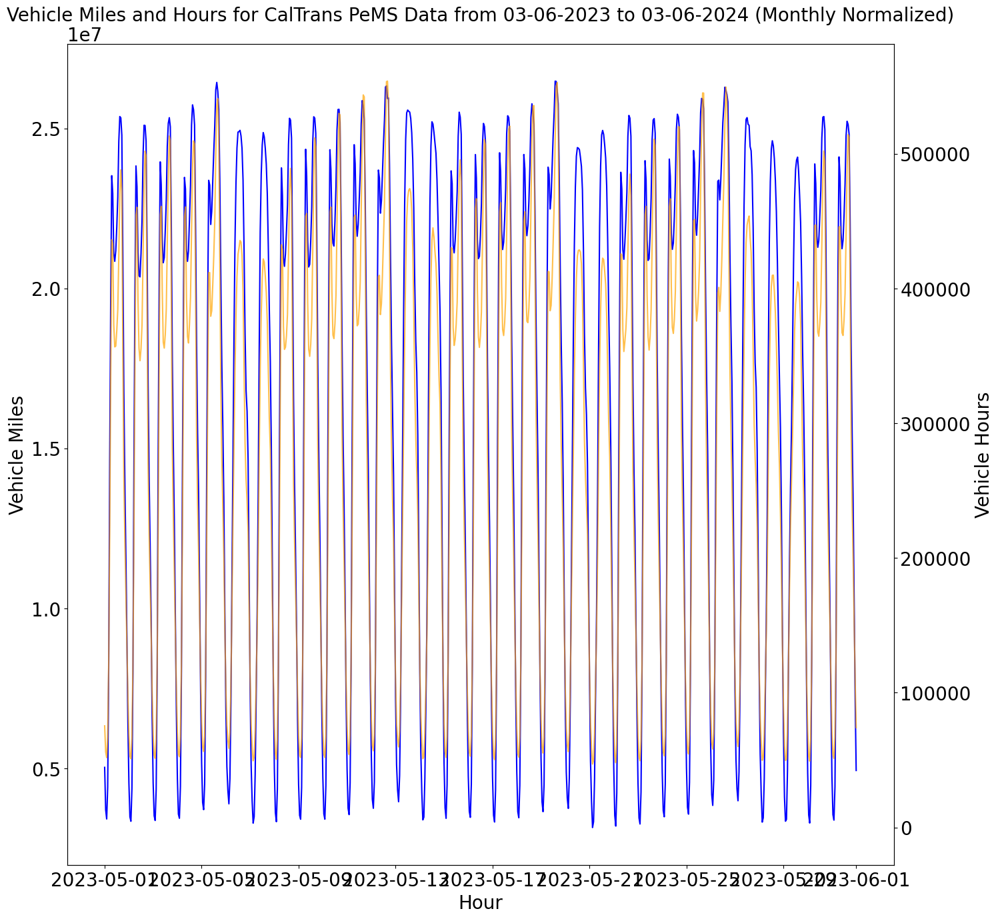

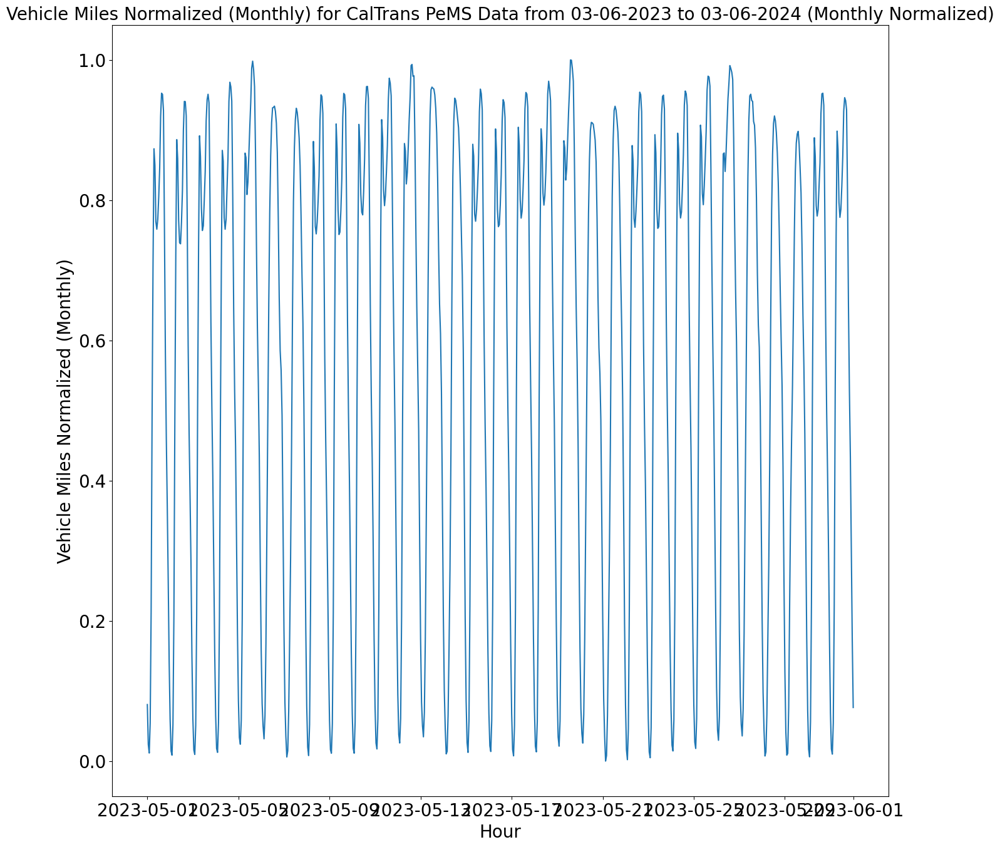

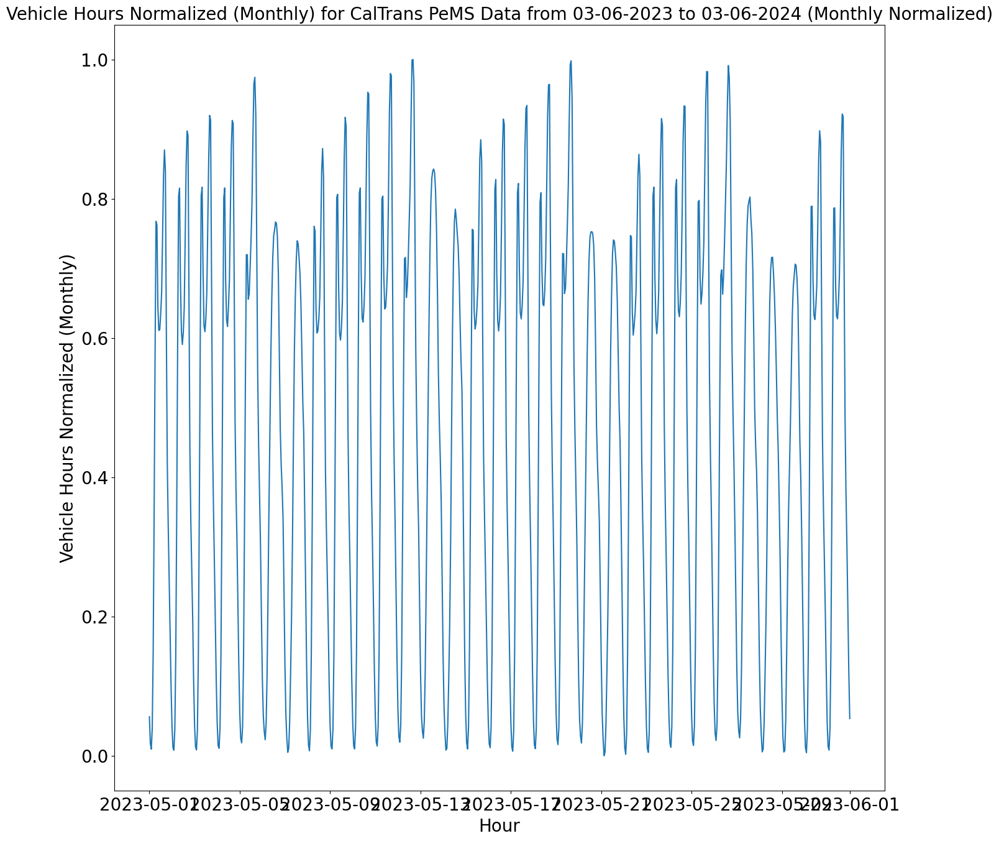

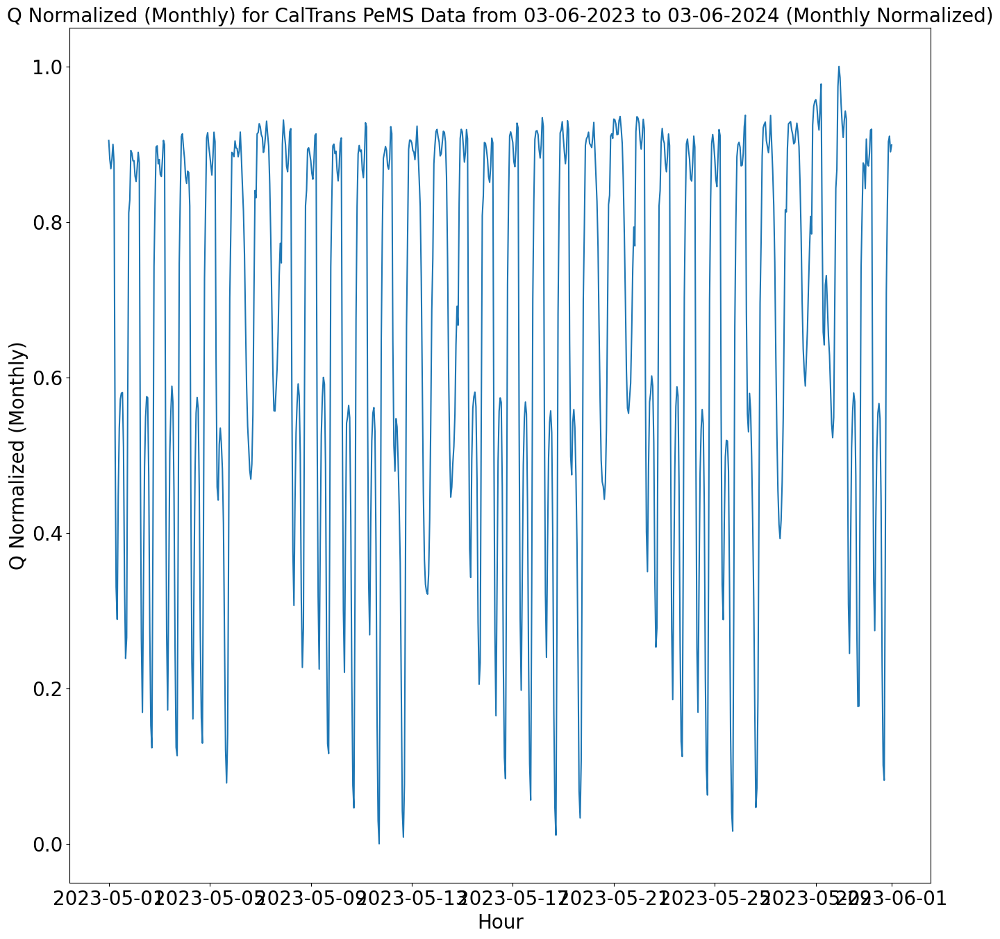

In [35]:
plot_veh_mi_hrs(df_norm_mon, 0, df_norm_mon.shape[0], 'Monthly Normalized',
                title_name)
plot_veh_mi_hrs_Q(df_norm_mon['vmt_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Vehicle Miles Normalized (Monthly)')
plot_veh_mi_hrs_Q(df_norm_mon['vht_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Vehicle Hours Normalized (Monthly)')
plot_veh_mi_hrs_Q(df_norm_mon['Q_norm'], 0, df_norm_mon.shape[0],
                  'Monthly Normalized', title_name,
                  'Q Normalized (Monthly)')

# Let's observe train and test data on the graph

## Split into Train/Test Data.

In [36]:
# Parameters
#n_folds = 5
#horizon = 1   # one-step ahead forecasting

# Compute fold boundaries
#total_len = len(df)
#fold_size = int((total_len * 0.2) / n_folds)   # test region = last 20%

# Rolling-origin expanding window
#train_end = int(total_len * 0.8) + n_folds * fold_size
#test_start = train_end
#test_end = test_start + fold_size

#if test_end > total_len:
#    test_end = total_len

#print(f"Train: 0 → {train_end}")
#print(f"Test : {test_start} → {test_end}")

#print("Total length:", total_len)
#print("Fold size:", fold_size)
test_size = 0.2 # Set Split rate to 4:1 (80 % Training 20 % Test).
split_pos = int(df.shape[0]*(1 - test_size))
df = df.reset_index()
df

,Hour,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
0,2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
1,2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2,2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
3,2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
4,2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342
...,...,...,...,...,...,...,...,...,...
8790,2024-03-06 07:00:00,24603494.5,463279.8,53.107203,443975,54.1,0.901642,0.773489,0.397474
8791,2024-03-06 08:00:00,23952196.6,470345.1,50.924729,443974,54.2,0.874690,0.786497,0.315210
8792,2024-03-06 09:00:00,22128475.5,404745.4,54.672581,444146,53.0,0.799220,0.665724,0.456477
8793,2024-03-06 10:00:00,21287942.9,362457.5,58.732246,443929,49.3,0.764437,0.587870,0.609496


In [37]:
# 2019-02-06 will be the date seperation. Dates past this will be the test set.
split_date = str(df.Hour[split_pos])
#split_date = split_date[:10]
#DOM_train = df_norm.loc[df_norm.index <= split_date].copy()
DOM_train = df.loc[df_norm.index <= split_date].copy()
#DOM_test = df_norm.loc[df_norm.index > split_date].copy()
DOM_test = df.loc[df_norm.index > split_date].copy()
split_date

'2023-12-24 05:00:00'

## Plot Train/Test Split Graphs.

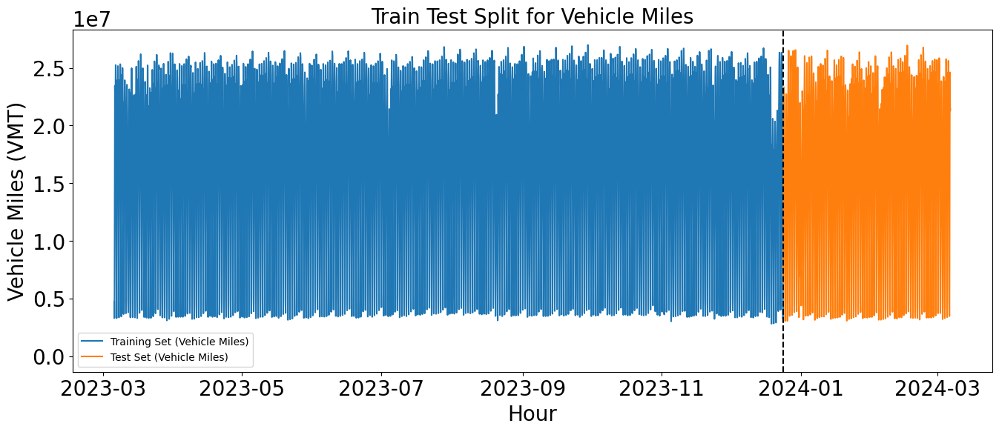

In [38]:
# Vehicle Miles
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['VMT (Veh-Miles)'],
         label='Training Set (Vehicle Miles)')
plt.plot(DOM_test['Hour'], DOM_test['VMT (Veh-Miles)'],
         label='Testing Set (Vehicle Miles)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Vehicle Miles)', 'Test Set (Vehicle Miles)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("Vehicle Miles (VMT)", fontsize = 20)
plt.title("Train Test Split for Vehicle Miles", fontsize = 20)
plt.show()

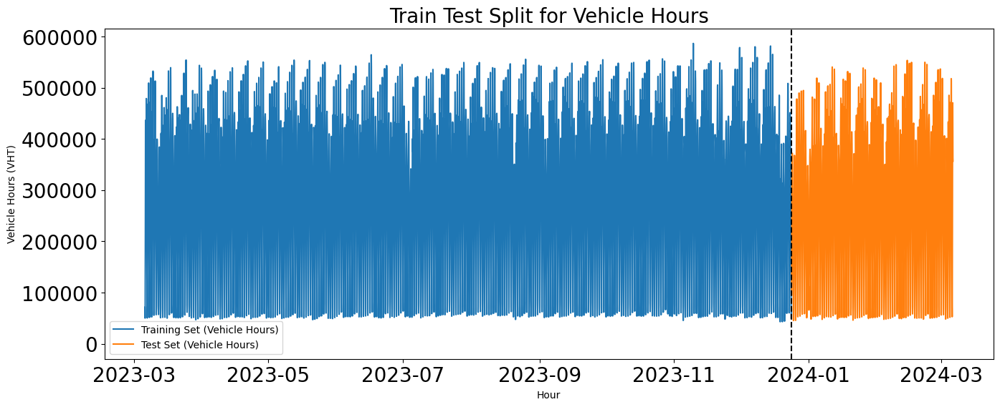

In [39]:
# Vehicle Miles
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['VHT (Veh-Hours)'],
         label='Training Set (Vehicle Hours)')
plt.plot(DOM_test['Hour'], DOM_test['VHT (Veh-Hours)'],
         label='Testing Set (Vehicle Hours)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Vehicle Hours)', 'Test Set (Vehicle Hours)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour")
plt.ylabel("Vehicle Hours (VHT)")
plt.title("Train Test Split for Vehicle Hours", fontsize = 20)
plt.show()

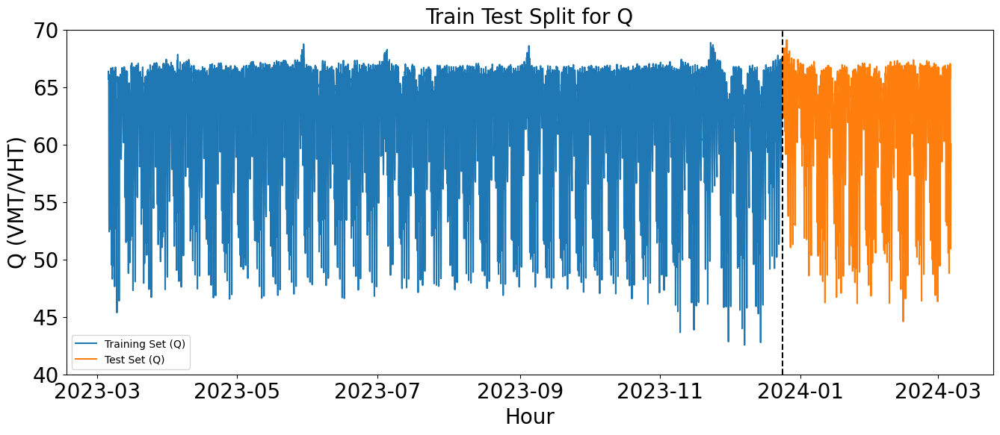

In [40]:
# Q is the sum of VMT divided by the sum of VHT or space mean
# speeds/harmonic mean of speeds on the freeway.
plt.figure(figsize=(16,6))
plt.plot(DOM_train['Hour'], DOM_train['Q (VMT/VHT)'],
         label='Training Set (Vehicle Hours)')
plt.plot(DOM_test['Hour'], DOM_test['Q (VMT/VHT)'],
         label='Testing Set (Vehicle Hours)')
plt.axvline(x = df.Hour[split_pos], color='black', ls='--')
plt.legend(['Training Set (Q)', 'Test Set (Q)'])
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.xlabel("Hour", fontsize = 20)
plt.ylabel("Q (VMT/VHT)", fontsize = 20)
plt.ylim([40, 70])
plt.title("Train Test Split for Q", fontsize = 20)
plt.show()

In [41]:
# We index the Datetime column after transformation
df.set_index('Hour', inplace=True)
df.head()

,VMT (Veh-Miles),VHT (Veh-Hours),Q (VMT/VHT),# Lane Points,% Observed,vmt_norm,vht_norm,Q_norm
Hour,,,,,,,,
2023-03-06 00:00:00,4730945.9,71292.8,66.359379,430583,55.0,0.079266,0.051819,0.896983
2023-03-06 01:00:00,3539705.6,53661.0,65.964212,430728,55.0,0.029970,0.019358,0.882088
2023-03-06 02:00:00,3303421.8,50292.4,65.684314,430476,54.9,0.020192,0.013156,0.871538
2023-03-06 03:00:00,4293866.2,65046.6,66.012154,430728,54.9,0.061179,0.040319,0.883895
2023-03-06 04:00:00,7919316.8,119801.6,66.103598,430728,54.8,0.211209,0.141126,0.887342


# Prepare Data for Training the Models.

* With the following function block, let's set our data set as training and test data set in a model appropriate way

In [167]:
def load_data(data, seq_len):
    X_train = []
    y_train = []

    for i in range(seq_len, len(data)):
        X_train.append(data.iloc[i-seq_len : i, 0])
        y_train.append(data.iloc[i, 0])

    # last days are going to be used in test
    X_test = X_train[split_pos:]
    y_test = y_train[split_pos:]

    # first  days are going to be used in training
    X_train = X_train[:split_pos]
    y_train = y_train[:split_pos]

    # convert to numpy array
    X_train = np.array(X_train)
    y_train = np.array(y_train)
    X_test = np.array(X_test)
    y_test = np.array(y_test)

    # reshape data for input into (samples, timesteps = seq_len, features = 1).
    X_train = np.reshape(X_train, (split_pos, seq_len, 1))
    X_test = np.reshape(X_test, (X_test.shape[0], seq_len, 1))

    return [X_train, y_train, X_test, y_test]

* The **seq_len** parameter determines how far back the model will look at historical data, helping the model to capture time dependencies. This will be the timesteps we will use.
* We should note that if **seq_len** is too large, the model can become complex and prone to overlearning. For purposes of this implementation, **seq_len** will be fixed to 20 for all models.

In [168]:
df_vht = df_norm.copy()
df_vht = df_vht.drop(columns = ['VMT (Veh-Miles)', 'VHT (Veh-Hours)',
                                'Q (VMT/VHT)', '# Lane Points', '% Observed',
                                'vmt_norm', 'Q_norm'])
#df_vht = df.copy()
#df_vht = df_vht.drop(columns = ['VMT (Veh-Miles)', '# Lane Points',
#                                '% Observed', 'vmt_norm', 'vht_norm'])

df_vmt = df_norm.copy()
df_vmt = df_vmt.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                                'Q (VMT/VHT)', '# Lane Points', '% Observed',
                                'vht_norm', 'Q_norm'])
#df_vmt = df.copy()
#df_vmt = df_vmt.drop(columns = ['VHT (Veh-Hours)','# Lane Points',
#                                '% Observed', 'vmt_norm', 'vht_norm'])

df_Q = df_norm.copy()
df_Q = df_Q.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                            'Q (VMT/VHT)', '# Lane Points', '% Observed',
                            'vmt_norm', 'vht_norm'])

#df_Q = df_norm.copy()
#df_Q = df_Q.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
#                            '# Lane Points', '% Observed', 'vmt_norm',
#                            'vht_norm', 'Q_norm'])

In [169]:
df_norm2 = df_norm.drop(columns = ['VHT (Veh-Hours)', 'VMT (Veh-Miles)',
                                   '# Lane Points', '% Observed',])
df_norm2

,Q (VMT/VHT),vmt_norm,vht_norm,Q_norm
Hour,,,,
2023-03-06 00:00:00,66.359379,0.079266,0.051819,0.896983
2023-03-06 01:00:00,65.964212,0.029970,0.019358,0.882088
2023-03-06 02:00:00,65.684314,0.020192,0.013156,0.871538
2023-03-06 03:00:00,66.012154,0.061179,0.040319,0.883895
2023-03-06 04:00:00,66.103598,0.211209,0.141126,0.887342
...,...,...,...,...
2024-03-06 07:00:00,53.107203,0.901642,0.773489,0.397474
2024-03-06 08:00:00,50.924729,0.874690,0.786497,0.315210
2024-03-06 09:00:00,54.672581,0.799220,0.665724,0.456477


In [170]:
df_vht

,vht_norm
Hour,
2023-03-06 00:00:00,0.051819
2023-03-06 01:00:00,0.019358
2023-03-06 02:00:00,0.013156
2023-03-06 03:00:00,0.040319
2023-03-06 04:00:00,0.141126
...,...
2024-03-06 07:00:00,0.773489
2024-03-06 08:00:00,0.786497
2024-03-06 09:00:00,0.665724


In [171]:
df_vmt

,vmt_norm
Hour,
2023-03-06 00:00:00,0.079266
2023-03-06 01:00:00,0.029970
2023-03-06 02:00:00,0.020192
2023-03-06 03:00:00,0.061179
2023-03-06 04:00:00,0.211209
...,...
2024-03-06 07:00:00,0.901642
2024-03-06 08:00:00,0.874690
2024-03-06 09:00:00,0.799220


In [172]:
df_Q

,Q_norm
Hour,
2023-03-06 00:00:00,0.896983
2023-03-06 01:00:00,0.882088
2023-03-06 02:00:00,0.871538
2023-03-06 03:00:00,0.883895
2023-03-06 04:00:00,0.887342
...,...
2024-03-06 07:00:00,0.397474
2024-03-06 08:00:00,0.315210
2024-03-06 09:00:00,0.456477


In [173]:
a = int(input("Enter a number (Odd Number for Vehicle Hours,\
Even Number for Vehicle Miles\Odd Number divisible by 3 for Q (Space Mean/\
Harmonic Speed)): "))

feature = ""
selected_df = ""
feature_norm = ""
feature_field = ""

if a % 2 == 0:
    feature = 'Vehicle Miles Traveled'
    selected_df = df_vmt
    feature_norm = 'vmt_norm'
    feature_field = 'VMT (Veh-Miles)'

elif a % 3 == 0:
    feature = 'Efficiency (Q)'
    selected_df = df_Q
    feature_norm = 'Q_norm'
    feature_field = 'Q (VMT/VHT)'

else:
    feature = 'Vehicle Hours Traveled'
    selected_df = df_vht
    feature_norm = 'vht_norm'
    feature_field = 'VHT (Veh-Hours)'

print("You've chosen: {0}/{1}/{2}".format(feature, feature_norm, feature_field))

Enter a number (Odd Number for Vehicle Hours,Even Number for Vehicle Miles\Odd Number divisible by 3 for Q (Space Mean/Harmonic Speed)): 0
You've chosen: Vehicle Miles Traveled/vmt_norm/VMT (Veh-Miles)


In [174]:
seq_len = 20
#seq_len = 6*24*30

# Let's create train, test data
#X_train, y_train, X_test, y_test = load_data(df_vht, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_vmt, seq_len)
X_train, y_train, X_test, y_test = load_data(selected_df, seq_len)
#X_train, y_train, X_test, y_test = load_data(df_norm2, seq_len)


print('X_train.shape = ',X_train.shape)
print('y_train.shape = ', y_train.shape)
print('X_test.shape = ', X_test.shape)
print('y_test.shape = ',y_test.shape)

X_train.shape =  (7036, 20, 1)
y_train.shape =  (7036,)
X_test.shape =  (1739, 20, 1)
y_test.shape =  (1739,)


In [175]:
X_train

array([[[0.07926628],
        [0.02996975],
        [0.02019173],
        ...,
        [0.89692135],
        [0.72656764],
        [0.55446304]],

       [[0.02996975],
        [0.02019173],
        [0.06117882],
        ...,
        [0.72656764],
        [0.55446304],
        [0.42949795]],

       [[0.02019173],
        [0.06117882],
        [0.21120911],
        ...,
        [0.55446304],
        [0.42949795],
        [0.34384695]],

       ...,

       [[0.04657648],
        [0.01855491],
        [0.02494335],
        ...,
        [0.55887566],
        [0.5138108 ],
        [0.46678385]],

       [[0.01855491],
        [0.02494335],
        [0.07042764],
        ...,
        [0.5138108 ],
        [0.46678385],
        [0.37473629]],

       [[0.02494335],
        [0.07042764],
        [0.1489191 ],
        ...,
        [0.46678385],
        [0.37473629],
        [0.2530959 ]]])

In [176]:
X_test

array([[[0.07042764],
        [0.1489191 ],
        [0.24436634],
        ...,
        [0.37473629],
        [0.2530959 ],
        [0.15760465]],

       [[0.1489191 ],
        [0.24436634],
        [0.39164711],
        ...,
        [0.2530959 ],
        [0.15760465],
        [0.10355504]],

       [[0.24436634],
        [0.39164711],
        [0.57931876],
        ...,
        [0.15760465],
        [0.10355504],
        [0.03869952]],

       ...,

       [[0.83005035],
        [0.90810516],
        [0.94338187],
        ...,
        [0.74592975],
        [0.90164246],
        [0.87469011]],

       [[0.90810516],
        [0.94338187],
        [0.9414584 ],
        ...,
        [0.90164246],
        [0.87469011],
        [0.79921993]],

       [[0.94338187],
        [0.9414584 ],
        [0.91959459],
        ...,
        [0.87469011],
        [0.79921993],
        [0.76443658]]])

In [177]:
y_train

array([0.42949795, 0.34384695, 0.24119178, ..., 0.37473629, 0.2530959 ,
       0.15760465])

In [178]:
y_test

array([0.10355504, 0.03869952, 0.00953947, ..., 0.79921993, 0.76443658,
       0.76941396])

## Essential Variables.

In [179]:
epochs = 10
batch_size = 32
#loss = 'MAE'
loss = 'MSE'
activations = ['tanh', 'relu']
units = [32, 64]
filters = [32, 64]
kernel = [3, 5]
a = input("Enter the number of filters: ")
b = input("Enter the number of units: ")
c = input("Enter the number of kernels: ")
d = input("Select an activation index: ")
if not (a.isdigit()):
  a = random.randint(0, 3)
if not (b.isdigit()):
  b = random.randint(0, 2)
if not (c.isdigit()):
  c = random.randint(0, 2)
if not (d.isdigit()):
  d = random.randint(0, 2)
unit = units[int(a) % 3]
filter = filters[int(b) % 4]
kernel = kernel[int(c) % 3]
activation = activations[int(d) % 3]


Enter the number of filters: 0
Enter the number of units: 0
Enter the number of kernels: 0
Select an activation index: 0


## Training Loss vs. Epochs Plot

Plotting Accuracy and Validation Accuracy vs Epochs. Code taken from https://machinelearningmastery.com/display-deep-learning-model-training-history-in-keras/.

In [180]:
def plot_training_loss(model, model_name):
    model.history.keys()
    plt.plot(model.history['loss'])
    plt.title('Training Loss vs. Epochs for {0}'.format(model_name))
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.show()

In [181]:
@keras.saving.register_keras_serializable()
class LIFNeuron(tf.keras.layers.Layer):
    def __init__(self, threshold=0.5, leak_rate=0.001, **kwargs):
        super(LIFNeuron, self).__init__(**kwargs)
        self.threshold = threshold
        self.leak_rate = leak_rate

    def build(self, input_shape):
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),  # Shape based on input features
            initializer='zeros',
            trainable=False
        )

    def call(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        seq_len = input_shape[1]
        num_features = input_shape[2]

        # Initialize batch of membrane potentials
        batch_membrane_potential = tf.tile(
            tf.expand_dims(self.membrane_potential, axis=0),
            [batch_size, 1]
        )

        # Initialize output tensor
        outputs = tf.TensorArray(dtype=tf.float32, size=seq_len)

        # Iterate over time steps using tf.while_loop
        t = tf.constant(0)
        while_condition = lambda t, outputs, batch_membrane_potential: tf.less(t, seq_len)

        def while_body(t, outputs, batch_membrane_potential):
            current_input = inputs[:, t, :]
            batch_membrane_potential = batch_membrane_potential * (1 - self.leak_rate) + current_input
            spikes = tf.cast(batch_membrane_potential >= self.threshold, dtype=tf.float32)
            batch_membrane_potential = batch_membrane_potential * (1 - spikes)
            outputs = outputs.write(t, spikes)
            t = tf.add(t, 1)
            return t, outputs, batch_membrane_potential

        _, outputs, _ = tf.while_loop(while_condition, while_body, [t, outputs, batch_membrane_potential])

        outputs = outputs.stack()  # Stack the outputs from the TensorArray
        outputs = tf.transpose(outputs, [1, 0, 2])  # Reshape to (batch_size, seq_len, num_features)

        return outputs

In [182]:
'''class LIFNeuron(tf.keras.layers.Layer):
    def __init__(self, threshold=0.5, leak_rate=0.001, **kwargs):
        super(LIFNeuron, self).__init__(**kwargs)
        self.threshold = threshold
        self.leak_rate = leak_rate

    def build(self, input_shape):
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),  # Shape based on input features
            initializer='zeros',
            trainable=False
        )

    def call(self, inputs):
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        seq_len = input_shape[1]
        num_features = input_shape[2]

        # Initialize batch of membrane potentials
        batch_membrane_potential = tf.tile(
            tf.expand_dims(self.membrane_potential, axis=0),
            [batch_size, 1]
        )

        # Initialize output tensor
        outputs = tf.TensorArray(dtype=tf.float32, size=seq_len)

        # Iterate over time steps using tf.while_loop
        t = tf.constant(0)
        while_condition = lambda t, outputs, batch_membrane_potential: tf.less(t, seq_len)

        def while_body(t, outputs, batch_membrane_potential):
            current_input = inputs[:, t, :]
            batch_membrane_potential = batch_membrane_potential * (1 - self.leak_rate) + current_input
            spikes = tf.cast(batch_membrane_potential >= self.threshold, dtype=tf.float32)
            batch_membrane_potential = batch_membrane_potential * (1 - spikes)
            outputs = outputs.write(t, spikes)
            t = tf.add(t, 1)
            return t, outputs, batch_membrane_potential

        _, outputs, _ = tf.while_loop(while_condition, while_body, [t, outputs, batch_membrane_potential])

        outputs = outputs.stack()  # Stack the outputs from the TensorArray
        outputs = tf.transpose(outputs, [1, 0, 2])  # Reshape to (batch_size, seq_len, num_features)

        return outputs'''

"class LIFNeuron(tf.keras.layers.Layer):\n    def __init__(self, threshold=0.5, leak_rate=0.001, **kwargs):\n        super(LIFNeuron, self).__init__(**kwargs)\n        self.threshold = threshold\n        self.leak_rate = leak_rate\n\n    def build(self, input_shape):\n        self.membrane_potential = self.add_weight(\n            name='membrane_potential',\n            shape=(input_shape[-1],),  # Shape based on input features\n            initializer='zeros',\n            trainable=False\n        )\n\n    def call(self, inputs):\n        input_shape = tf.shape(inputs)\n        batch_size = input_shape[0]\n        seq_len = input_shape[1]\n        num_features = input_shape[2]\n\n        # Initialize batch of membrane potentials\n        batch_membrane_potential = tf.tile(\n            tf.expand_dims(self.membrane_potential, axis=0),\n            [batch_size, 1]\n        )\n\n        # Initialize output tensor\n        outputs = tf.TensorArray(dtype=tf.float32, size=seq_len)\n\n      

## New LIF Class using Refractory Period

In [183]:
@keras.saving.register_keras_serializable()
class LIFNeuronV3(tf.keras.layers.Layer):
  def __init__(self, threshold=1.0, leak_rate=0.05, refractory_period=5, **kwargs):
      super(LIFNeuronV3 , self).__init__(**kwargs)
      self.threshold = threshold
      self.leak_rate = leak_rate
      self.refractory_period = refractory_period
      self.membrane_potential = None
      self.return_sequences = True # Flag to return output sequence

  def build(self, input_shape):
    self.num_neurons = input_shape[-1]  # Store the number of neurons
    self.membrane_potential = self.add_weight(
          name='membrane_potential',
          #shape=(input_shape[0], input_shape[-1]),
          #shape=(None, self.num_neurons),
          #shape=(input_shape[1], input_shape[-1]),
          #shape=(seq_len, num_features),  # Use Python integers
          shape=(1, self.num_neurons),
          initializer='zeros',
          trainable=False

      )

    self.refractory_counter = self.add_weight(
            name='refractory_counter',
            shape = (),
            #shape=(self.num_neurons,),
            #shape=(1, self.num_neurons),
            initializer='zeros',
            trainable=False,
            dtype=tf.int32  # Ensure refractory_counter is an integer type
        )


  def call(self, inputs):
      input_shape = tf.shape(inputs)
      inputs = tf.reshape(inputs, (input_shape[0], input_shape[1], input_shape[2]))

      # Replace for loop with tf.while_loop
      def while_body(t, sample_outputs_ta, membrane_potential, refractory_counter, sample):
          current_input = tf.gather(sample, t, axis=0)  # Get input at time step t
          membrane_potential = membrane_potential * (1 - self.leak_rate) + current_input

          # Check refractory period
          spikes = tf.cond(
              refractory_counter > 0,
              lambda: tf.zeros_like(membrane_potential),
              lambda: tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)
          )

          # Reset potential and update refractory counter
          reset_condition = tf.reduce_any(spikes > 0)
          membrane_potential = tf.cond(reset_condition,
                                      lambda: membrane_potential * (1 - spikes),
                                      lambda: membrane_potential)

          refractory_counter = tf.cond(reset_condition,
                                      #lambda: self.refractory_period,
                                      lambda: tf.constant(self.refractory_period, dtype=tf.int32),
                                      lambda: tf.maximum(0, refractory_counter - 1))

          # Reshape spikes before writing to TensorArray
          spikes = tf.reshape(spikes, (1, self.num_neurons))  # Shape as (1, num_neurons)
          sample_outputs_ta = sample_outputs_ta.write(t, spikes)

          return tf.add(t, 1), sample_outputs_ta, membrane_potential, refractory_counter, sample

      # Initialize loop variables
      t = tf.constant(0)
      max_time_steps = input_shape[1]

      # Execute the loop for each sample in the batch using tf.map_fn
      def process_sample(sample):
          # Initialize TensorArray inside process_sample
          sample_outputs_ta = tf.TensorArray(dtype=tf.float32, size=0, dynamic_size=True)

          _, sample_outputs_ta, _, _, _ = tf.while_loop(
              lambda t, *_: tf.less(t, max_time_steps),
              while_body,
              [t, sample_outputs_ta, self.membrane_potential, self.refractory_counter, sample]
          )
          sample_outputs = sample_outputs_ta.stack()
          return sample_outputs

      # Use tf.map_fn to process each sample in the batch
      outputs = tf.map_fn(process_sample, inputs, dtype=tf.float32)

      return outputs

## Create SpikingActivation Class.

Due to the depreciation of keras_spiking.SpikingActivation, a custom SpikingActivation class is provided below prior to creating the model.

In [184]:
# Removed redundant SpikingActivationCell and SpikingActivationLayer definitions to avoid conflicts.
# The primary definitions are in cell iQwNw7MlMHyx and cMGl8gFFBRxt.

## sMAPE Function

In [185]:
def symmetric_mean_absolute_percentage_error(y_true, y_pred):
    # Ensure y_true and y_pred are numpy arrays
    y_true, y_pred = np.array(y_true), np.array(y_pred)

    # Calculate the absolute difference between true and predicted values
    abs_diff = np.abs(y_true - y_pred)

    # Calculate the sum of absolute true and predicted values, divided by 2
    # Add a small epsilon to the denominator to avoid division by zero
    denominator = (np.abs(y_true) + np.abs(y_pred)) / 2
    epsilon = np.finfo(np.float64).eps # Smallest positive floating-point number

    # Calculate sMAPE
    # Handle cases where denominator might be zero by setting those to zero error
    smape = np.mean(np.where(denominator == 0, 0, abs_diff / denominator)) * 100

    return smape

## Confidence Intervals for MAE and RMSE using Bootstrapping

In [186]:
def calculate_bootstrap_ci(y_true, y_pred, metric_func, n_bootstraps=1000,
                           confidence_level=0.95):
    bootstrap_metrics = []
    n_samples = len(y_true)

    for _ in range(n_bootstraps):
        # Bootstrap resampling with replacement
        indices = np.random.choice(n_samples, n_samples, replace=True)
        y_true_sample = y_true[indices]
        y_pred_sample = y_pred[indices]

        # Calculate the metric for the bootstrapped sample
        metric_value = metric_func(y_true_sample, y_pred_sample)
        bootstrap_metrics.append(metric_value)

    # Calculate the confidence interval
    lower_bound = np.percentile(bootstrap_metrics, (1 - confidence_level) / 2
                                * 100)
    upper_bound = np.percentile(bootstrap_metrics, (1 + confidence_level) / 2
                                * 100)

    return lower_bound, upper_bound

In [187]:
def perform_statistical_tests(y_true, y_pred, model_name):
    print(f"\n--- Statistical Tests for {model_name} ---")

    # Ensure y_pred is flattened if it's a 2D array
    if y_pred.ndim > 1:
        y_pred = y_pred.flatten()

    # Calculate differences for paired tests
    differences = y_true - y_pred

    # Paired t-test
    try:
        t_statistic, p_value_t = scipy.stats.ttest_rel(y_true, y_pred)
        print(f"Paired t-test: t-statistic = {t_statistic:.4f}, p-value = {p_value_t:.4f}")
        if p_value_t < 0.05:
            print("(Result is statistically significant: there is a significant difference between actual and predicted values)")
        else:
            print("(Result is not statistically significant: no significant difference found)")
    except Exception as e:
        print(f"Paired t-test could not be performed: {e}")

    # Wilcoxon signed-rank test (non-parametric alternative to paired t-test)
    try:
        # The Wilcoxon test expects non-zero differences
        non_zero_differences = differences[differences != 0]
        if len(non_zero_differences) > 0:
            wilcoxon_statistic, p_value_wilcoxon = scipy.stats.wilcoxon(non_zero_differences)
            print(f"Wilcoxon Signed-Rank Test: statistic = \
            {wilcoxon_statistic:.4f}, p-value = {p_value_wilcoxon:.4f}")
            if p_value_wilcoxon < 0.05:
                print("(Result is statistically significant: there is a significant difference between actual and predicted values)")
            else:
                print("(Result is not statistically significant: no significant difference found)")
        else:
            print("Wilcoxon Signed-Rank Test skipped: All differences are zero.")
    except Exception as e:
        print(f"Wilcoxon Signed-Rank Test could not be performed: {e}")

### Diebold-Mariano Test Functions

In [188]:
from statsmodels.stats.api import DescrStatsW

def diebold_mariano_test(y_true, y_pred1, y_pred2, h=1, power=2):
    # Ensure inputs are numpy arrays
    y_true = np.array(y_true).flatten()
    y_pred1 = np.array(y_pred1).flatten()
    y_pred2 = np.array(y_pred2).flatten()

    # Calculate loss differentials
    # L(y_true, y_pred) = |y_true - y_pred|^power
    loss1 = np.abs(y_true - y_pred1)**power
    loss2 = np.abs(y_true - y_pred2)**power

    d_t = loss1 - loss2

    # DM statistic calculation
    # Reference: Diebold, F. X., & Mariano, R. S. (1995).
    # "Comparing Predictive Accuracy." Journal of Business & Economic Statistics, 13(3), 253-263.

    n = len(d_t)
    # For h-step ahead forecasts, we need to account for serial correlation
    # up to h-1 lags. The formula for the variance of the sample mean of d_t
    # involves an autocovariance function.

    # For a simple case (h=1), the variance can be estimated using a simple variance.
    # For h > 1, a more robust estimator like Newey-West or a similar HAC estimator is needed.
    # statsmodels.stats.sandwich_covariance.HAC for more advanced usage.
    # For simplicity, here we'll use a basic approach or rely on DescrStatsW for a variance estimate.

    # For non-overlapping, one-step ahead, we can simply test if the mean of d_t is different from zero.
    mean_d = np.mean(d_t)
    std_d = np.std(d_t, ddof=1) # sample standard deviation

    if std_d == 0:
        dm_statistic = 0.0 # If all differences are the same, no variance
        p_value = 1.0
    else:
        dm_statistic = mean_d / (std_d / np.sqrt(n))
        # Two-sided p-value from standard normal distribution (as n is large)
        p_value = 2 * (1 - scipy.stats.norm.cdf(np.abs(dm_statistic)))

    # More robust way using statsmodels if needed, for simplicity sticking to the above.
    # dm_test_res = DescrStatsW(d_t)
    # dm_statistic_robust = dm_test_res.tconfint_mean()[0] # This is not directly the statistic.
    # dm_statistic_robust = dm_test_res.tstat
    # p_value_robust = dm_test_res.pvalue

    return dm_statistic, p_value

# DM test with different powers (MAE or MSE based loss)
def diebold_mariano_mae(y_true, y_pred1, y_pred2, h=1):
    return diebold_mariano_test(y_true, y_pred1, y_pred2, h=h, power=1)

def diebold_mariano_mse(y_true, y_pred1, y_pred2, h=1):
    return diebold_mariano_test(y_true, y_pred1, y_pred2, h=h, power=2)

## Measure ANN Energy

In [189]:
def measure_ann_energy(model, X_test, model_name_str=None):
    # Define general power estimates (in Watts) - these are NOT specific to Colab
    # Use these values for a rough conceptual energy estimation only.
    # Adjust these based on your research or assumptions for typical hardware.
    general_cpu_power_watts = 80 # Example general CPU power under load
    general_gpu_power_watts = 200 # Example general GPU power under load

    print("Measuring inference time and estimating energy on CPU (for ANN)...")
    with tf.device('/CPU:0'):
        # Warm-up pass to ensure operations are ready
        _ = model.predict(X_test[:1], verbose=0)
        start_time_cpu = time.time()
        _ = model.predict(X_test, verbose=0)
        end_time_cpu = time.time()
        cpu_inference_time = end_time_cpu - start_time_cpu
        estimated_cpu_energy = general_cpu_power_watts * cpu_inference_time
        estimated_cpu_energy_uJ = estimated_cpu_energy * 1e6 # Convert to microjoules

    print(f"  CPU Inference Time: {cpu_inference_time:.4f} seconds")
    print(f"  Estimated CPU Energy: {estimated_cpu_energy:.4f} Joules ({estimated_cpu_energy_uJ:.4f} \u00B5J)")

    gpu_inference_time = None
    estimated_gpu_energy_J = None
    estimated_gpu_energy_uJ = None

    if tf.config.list_physical_devices('GPU'):
        print("\nMeasuring inference time and estimating energy on GPU (for ANN)...")
        with tf.device('/GPU:0'):
            _ = model.predict(X_test[:1], verbose=0) # Warm-up
            start_time_gpu = time.time()
            _ = model.predict(X_test, verbose=0)
            end_time_gpu = time.time()
            gpu_inference_time = end_time_gpu - start_time_gpu
            estimated_gpu_energy_J = general_gpu_power_watts * gpu_inference_time
            estimated_gpu_energy_uJ = estimated_gpu_energy_J * 1e6 # Convert to microjoules

        print(f"GPU Inference Time: {gpu_inference_time:.4f} seconds")
        print(f"Estimated GPU Energy: {estimated_gpu_energy_J:.4f} Joules ({estimated_gpu_energy_uJ:.4f} \u00B5J)")
    else:
        print("\nNo GPU available. GPU measurements skipped.")

    return {
        'model_name': model_name_str if model_name_str else (model.name if hasattr(model, 'name') else 'ANN Model'),
        'cpu_inference_time_s': cpu_inference_time,
        'estimated_cpu_energy_J': estimated_cpu_energy,
        'estimated_cpu_energy_uJ': estimated_cpu_energy_uJ,
        'gpu_inference_time_s': gpu_inference_time,
        'estimated_gpu_energy_J': estimated_gpu_energy_J,
        'estimated_gpu_energy_uJ': estimated_gpu_energy_uJ,
        'snn_spike_energy_uJ': None
    }

## Measure SNN Energy

In [190]:
def measure_snn_energy(model, X_test, model_name_str=None):
    # Define general power estimates (in Watts) - these are NOT specific to Colab
    # Use these values for a rough conceptual energy estimation only.
    # Adjust these based on your research or assumptions for typical hardware.
    general_cpu_power_watts = 80  # Example general CPU power under load
    general_gpu_power_watts = 200 # Example general GPU power under load

    # Conceptual energy per spike for a digital SNN neuron in microjoules
    # This is a highly simplified estimate and would vary greatly based on hardware and SNN implementation.
    # A typical biological neuron spike is ~45 pJ (0.000045 nJ). Digital SNNs are more energy intensive.
    # We'll use a conceptual value for a single digital SNN neuron spike.
    conceptual_energy_per_spike_uJ = 0.001 # 1 nJ per spike, converted to microjoules

    print("Measuring inference time and estimating energy on CPU (for SNN)...")
    with tf.device('/CPU:0'):
        _ = model.predict(X_test[:1], verbose=0) # Warm-up
        start_time_cpu = time.time()
        predictions = model.predict(X_test, verbose=0)
        end_time_cpu = time.time()
        cpu_inference_time = end_time_cpu - start_time_cpu
        estimated_cpu_energy = general_cpu_power_watts * cpu_inference_time
        estimated_cpu_energy_uJ = estimated_cpu_energy * 1e6 # Convert to microjoules

    print(f"  CPU Inference Time: {cpu_inference_time:.4f} seconds")
    print(f"  Estimated CPU Energy: {estimated_cpu_energy:.4f} Joules ({estimated_cpu_energy_uJ:.4f} \u00B5J)")

    gpu_inference_time = None
    estimated_gpu_energy_J = None
    estimated_gpu_energy_uJ = None

    if tf.config.list_physical_devices('GPU'):
        print("\nMeasuring inference time and estimating energy on GPU (for SNN)...")
        with tf.device('/GPU:0'):
            _ = model.predict(X_test[:1], verbose=0) # Warm-up
            start_time_gpu = time.time()
            predictions_gpu = model.predict(X_test, verbose=0)
            end_time_gpu = time.time()
            gpu_inference_time = end_time_gpu - start_time_gpu
            estimated_gpu_energy_J = general_gpu_power_watts * gpu_inference_time
            estimated_gpu_energy_uJ = estimated_gpu_energy_J * 1e6 # Convert to microjoules

        print(f"  GPU Inference Time: {gpu_inference_time:.4f} seconds")
        print(f"  Estimated GPU Energy: {estimated_gpu_energy_J:.4f} Joules ({estimated_gpu_energy_uJ:.4f} \u00B5J)")
    else:
        print("\nNo GPU available. GPU measurements skipped.")

    # Estimate total spikes and spike energy for SNNs if applicable
    # This part assumes a way to count spikes within the SNN model.
    # For models built with SpikingActivationLayer, we would need to capture spike counts.
    # For now, we'll make a simplifying assumption or provide a placeholder.
    total_spikes = 0
    # This is a very rough estimate. A more accurate calculation would involve iterating
    # through the spiking layers and summing the spikes generated.
    for layer in model.layers:
        if isinstance(layer, LIFNeuron) or isinstance(layer, LIFNeuronV3) or isinstance(layer, SpikingActivationLayer) or isinstance(layer, SpikingActivationLayer2):
            # This is a placeholder. A real implementation would need to hook into
            # the layer's internal state during prediction to count spikes.
            # For example, by running the model in a debug mode or with custom callbacks.
            # For demonstration, let's assume an average spike rate.
            # If the model produced predictions, it implicitly processed inputs.
            # Let's estimate spikes based on the number of neurons and timesteps.
            try:
                # This is a speculative way to get neuron count; adjust based on actual layer structure
                num_neurons_in_layer = layer.units if hasattr(layer, 'units') else layer.cell.units if hasattr(layer, 'cell') and hasattr(layer.cell, 'units') else 128 # Default to 128 if not found
                estimated_spikes_per_layer = num_neurons_in_layer * X_test.shape[1] * X_test.shape[0] # neurons * timesteps * batch_size
                total_spikes += estimated_spikes_per_layer
            except AttributeError:
                # Handle layers that might not have a 'units' attribute as expected
                pass

    estimated_snn_spike_energy_uJ = total_spikes * conceptual_energy_per_spike_uJ
    if total_spikes > 0:
        print(f"Estimated total spikes: {total_spikes:.0f}")
        print(f"Estimated SNN Spike Energy: {estimated_snn_spike_energy_uJ:.4f} \u00B5J")
    else:
        print("No spiking layers detected or spike energy estimation skipped.")

    return {
        'model_name': model_name_str if model_name_str else model.name if hasattr(model, 'name') else 'SNN Model',
        'cpu_inference_time_s': cpu_inference_time,
        'estimated_cpu_energy_J': estimated_cpu_energy,
        'estimated_cpu_energy_uJ': estimated_cpu_energy_uJ,
        'gpu_inference_time_s': gpu_inference_time,
        'estimated_gpu_energy_J': estimated_gpu_energy_J,
        'estimated_gpu_energy_uJ': estimated_gpu_energy_uJ,
        'snn_spike_energy_uJ': estimated_snn_spike_energy_uJ
    }

## Output Spikes Code

Code taken from https://pythontic.com/visualization/charts/spikerasterplot#:~:text=A%20Spike%20raster%20plot%20is%20a%20plot%20used,potential%20from%20a%20neuron%20at%20a%20specified%20position.

In [284]:
def check_output(seq_model, X_train, X_test, y_train, y_test, modify_dt=0.1):
    """
    This code is used to show the plot of the output spikes for the
    SpikingActivation Layer.
    """

    # Repeat the outputs for n_steps.
    n_steps = 10
    train_sequences = np.tile(X_train[:, None], (1, n_steps, 1, 1))
    test_sequences = np.tile(X_test[:, None], (1, n_steps, 1, 1))

    # Rebuild the model with the functional API to access the output of
    # intermediate layers.
    # Corrected line: Use seq_model.input_shape instead of seq_model.layers[0].input_shape
    inp = x = tf.keras.Input(batch_shape=seq_model.input_shape)
    has_global_average_pooling = False
    # Obtain list of layers to create a spike matrix.
    spikes_dict = {}
    layer_names = []

    # Initialize spike_layer to None
    spike_layer = None

    print("length of seq_model.layers: ", len(seq_model.layers))
    for layer in seq_model.layers:
        print("layer type: ", type(layer))
        print("layer name: ", layer.name)
        if "_1" in layer.name:
          layer_new_name = str(layer.name).replace("_1", "")
          print("layer new name: ", layer_new_name)
          layer_names.append(layer_new_name)
        else:
          layer_names.append(str(layer.name))
        if isinstance(layer, tf.keras.layers.GlobalAveragePooling1D):
            # Remove the pooling so that we can see the model's output over
            # time.
            has_global_average_pooling = True
            continue

        if isinstance(layer, (keras_spiking.SpikingActivation,
                              keras_spiking.Lowpass, SpikingActivationLayer)):

            cfg = layer.get_config()
            # Update dt, if specified
            if modify_dt is not None:
                cfg["dt"] = modify_dt
            # Return the full time series for visualization
            cfg["return_sequences"] = True

            layer = type(layer)(**cfg)

        if isinstance(layer, (keras_spiking.SpikingActivation, SpikingActivationLayer)):
            # save this layer so we can access it later
            spike_layer = layer

        x = layer(x)

    # Initialize spikes_dict with layer names as keys
    for layer_name in layer_names:
        spikes_dict[layer_name] = np.array([]) # Initialize as empty array

    layer_names.append("Output")
    spikes_dict["Output"] = np.array([])

    # Check if a spiking layer was found before proceeding
    if spike_layer is None:
        print("Error: No SpikingActivation or compatible layer found in the model for spike plotting.")
        return

    # Take a look at Spiking Activation Layer.
    func_model = tf.keras.Model(inp, [x, spike_layer.output])

    # Copy weights to new model
    func_model.set_weights(seq_model.get_weights())

    # Run model
    output, spikes = func_model.predict(test_sequences)
    spikes = np.transpose(spikes, (0, 2, 1))
    print("spikes.shape: ", spikes.shape)

    # Iterate through layer list
    for i in range(spikes.shape[0]):
      for j in range(len(layer_names)):
        # Append spike data for each layer, handling potential empty arrays
        if spikes_dict[layer_names[j]].size == 0:
            spikes_dict[layer_names[j]] = spikes[i][j]
        else:
            spikes_dict[layer_names[j]] = np.concatenate((spikes_dict[layer_names[j]],
                                                    spikes[i][j]), axis = 0)

    print("spikes_dict: ", spikes_dict)

    if has_global_average_pooling:
        # Check test accuracy using average output over all timesteps
        predictions = np.argmax(output.mean(axis=1), axis=-1)
    else:
        # Check test accuracy using output from only the last timestep
        predictions = np.argmax(output[:, -1], axis=-1)

    #print("spike_layer.dt: ", spike_layer.dt)
    # Evaluate Test Data
    seq_model_mae = mean_absolute_error(y_test, snn_pred_test)
    print("MAE of seq_model = ", seq_model_mae)
    seq_model_rmse = mean_absolute_error(y_test, snn_pred_test)**0.5
    print("RMSE of seq_model = ", seq_model_rmse)
    seq_model_mape = 100*mean_absolute_percentage_error(y_test, snn_pred_test)
    print("MAPE of seq_model = ", seq_model_mape)

    # Start Output Spike Plot.
    num_neurons = 10
    # Use spike_layer.name to dynamically get the correct key
    print("spikes for spiking_activation: ", spikes_dict[spike_layer.name])
    spikes_matrix = spikes_dict[spike_layer.name]*20*modify_dt
    print("spikes_matrix.shape: ", spikes_matrix.shape)
    spikes_matrix = spikes_matrix.reshape(spikes.shape[0], n_steps)
    print("spikes_matrix.shape: ", spikes_matrix.shape)
    neurons = np.random.choice(spikes_matrix.shape[1], num_neurons, replace=True)
    print("neurons: ", neurons)
    print("neurons.shape: ", neurons.shape)

    fig, ax = plt.subplots(figsize=(14, 12), facecolor="#00FFFF")
    color = cm.get_cmap('tab10')(0)
    timesteps = np.arange(n_steps)
    print("timesteps shape: ", timesteps.shape)
    print("timesteps: {0}".format(timesteps))
    for i in range(num_neurons):
      print("i: ", i)
      indices = np.where(spikes_matrix[:, i] != 0)
      list_of_indices = [list(row) for row in zip(*indices)]
      print("list of indices: ", list_of_indices)
      flat_list = []
      for row in list_of_indices:
          flat_list.extend(row)
      print("flat_list: ", flat_list)
      #print("spike matrix where shape: ", len(np.where(spikes_matrix[:, i] != 0)))
      #output_spikes_list = list((np.where(spikes_matrix[:, i] != 0)))
      #print("output_spikes_list: ", output_spikes_list)
      #print(timesteps[np.where(spikes_matrix[:, i] != 0)])
      for t in flat_list:
        #if (t < n_steps):
        ax.plot([t, t], [i+0.5, i+1.5], color=color)
          #ax.eventplot([t,], [i + 0.5, i + 0.5])
        #ax.eventplot([t, t], lineoffsets=[i+0.5, i+1.5], linelengths=1, colors=color)

    ax.set_ylim(0.5, num_neurons+0.5)
    #ax.set_yticks(list(range(1, num_neurons+1, int(np.ceil(num_neurons/50)))))
    ax.set_yticks(list(range(1, num_neurons + 1)))  # Adjust y-axis ticks
    #ax.set_xticks(list(range(1, n_steps+1, 10)))
    ax.set_ylabel("Neuron Index", fontsize = 15)
    ax.set_xlabel("Time in $ms$", fontsize = 15)
    ax.set_title("Dense Spiking Activation Layer Spikes Plot", fontsize = 15)

# Single Models

## RNN model

### Create Vanilla RNN Model.

In [191]:
rnn_model = Sequential()

rnn_model.add(SimpleRNN(unit,activation=activation,return_sequences=True,
                        input_shape=(X_train.shape[1],1)))
rnn_model.add(Dropout(0.5))

#rnn_model.add(SimpleRNN(32,activation="tanh",return_sequences=True))
#rnn_model.add(Dropout(0.5))

rnn_model.add(SimpleRNN(unit,activation=activation,return_sequences=False))
rnn_model.add(Dropout(0.5))

rnn_model.add(Dense(1))

rnn_model.summary()

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ simple_rnn_2 (SimpleRNN)        │ (None, 20, 32)         │         1,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 20, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_3 (SimpleRNN)        │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,201 (12.50 KB)

 Trainable params: 3,201 (12.50 KB)

 Non-trainable params: 0 (0.00 B)

### Train Vanilla RNN Model.

GPU is not available. Training will use CPU.
Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step - loss: 0.2068
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0515
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0333
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0251
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0220
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0180
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0150
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0137
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0126
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0112


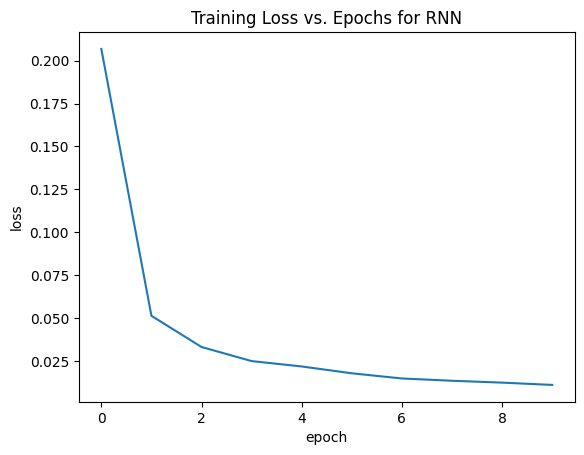

In [192]:
if device == 'cuda':
   # Configure TensorFlow to use the GPU if available
   tf.config.set_visible_devices(tf.config.list_physical_devices('GPU'), 'GPU')
   # Model training will automatically use the GPU if configured and available
   print("GPU is available and configured for TensorFlow.")
else:
   print("GPU is not available. Training will use CPU.")

rnn_model.compile(optimizer="adam",loss=loss)
rnn_epochs = rnn_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(rnn_epochs, "RNN")

In [193]:
# Verify the device the model is placed on
# This method is not suitable for checking the device of a SimpleRNN layer in this context.
# TensorFlow automatically handles device placement when a GPU is configured.
# print(rnn_model.get_layer(index=0)._get_trainable_state_variable_device())

### Evaluate Vanilla RNN Model using MAE, RMSE, and R2.

In [194]:
print("RNN Predictions for Training Set")
rnn_predictions_train = rnn_model.predict(X_train)
print("RNN Predictions for Testing Set")
rnn_predictions_test = rnn_model.predict(X_test)
rnn_mae = mean_absolute_error(y_test,rnn_predictions_test)
print("MAE of RNN model = ",rnn_mae)
rnn_rmse =  mean_squared_error(y_test,rnn_predictions_test) ** 0.5
print("RMSE of RNN model = ",rnn_rmse)
rnn_r2_score = r2_score(y_test,rnn_predictions_test)
print("R2 Score of RNN model = ",rnn_r2_score)
rnn_mape_score = 100*mean_absolute_percentage_error(y_test,rnn_predictions_test)
print("MAPE Score of RNN model = {0} %".format(rnn_mape_score))
rnn_smape_score = 100* symmetric_mean_absolute_percentage_error(y_test,rnn_predictions_test)
print("sMAPE Score of RNN model = {0} %".format(rnn_smape_score))

RNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
RNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
MAE of RNN model =  0.04470673744725305
RMSE of RNN model =  0.05513650986546748
R2 Score of RNN model =  0.9703589219815444
MAPE Score of RNN model = 34.06125641115172 %
sMAPE Score of RNN model = 7795.627157504881 %


In [195]:
perform_statistical_tests(y_test, rnn_predictions_test, "RNN")


--- Statistical Tests for RNN ---
Paired t-test: t-statistic = -1.3146, p-value = 0.1888
(Result is not statistically significant: no significant difference found)
Wilcoxon Signed-Rank Test: statistic =             706429.0000, p-value = 0.0169
(Result is statistically significant: there is a significant difference between actual and predicted values)


### Calculate 95% Confidence Intervals for RNN MAE and RMSE

In [196]:
rnn_mae_ci_lower, rnn_mae_ci_upper = calculate_bootstrap_ci(y_test, rnn_predictions_test.flatten(), mean_absolute_error)
print(f"RNN MAE 95% CI: [{rnn_mae_ci_lower:.4f}, {rnn_mae_ci_upper:.4f}]")

rnn_rmse_ci_lower, rnn_rmse_ci_upper = calculate_bootstrap_ci(y_test, rnn_predictions_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"RNN RMSE 95% CI: [{rnn_rmse_ci_lower:.4f}, {rnn_rmse_ci_upper:.4f}]")

RNN MAE 95% CI: [0.0431, 0.0463]
RNN RMSE 95% CI: [0.0534, 0.0569]


### Reverse Transform Scaler to Convert to Real Values.

In [197]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
rnn_predictions_inv_train = scaler.inverse_transform(rnn_predictions_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
rnn_predictions_inv_test = scaler.inverse_transform(rnn_predictions_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
rnn_predictions_inv_train = rnn_predictions_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
rnn_predictions_inv_test = rnn_predictions_inv_test.flatten()

### Show Actual and Predicted y values as Dataframes.

#### With Training Dates.

In [198]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_RNN_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': rnn_predictions_inv_train})
results_RNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,56.245052
1,2023-03-06 01:00:00,54.239836,54.126617
2,2023-03-06 02:00:00,51.970794,52.580273
3,2023-03-06 03:00:00,49.701251,50.967041
4,2023-03-06 04:00:00,48.048558,48.535187
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,58.178364
7032,2023-12-24 01:00:00,56.957176,56.724449
7033,2023-12-24 02:00:00,54.922600,55.817795
7034,2023-12-24 03:00:00,52.233917,54.078819


#### With Testing Dates.

In [199]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_RNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': rnn_predictions_inv_test})
results_RNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,49.692619
1,2023-12-25 02:00:00,47.495000,49.071983
2,2023-12-25 03:00:00,46.850460,48.519379
3,2023-12-25 04:00:00,47.579286,48.705906
4,2023-12-25 05:00:00,49.760594,50.300591
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,64.988403
1735,2024-03-06 08:00:00,65.973345,67.163765
1736,2024-03-06 09:00:00,64.305188,65.252510
1737,2024-03-06 10:00:00,63.536353,62.897873


### Plotting Predictions for Q/VMT/VHT made by RNN Model.

#### Only Testing Data.

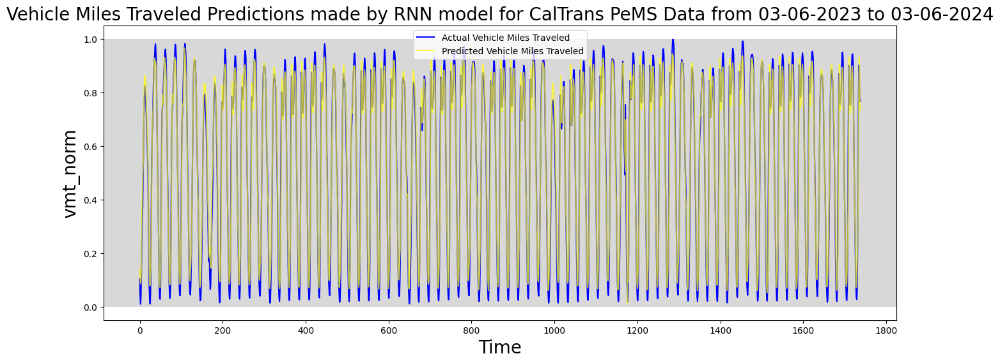

In [200]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(rnn_predictions_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by RNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data combined.

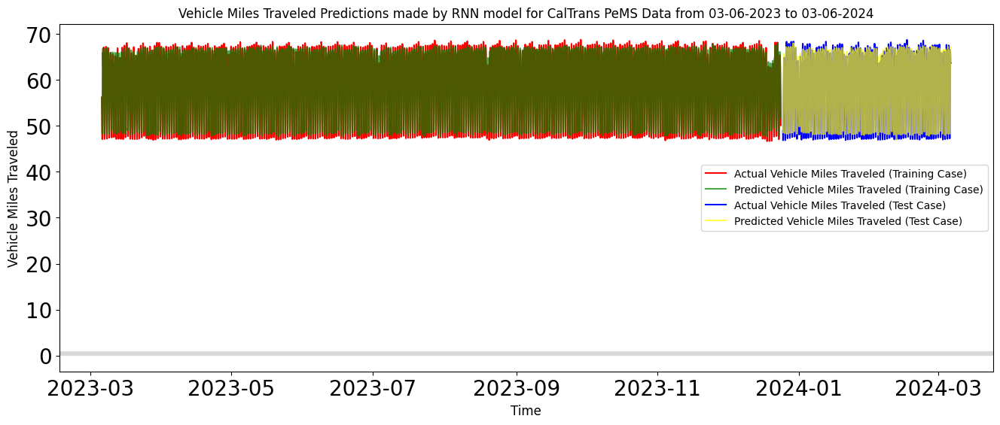

In [201]:
plt.figure(figsize=(16,6))
plt.plot(results_RNN_train['Date'], results_RNN_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_RNN_train['Date'],  results_RNN_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_RNN_test['Date'], results_RNN_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_RNN_test['Date'], results_RNN_test['Predicted'], alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by RNN model for {1}".
          format(feature, title_name))
plt.xlabel('Time', fontsize = 12)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for RNN.

In [202]:
results_RNN = [results_RNN_train, results_RNN_test]
results_RNN = pd.concat(results_RNN)
display(results_RNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,56.245052
1,2023-03-06 01:00:00,54.239836,54.126617
2,2023-03-06 02:00:00,51.970794,52.580273
3,2023-03-06 03:00:00,49.701251,50.967041
4,2023-03-06 04:00:00,48.048558,48.535187
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,64.988403
1735,2024-03-06 08:00:00,65.973345,67.163765
1736,2024-03-06 09:00:00,64.305188,65.252510
1737,2024-03-06 10:00:00,63.536353,62.897873


### Plotting Residuals for Actual and Predicted Results for RNN.

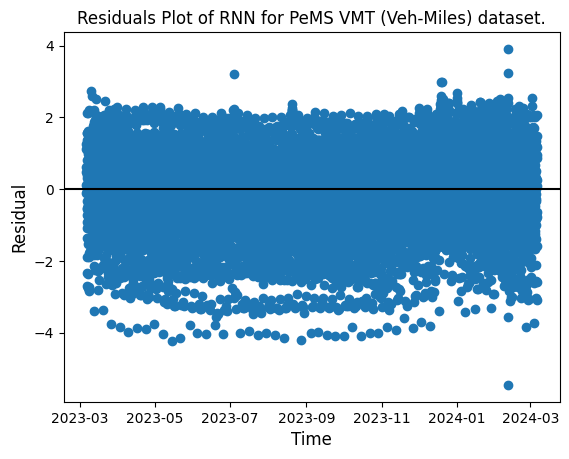

In [203]:
actual_arr_RNN = np.array(results_RNN['Actual'])
predicted_arr_RNN = np.array(results_RNN['Predicted'])
residuals_RNN = predicted_arr_RNN - actual_arr_RNN
plt.scatter(results_RNN['Date'], residuals_RNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plot of RNN for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

In [204]:
rnn_energy_results = measure_ann_energy(rnn_model, X_test,
                                        model_name_str='RNN Model')

Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2351 seconds
  Estimated CPU Energy: 18.8111 Joules (18811054.2297 µJ)

No GPU available. GPU measurements skipped.


From the residual plots for the RNN model, it can be concluded that the RNN model is a good fit.

## LSTM model

### Create LSTM Model.

In [205]:
lstm_model = Sequential()

#lstm_model.add(LSTM(unit,activation=activation,return_sequences=True,
#                    input_shape=(X_train.shape[1],1)))
#lstm_model.add(Dropout(0.5))

lstm_model.add(LSTM(unit,activation=activation,return_sequences=True,
                    input_shape=(100,1)))
lstm_model.add(Dropout(0.5))

#lstm_model.add(LSTM(unit,activation="sigmoid",return_sequences=True))
#lstm_model.add(Dropout(0.5))

lstm_model.add(LSTM(unit,activation=activation,return_sequences=False))
lstm_model.add(Dropout(0.5))

lstm_model.add(Dense(1))

lstm_model.summary()

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_2 (LSTM)                   │ (None, 100, 32)        │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 100, 32)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_3 (LSTM)                   │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,705 (49.63 KB)

 Trainable params: 12,705 (49.63 KB)

 Non-trainable params: 0 (0.00 B)

### Train LSTM Model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 0.0901
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0314
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0279
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0228
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0197
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0177
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 0.0151
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 0.0136
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0118
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0106


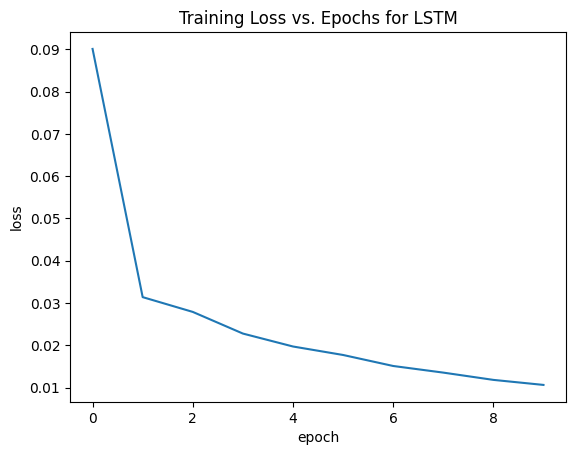

In [206]:
lstm_model.compile(optimizer="adam",loss=loss)
lstm_epochs = lstm_model.fit(X_train, y_train, epochs=epochs,
                             batch_size=batch_size)
plot_training_loss(lstm_epochs, "LSTM")

### Evaluate LSTM model using MAE, RMSE, and R^2.

In [207]:
print("LSTM Predictions for Training Set")
lstm_pred_train = lstm_model.predict(X_train)
print("LSTM Predictions for Testing Set")
lstm_pred_test = lstm_model.predict(X_test)
lstm_mae = mean_absolute_error(y_test,lstm_pred_test)
print("MAE of LSTM model = ",lstm_mae)
lstm_rmse =  mean_squared_error(y_test,lstm_pred_test) ** 0.5
print("RMSE of LSTM model = ",lstm_rmse)
lstm_r2_score = r2_score(y_test, lstm_pred_test)
print("R^2 Score of LSTM model = ",lstm_r2_score)
lstm_mape_score = mean_absolute_percentage_error(y_test,lstm_pred_test)
print("MAPE Score of LSTM model = {0} %".format(lstm_mape_score))
lstm_smape_score = 100* symmetric_mean_absolute_percentage_error(y_test,
                                                                 lstm_pred_test)
print("sMAPE Score of LSTM model = {0} %".format(lstm_smape_score))

LSTM Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
LSTM Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
MAE of LSTM model =  0.062412406421511746
RMSE of LSTM model =  0.07810351774821359
R^2 Score of LSTM model =  0.9405219611436583
MAPE Score of LSTM model = 0.37387003287734716 %
sMAPE Score of LSTM model = 7734.217789382395 %


In [208]:
perform_statistical_tests(y_test, lstm_pred_test, "LSTM")


--- Statistical Tests for LSTM ---
Paired t-test: t-statistic = -10.1567, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             569291.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


### Calculate 95% Confidence Intervals for LSTM MAE and RMSE

In [209]:
lstm_mae_ci_lower, lstm_mae_ci_upper = calculate_bootstrap_ci(y_test, lstm_pred_test.flatten(), mean_absolute_error)
print(f"LSTM MAE 95% CI: [{lstm_mae_ci_lower:.4f}, {lstm_mae_ci_upper:.4f}]")

lstm_rmse_ci_lower, lstm_rmse_ci_upper = calculate_bootstrap_ci(y_test, lstm_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"LSTM RMSE 95% CI: [{lstm_rmse_ci_lower:.4f}, {lstm_rmse_ci_upper:.4f}]")

LSTM MAE 95% CI: [0.0600, 0.0648]
LSTM RMSE 95% CI: [0.0757, 0.0806]


### Reverse Transform Scaler to Convert to Real Values.

In [210]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
lstm_predictions_inv_train = scaler.inverse_transform(lstm_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
lstm_predictions_inv_test = scaler.inverse_transform(lstm_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
lstm_predictions_inv_train = lstm_predictions_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
lstm_predictions_inv_test = lstm_predictions_inv_test.flatten()

### Show Actual and Predicted y values as Dataframes.

#### With Training Dates.

In [211]:
results_LSTM_train = pd.DataFrame({"Date":first_6169_index_dates,
                                   'Actual': y_train_inverse,
                                   'Predicted': lstm_predictions_inv_train})
results_LSTM_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,58.242558
1,2023-03-06 01:00:00,54.239836,54.762199
2,2023-03-06 02:00:00,51.970794,51.598392
3,2023-03-06 03:00:00,49.701251,49.111309
4,2023-03-06 04:00:00,48.048558,47.566692
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,61.524342
7032,2023-12-24 01:00:00,56.957176,58.285053
7033,2023-12-24 02:00:00,54.922600,54.944378
7034,2023-12-24 03:00:00,52.233917,52.279377


#### With Testing Dates.


In [212]:
results_LSTM_test = pd.DataFrame({"Date":last_6169_index_dates,
                             'Actual': y_test_inverse,
                             'Predicted': lstm_predictions_inv_test})
results_LSTM_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,50.156643
1,2023-12-25 02:00:00,47.495000,50.204063
2,2023-12-25 03:00:00,46.850460,50.484894
3,2023-12-25 04:00:00,47.579286,51.096134
4,2023-12-25 05:00:00,49.760594,52.440651
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,63.435394
1735,2024-03-06 08:00:00,65.973345,65.049171
1736,2024-03-06 09:00:00,64.305188,65.498360
1737,2024-03-06 10:00:00,63.536353,65.351006


### Plotting Predictions for PeMS Dataset Output made by LSTM Model.

#### Only Test Data.


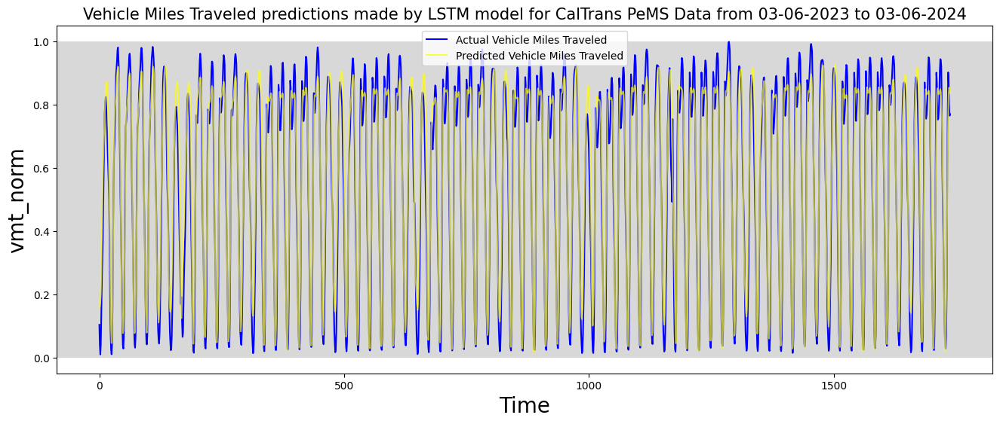

In [213]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(lstm_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} predictions made by LSTM model for {1}".
          format(feature, title_name), fontsize = 15)
plt.locator_params(axis='x', nbins=5)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.rc('xtick', labelsize=15)
plt.rc('ytick', labelsize=15)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data combined.

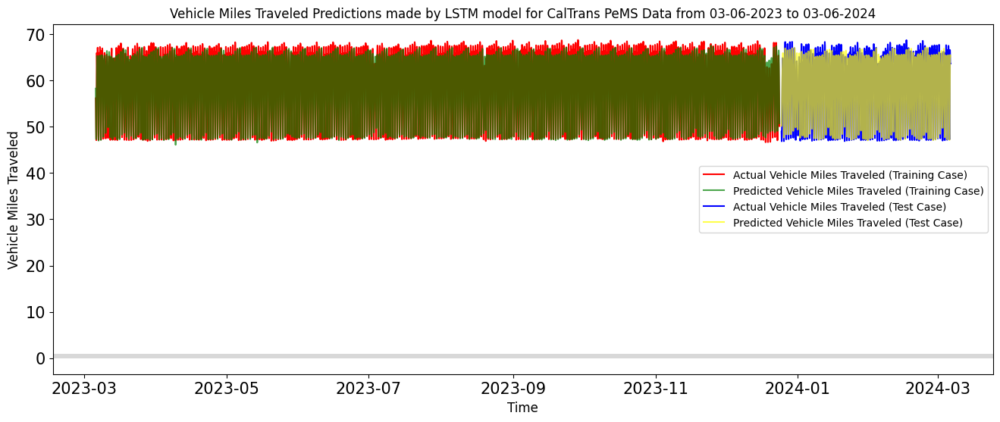

In [214]:
plt.figure(figsize=(16,6))
plt.plot(results_LSTM_train['Date'], results_LSTM_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_LSTM_train['Date'],  results_LSTM_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_LSTM_test['Date'], results_LSTM_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_LSTM_test['Date'], results_LSTM_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for LSTM.

In [215]:
results_LSTM = [results_LSTM_train, results_LSTM_test]
results_LSTM = pd.concat(results_LSTM)
display(results_LSTM)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,58.242558
1,2023-03-06 01:00:00,54.239836,54.762199
2,2023-03-06 02:00:00,51.970794,51.598392
3,2023-03-06 03:00:00,49.701251,49.111309
4,2023-03-06 04:00:00,48.048558,47.566692
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,63.435394
1735,2024-03-06 08:00:00,65.973345,65.049171
1736,2024-03-06 09:00:00,64.305188,65.498360
1737,2024-03-06 10:00:00,63.536353,65.351006


### Plotting Residuals for Actual and Predicted Results for LSTM.

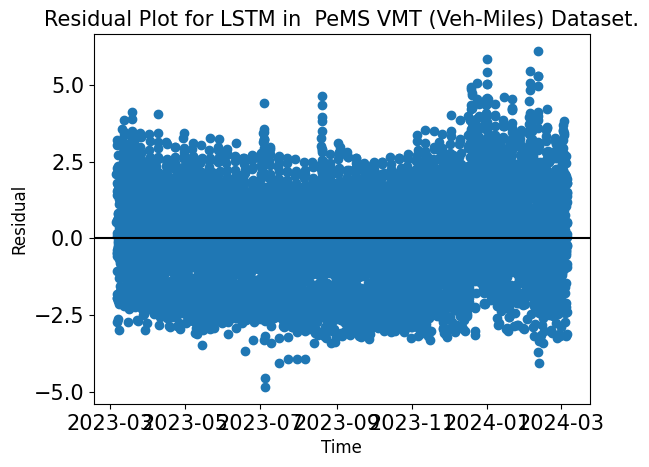

In [216]:
actual_arr_LSTM = np.array(results_LSTM['Actual'])
predicted_arr_LSTM = np.array(results_LSTM['Predicted'])
residuals_LSTM = predicted_arr_LSTM - actual_arr_LSTM
plt.scatter(results_LSTM['Date'], residuals_LSTM)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plot for LSTM in  PeMS {} Dataset.".format(feature_field),
          fontsize = 15)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=5)
plt.locator_params(axis='y', nbins=5)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

From the residual plots for the LSTM model, it can be concluded that the LSTM model is a good fit.

### Energy Consumption

In [217]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()
execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
lstm_energy_results = measure_ann_energy(lstm_model, X_test, 'LSTM Model')

Model execution time: 5.8650970458984375e-05 seconds
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.5010 seconds
  Estimated CPU Energy: 40.0812 Joules (40081233.9783 µJ)

No GPU available. GPU measurements skipped.


## GRU Model

### Create GRU Model.

In [218]:
gru_model = Sequential()

gru_model.add(GRU(unit,activation=activation,return_sequences=True,
                  input_shape=(X_train.shape[1],1)))
gru_model.add(Dropout(0.5))

#gru_model.add(GRU(32,activation="sigmoid",return_sequences=True))
#gru_model.add(Dropout(0.5))

gru_model.add(GRU(unit,activation=activation,return_sequences=False))
gru_model.add(Dropout(0.5))

gru_model.add(Dense(1))

gru_model.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru_2 (GRU)                     │ (None, 20, 32)         │         3,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 20, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_3 (GRU)                     │ (None, 32)             │         6,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,729 (38.00 KB)

 Trainable params: 9,729 (38.00 KB)

 Non-trainable params: 0 (0.00 B)

### Train GRU Model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0708
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 0.0272
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 9s 21ms/step - loss: 0.0208
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 7s 28ms/step - loss: 0.0162
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0139
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0117
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.0101
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0091
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 0.0080
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 0.0074


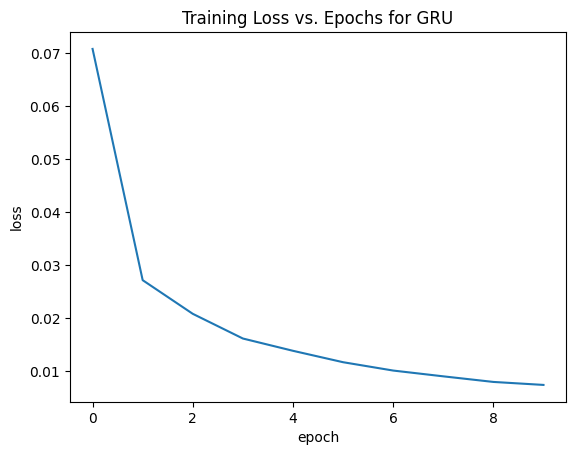

In [219]:
gru_model.compile(optimizer="adam",loss=loss)
gru_epochs = gru_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(gru_epochs, "GRU")

### Evaluate GRU model using MAE, RMSE, and R^2.

In [220]:
print("GRU Predictions for Training Set")
gru_pred_train = gru_model.predict(X_train)
print("GRU Predictions for Testing Set")
gru_pred_test = gru_model.predict(X_test)
gru_mae = mean_absolute_error(y_test,gru_pred_test)
print("MAE of GRU model = ",gru_mae)
gru_rmse =  mean_squared_error(y_test,gru_pred_test) ** 0.5
print("RMSE of GRU model = ",gru_rmse)
gru_r2_score = r2_score(y_test, gru_pred_test)
print("R^2 Score of GRU model = ",gru_r2_score)
gru_mape_score = 100*mean_absolute_percentage_error(y_test, gru_pred_test)
print("MAPE Score of GRU model = {0} %".format(gru_mape_score))
gru_smape_score = 100* symmetric_mean_absolute_percentage_error(y_test,
                                                                gru_pred_test)
print("sMAPE Score of GRU model = {0} %".format(gru_smape_score))

GRU Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
GRU Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
MAE of GRU model =  0.04061446400910786
RMSE of GRU model =  0.04947781666440964
R^2 Score of GRU model =  0.9761308746705574
MAPE Score of GRU model = 28.89207109178203 %
sMAPE Score of GRU model = 7811.318668342274 %


In [221]:
perform_statistical_tests(y_test, gru_pred_test, "GRU")


--- Statistical Tests for GRU ---
Paired t-test: t-statistic = -23.9565, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             307032.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


### Calculate 95% Confidence Intervals for GRU MAE and RMSE

In [222]:
gru_mae_ci_lower, gru_mae_ci_upper = calculate_bootstrap_ci(y_test, gru_pred_test.flatten(), mean_absolute_error)
print(f"GRU MAE 95% CI: [{gru_mae_ci_lower:.4f}, {gru_mae_ci_upper:.4f}]")

gru_rmse_ci_lower, gru_rmse_ci_upper = calculate_bootstrap_ci(y_test, gru_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"GRU RMSE 95% CI: [{gru_rmse_ci_lower:.4f}, {gru_rmse_ci_upper:.4f}]")

GRU MAE 95% CI: [0.0393, 0.0420]
GRU RMSE 95% CI: [0.0478, 0.0511]


### Reverse transform scaler to convert to real values.

In [223]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
gru_pred_inv_train = scaler.inverse_transform(gru_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
gru_pred_inv_test = scaler.inverse_transform(gru_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
gru_pred_inv_train = gru_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
gru_pred_inv_test = gru_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.

#### With Training Dates.

In [224]:
results_GRU_train = pd.DataFrame({"Date":first_6169_index_dates,
                            'Actual': y_train_inverse,
                            'Predicted': gru_pred_inv_train})
results_GRU_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,57.096638
1,2023-03-06 01:00:00,54.239836,54.593151
2,2023-03-06 02:00:00,51.970794,52.875580
3,2023-03-06 03:00:00,49.701251,50.774754
4,2023-03-06 04:00:00,48.048558,48.822037
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,58.839382
7032,2023-12-24 01:00:00,56.957176,57.724728
7033,2023-12-24 02:00:00,54.922600,56.571777
7034,2023-12-24 03:00:00,52.233917,54.252548


#### With Testing Dates.

In [225]:
results_GRU_test = pd.DataFrame({"Date":last_6169_index_dates,
                            'Actual': y_test_inverse,
                            'Predicted': gru_pred_inv_test})
results_GRU_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,49.558533
1,2023-12-25 02:00:00,47.495000,49.253109
2,2023-12-25 03:00:00,46.850460,49.085747
3,2023-12-25 04:00:00,47.579286,49.430656
4,2023-12-25 05:00:00,49.760594,51.130329
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.984863
1735,2024-03-06 08:00:00,65.973345,66.852356
1736,2024-03-06 09:00:00,64.305188,64.992874
1737,2024-03-06 10:00:00,63.536353,63.869068


### Plotting Predictions for Q/VMT/VHT made by GRU Model.

#### Testing Data Only.

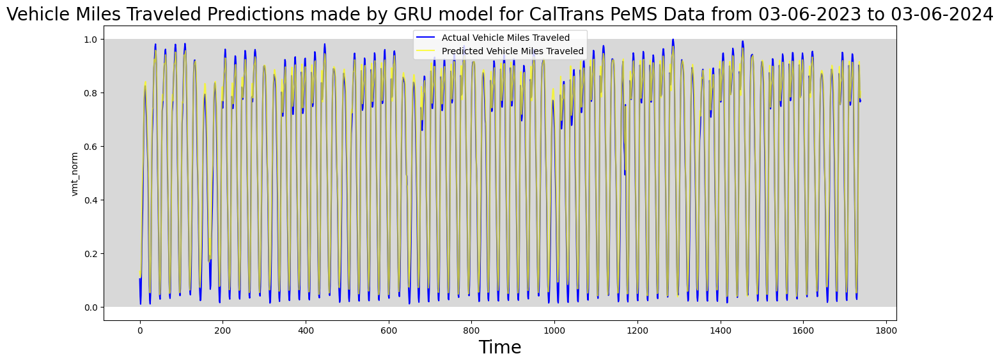

In [226]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(gru_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 10)
plt.legend()
plt.show()

#### Training and Test Data Combined.

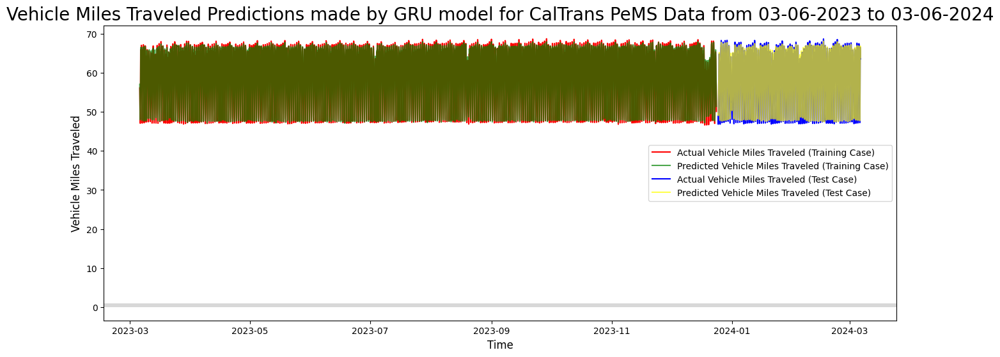

In [227]:
plt.figure(figsize=(16,6))
plt.plot(results_GRU_train['Date'], results_GRU_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_GRU_train['Date'],  results_GRU_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_GRU_test['Date'], results_GRU_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_GRU_test['Date'], results_GRU_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for GRU.

In [228]:
results_GRU = [results_GRU_train, results_GRU_test]
results_GRU = pd.concat(results_GRU)
display(results_GRU)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,57.096638
1,2023-03-06 01:00:00,54.239836,54.593151
2,2023-03-06 02:00:00,51.970794,52.875580
3,2023-03-06 03:00:00,49.701251,50.774754
4,2023-03-06 04:00:00,48.048558,48.822037
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.984863
1735,2024-03-06 08:00:00,65.973345,66.852356
1736,2024-03-06 09:00:00,64.305188,64.992874
1737,2024-03-06 10:00:00,63.536353,63.869068


### Plotting Residuals for Actual and Predicted Results for GRU.

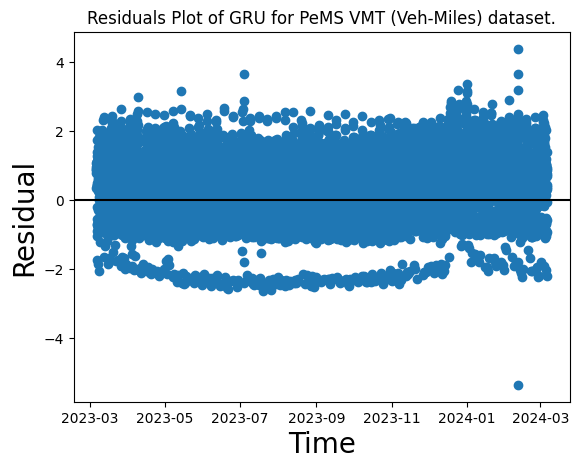

In [229]:
# Plotting Residuals for Actual and Predicted Results for GRU.
actual_arr_GRU = np.array(results_GRU['Actual'])
predicted_arr_GRU = np.array(results_GRU['Predicted'])
residuals_GRU = predicted_arr_GRU - actual_arr_GRU
plt.scatter(results_GRU['Date'], residuals_GRU)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plot of GRU for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

From the residual plots for the GRU model, it can be concluded that the GRU model is a good fit.

### Energy Consumption

In [230]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()
execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
gru_energy_results = measure_ann_energy(gru_model, X_test, "GRU_Model")

Model execution time: 5.698204040527344e-05 seconds
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.3386 seconds
  Estimated CPU Energy: 27.0874 Joules (27087364.1968 µJ)

No GPU available. GPU measurements skipped.


## CNN (Conv1D) model

### Create CNN Model.

In [231]:
cnn_model = Sequential()

cnn_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                     input_shape=(seq_len, X_train.shape[2])))
cnn_model.add(MaxPooling1D(pool_size=2))

cnn_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                     input_shape=(seq_len, X_train.shape[2])))
cnn_model.add(MaxPooling1D(pool_size=2))

cnn_model.add(Flatten())
cnn_model.add(Dense(50, activation=activation))
cnn_model.add(Dense(1))
cnn_model.summary()

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_2 (Conv1D)               │ (None, 18, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_2 (MaxPooling1D)  │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_3 (Conv1D)               │ (None, 7, 32)          │         3,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 96)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 50)             │         4,850 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 1)              │            51 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,133 (31.77 KB)

 Trainable params: 8,133 (31.77 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.0479
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0094
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0079
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0072
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0065
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0060
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0060
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0054
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0051
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0046


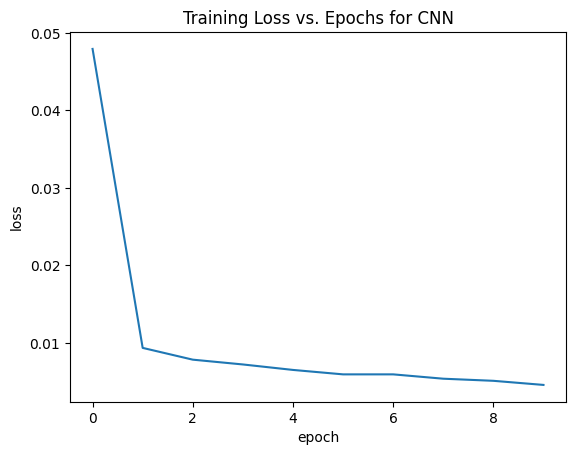

In [232]:
cnn_model.compile(optimizer='adam', loss='mse')
cnn_epochs = cnn_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(cnn_epochs, "CNN")

### Evaluate CNN model using MAE, RMSE, and R^2.

In [233]:
print("CNN Predictions for Training Set")
cnn_pred_train = cnn_model.predict(X_train)
print("CNN Predictions for Testing Set")
cnn_pred_test = cnn_model.predict(X_test)
cnn_mae = mean_absolute_error(y_test,cnn_pred_test)
print("MAE of CNN model = ",cnn_mae)
cnn_rmse =  mean_squared_error(y_test,cnn_pred_test) ** 0.5
print("RMSE of CNN model = ",cnn_rmse)
cnn_r2_score = r2_score(y_test, cnn_pred_test)
print("R^2 Score of CNN model = ",cnn_r2_score)
cnn_mape_score = 100*mean_absolute_percentage_error(y_test, cnn_pred_test)
print("MAPE Score of CNN model = {0} %".format(cnn_mape_score))
cnn_smape_score = 100* symmetric_mean_absolute_percentage_error(y_test,
                                                                cnn_pred_test)
print("sMAPE Score of CNN model = {0} %".format(cnn_smape_score))

CNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
CNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of CNN model =  0.07652181564894564
RMSE of CNN model =  0.09372099105029356
R^2 Score of CNN model =  0.9143575277649494
MAPE Score of CNN model = 51.09571675387645 %
sMAPE Score of CNN model = 7616.01853400452 %


In [234]:
perform_statistical_tests(y_test, cnn_pred_test, "CNN")


--- Statistical Tests for CNN ---
Paired t-test: t-statistic = -32.2165, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             194360.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


### Calculate 95% Confidence Intervals for CNN MAE and RMSE

In [235]:
cnn_mae_ci_lower, cnn_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_pred_test.flatten(), mean_absolute_error)
print(f"CNN MAE 95% CI: [{cnn_mae_ci_lower:.4f}, {cnn_mae_ci_upper:.4f}]")

cnn_rmse_ci_lower, cnn_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN RMSE 95% CI: [{cnn_rmse_ci_lower:.4f}, {cnn_rmse_ci_upper:.4f}]")

CNN MAE 95% CI: [0.0740, 0.0790]
CNN RMSE 95% CI: [0.0904, 0.0968]


### Reverse transform scaler to convert to real values.

In [236]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_pred_inv_train = scaler.inverse_transform(cnn_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_pred_inv_test = scaler.inverse_transform(cnn_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
cnn_pred_inv_train = cnn_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_pred_inv_test = cnn_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.

#### With Training Dates.

In [237]:
results_CNN_train = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_pred_inv_train})
results_CNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,59.945210
1,2023-03-06 01:00:00,54.239836,56.945679
2,2023-03-06 02:00:00,51.970794,54.026630
3,2023-03-06 03:00:00,49.701251,50.797878
4,2023-03-06 04:00:00,48.048558,49.257793
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,62.363049
7032,2023-12-24 01:00:00,56.957176,59.371494
7033,2023-12-24 02:00:00,54.922600,56.342255
7034,2023-12-24 03:00:00,52.233917,53.591274


#### With Testing Dates.

In [238]:
results_CNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_pred_inv_test})
results_CNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,51.643959
1,2023-12-25 02:00:00,47.495000,51.159050
2,2023-12-25 03:00:00,46.850460,50.793137
3,2023-12-25 04:00:00,47.579286,51.674141
4,2023-12-25 05:00:00,49.760594,53.486229
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.138077
1735,2024-03-06 08:00:00,65.973345,65.331360
1736,2024-03-06 09:00:00,64.305188,63.747551
1737,2024-03-06 10:00:00,63.536353,63.993534


### Plotting Predictions for Q/VHT/VMT made by CNN Model.

#### Only Testing Data.

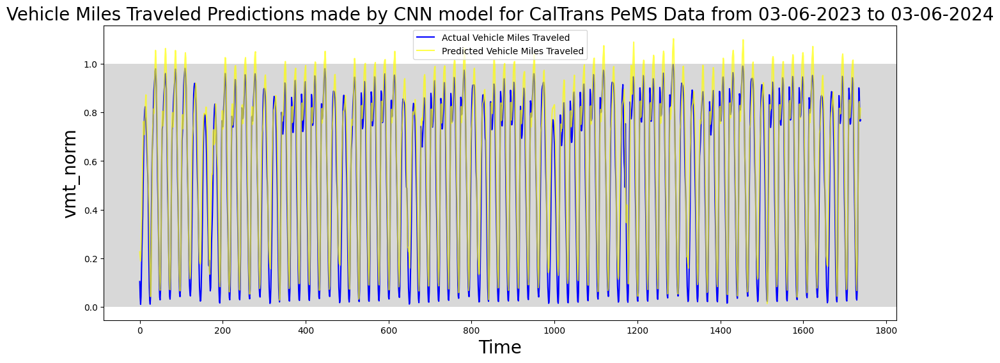

In [239]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Test Data Combined.

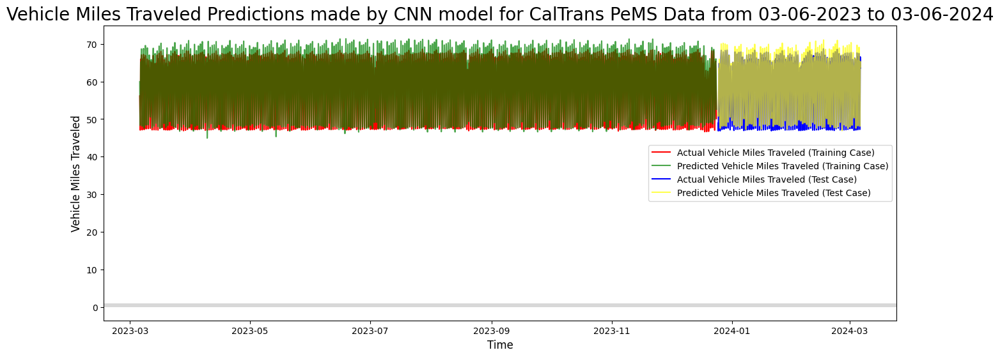

In [240]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_train['Date'], results_CNN_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_CNN_train['Date'],  results_CNN_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_CNN_test['Date'], results_CNN_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_CNN_test['Date'], results_CNN_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN.

In [241]:
results_CNN = [results_CNN_train, results_CNN_test]
results_CNN = pd.concat(results_CNN)
display(results_CNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,59.945210
1,2023-03-06 01:00:00,54.239836,56.945679
2,2023-03-06 02:00:00,51.970794,54.026630
3,2023-03-06 03:00:00,49.701251,50.797878
4,2023-03-06 04:00:00,48.048558,49.257793
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.138077
1735,2024-03-06 08:00:00,65.973345,65.331360
1736,2024-03-06 09:00:00,64.305188,63.747551
1737,2024-03-06 10:00:00,63.536353,63.993534


### Plotting Residuals for Actual and Predicted Results for CNN.

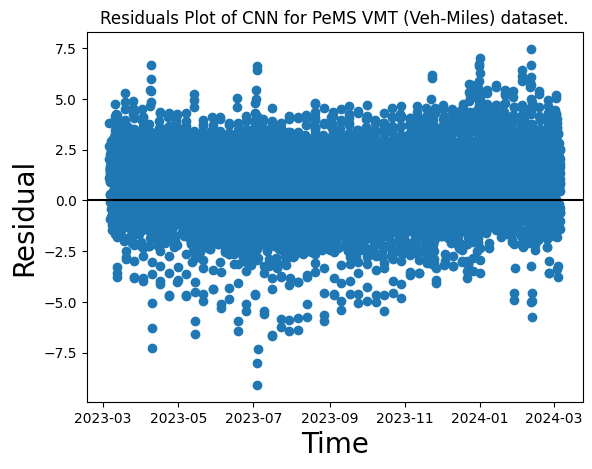

In [242]:
actual_arr_CNN = np.array(results_CNN['Actual'])
predicted_arr_CNN = np.array(results_CNN['Predicted'])
residuals_CNN = predicted_arr_CNN - actual_arr_CNN
plt.scatter(results_CNN['Date'], residuals_CNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plot of CNN for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

From the residual plots for the CNN model, it can be concluded that the CNN model is a good fit.

### Energy Consumption

In [243]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()
execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
cnn_model_energy_results = measure_ann_energy(cnn_model, X_test,
                                              model_name_str='CNN Model')

Model execution time: 7.343292236328125e-05 seconds
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.1668 seconds
  Estimated CPU Energy: 13.3478 Joules (13347759.2468 µJ)

No GPU available. GPU measurements skipped.


# Spiking Network Models

## Create SNN Model.

### Spiking Activation Layer

In [285]:
@keras.saving.register_keras_serializable()
class SpikingActivationCell(tf.keras.layers.Layer):
    def __init__(self, units, activation='tanh', threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        super(SpikingActivationCell, self).__init__(**kwargs)
        self.units = units # This is the number of features/neurons for this cell
        self.activation = activation
        self.threshold = threshold
        self.dt = dt
        self.spiking_aware_training = spiking_aware_training
        self.membrane_potential = None
        # state_size must be set in __init__ for tf.keras.layers.RNN
        self.state_size = self.units # Each neuron has one scalar membrane potential state

    def build(self, input_shape):
        # input_shape should be (batch_size, timesteps, self.units) -> cell receives (batch_size, self.units)
        if input_shape[-1] != self.units:
             raise ValueError(f"Input feature size ({input_shape[-1]}) does not match "
                              f"declared units ({self.units}) for SpikingActivationCell.")

        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(self.units,),  # Membrane potential for all neurons in this layer
            initializer='zeros',
            trainable=False
        )
        super(SpikingActivationCell, self).build(input_shape)

    def get_initial_state(self, inputs=None, batch_size=None, dtype=None):
        # Now self.units is available, so _num_features is always self.units
        _num_features = self.units
        if batch_size is None:
            # If batch_size is not provided, try to infer from inputs
            if inputs is not None:
                _batch_size = tf.shape(inputs)[0]
            else:
                raise ValueError("`batch_size` must be provided if `inputs` is None in `get_initial_state`.")
        else:
            _batch_size = batch_size

        # Use tf.float32 as default dtype if None is passed
        if dtype is None:
            dtype = tf.float32

        initial_membrane_potential = tf.zeros((_batch_size, _num_features), dtype=dtype)
        return [initial_membrane_potential]

    def call(self, inputs, states, training=None):
        # states is a list, and states[0] is the previous membrane potential
        prev_membrane_potential = states[0] # Shape: (batch_size, self.units)

        # Apply activation function
        activated_input = tf.keras.activations.get(self.activation)(inputs) # Shape: (batch_size, self.units)

        # Update membrane potential
        membrane_potential = prev_membrane_potential + activated_input * self.dt

        # Generate spikes based on threshold
        if training and self.spiking_aware_training:
            @tf.custom_gradient
            def surrogate_spike(x):
                spike = tf.where(x >= self.threshold, tf.ones_like(x), tf.zeros_like(x))
                def grad(dy):
                    # Simple Straight-Through Estimator
                    return dy
                return spike, grad
            spikes = surrogate_spike(membrane_potential)
        else:
            spikes = tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)

        # Reset membrane potential after spike
        membrane_potential = membrane_potential - spikes * self.threshold

        # Return the spikes as output and the updated membrane potential as the new state
        return spikes, [membrane_potential]

    def get_config(self):
        config = super().get_config()
        config.update({
            "units": self.units,
            "activation": self.activation,
            "threshold": self.threshold,
            "dt": self.dt,
            "spiking_aware_training": self.spiking_aware_training,
        })
        return config

@keras.saving.register_keras_serializable()
class SpikingActivationLayer(tf.keras.layers.RNN):
    def __init__(self, units, activation='tanh', threshold=1.0, dt=1.0,
                 spiking_aware_training=False, **kwargs):
        cell = SpikingActivationCell(units=units, activation=activation,
                                     threshold=threshold, dt=dt,
                                     spiking_aware_training=spiking_aware_training)
        super(SpikingActivationLayer, self).__init__(cell=cell, **kwargs)
        self.return_sequences = kwargs.get('return_sequences', False)
        self.units = units # Keep units attribute on the layer as well

    def call(self, inputs, initial_state=None, training=None, **kwargs):
        return super(SpikingActivationLayer, self).call(
            inputs, initial_state=initial_state, training=training, **kwargs
        )

    def compute_output_shape(self, input_shape):
        # input_shape will be (batch_size, timesteps, features_from_prev_layer)
        if self.return_sequences:
            # If return_sequences is True, the output shape includes the time dimension
            # The last dimension will be self.units
            return (input_shape[0], input_shape[1], self.units)
        else:
            # If return_sequences is False, the output shape is (batch_size, self.units)
            return (input_shape[0], self.units)

    def build(self, input_shape):
        super(SpikingActivationLayer, self).build(input_shape)

    def get_config(self):
        config = super().get_config()
        # Remove the 'cell' entry that the base RNN class's get_config adds,
        # as this layer directly constructs and passes its cell.
        config.pop('cell', None)
        config.update({
            "units": self.units,
            "activation": self.cell.activation,
            "threshold": self.cell.threshold,
            "dt": self.cell.dt,
            "spiking_aware_training": self.cell.spiking_aware_training,
            "return_sequences": self.return_sequences,
        })
        return config

In [286]:
@keras.saving.register_keras_serializable()
class SpikingActivationCell2(tf.keras.layers.Layer):
    def __init__(self, units, threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        super().__init__(**kwargs)
        self.units = units
        self.threshold = threshold
        self.dt = dt
        self.spiking_aware_training = spiking_aware_training
        self.state_size = units

    def get_initial_state(self, inputs=None, batch_size=None, dtype=None):
        return [tf.zeros((batch_size, self.units), dtype=dtype or tf.float32)]

    def call(self, inputs, states, training=None):
        prev_v = states[0]

        # Always use tanh for stability
        I = tf.math.tanh(inputs)

        # Membrane update
        v = prev_v + self.dt * I

        # Surrogate gradient spike
        if training and self.spiking_aware_training:
            @tf.custom_gradient
            def spike_fn(x):
                spike = tf.where(x >= self.threshold, 1.0, 0.0)
                def grad(dy):
                    # finite window surrogate
                    return dy * tf.where(tf.abs(x - self.threshold) < 0.5, 1.0, 0.0)
                return spike, grad
            spikes = spike_fn(v)
        else:
            spikes = tf.cast(v >= self.threshold, tf.float32)

        # Reset
        v = tf.where(spikes > 0, v - self.threshold, v)

        return spikes, [v]

@keras.saving.register_keras_serializable()
class SpikingActivationLayer2(tf.keras.layers.RNN):
    def __init__(self, units, activation='tanh', threshold=1.0, dt=1.0,
                 spiking_aware_training=False, **kwargs):
        cell = SpikingActivationCell2(units=units, threshold=threshold, dt=dt,
                                     spiking_aware_training=spiking_aware_training)
        super(SpikingActivationLayer2, self).__init__(cell, **kwargs)
        self.return_sequences = kwargs.get('return_sequences', False)
        self.units = units # Keep units attribute on the layer as well

    def call(self, inputs, initial_state=None, training=None, **kwargs):
        return super(SpikingActivationLayer2, self).call(
            inputs, initial_state=initial_state, training=training, **kwargs
        )

    def compute_output_shape(self, input_shape):
        # input_shape will be (batch_size, timesteps, features_from_prev_layer)
        if self.return_sequences:
            # If return_sequences is True, the output shape includes the time dimension
            # The last dimension will be self.units
            return (input_shape[0], input_shape[1], self.units)
        else:
            # If return_sequences is False, the output shape is (batch_size, self.units)
            return (input_shape[0], self.units)

    def build(self, input_shape):
        super(SpikingActivationLayer2, self).build(input_shape)

### Spiking Model

In [287]:
spiking_model = tf.keras.Sequential(
    [
        # Add temporal dimension to model. For this dataset, the input_shape is
        # passed into the model.
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        # Keras' TimeDistributed wrapper allows Dense layer to operate on
        # temporal data.
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128)),
        # SpikingActivation: Function replaces any activation function with it's
        # Spiking equivalent. In addition to activation functions, the timestep
        # (dt) can be changed to run the spiking neurons for longer periods of
        # time. spiking_aware_training is set to True as it helps in the
        # regularization.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        # SpikingActivation: Function replaces any activation function with it's
        # Spiking equivalent. In addition to activation functions, the timestep
        # (dt) can be changed to run the spiking neurons for longer periods of
        # time. spiking_aware_training is set to True as it helps in the
        # regularization.
        # Instead of using the keras_spiking.SpikingActivation, we directly
        # apply the activation function using tf.keras.activations.tanh.
        # This change avoids the internal use of tf.keras.layers.RNN
        # within the SpikingActivation layer, which was causing the issue.
        SpikingActivationLayer(units=128, activation='tanh', threshold=0.7, dt=100,
                               return_sequences=True,
                               spiking_aware_training=True),
        #SpikingActivationLayer2(units=128, activation='tanh', threshold=0.7, dt=100,
        #                       return_sequences=True,
        #                       spiking_aware_training=True),
        # GlobalAveragePooling1D: Averages spiking output over time. Used for
        # determining the spiking rate of neuron.
        tf.keras.layers.GlobalAveragePooling1D(),
        tf.keras.layers.Dense(1),
    ]
)

spiking_model.summary()

Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_4 (Reshape)             │ (None, None, 20)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_4              │ (None, None, 128)      │         2,688 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spiking_activation_layer_4      │ (None, None, 128)      │           128 │
│ (SpikingActivationLayer)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_4      │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,817 (11.00 KB)

 Non-trainable params: 128 (512.00 B)

## Train Spiking Network Model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.0713
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0249
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0181
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0133
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0103
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0081
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0072
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0066
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0054
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0043


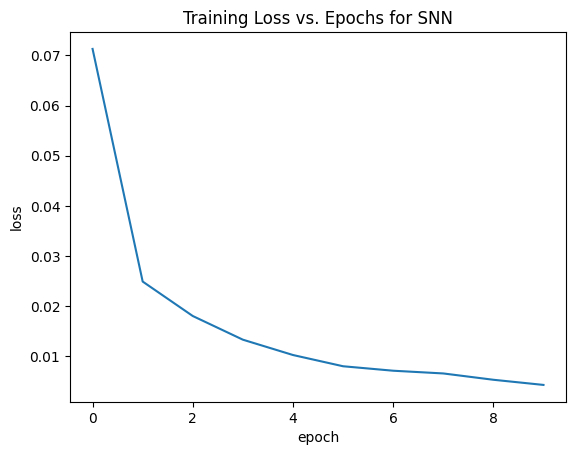

In [288]:
spiking_model.compile(optimizer="adam",loss=loss)
spiking_model_epochs = spiking_model.fit(X_train, y_train, epochs=epochs,
                           batch_size=batch_size)
plot_training_loss(spiking_model_epochs, "SNN")

In [289]:
print("Rate-Based SNN Predictions for Training Set")
snn_pred_train = spiking_model.predict(X_train)
print("SNN Predictions for Testing Set")
snn_pred_test = spiking_model.predict(X_test)
snn_mae = mean_absolute_error(y_test, snn_pred_test)
print("MAE of SNN model = ",snn_mae)
snn_rmse =  mean_squared_error(y_test, snn_pred_test) ** 0.5
print("RMSE of SNN model = ",snn_rmse)
#rnn_r2_score = r2_score(y_test,rnn_predictions_test)
#print("R2 Score of RNN model = ",rnn_r2_score)
snn_mape_score = 100*mean_absolute_percentage_error(y_test, snn_pred_test)
print("MAPE Score of SNN model = {0} %".format(snn_mape_score))

Rate-Based SNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
SNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of SNN model =  0.05571419768894708
RMSE of SNN model =  0.07456791143944898
MAPE Score of SNN model = 28.59236758645791 %


In [290]:
print("Rate-Based SNN Predictions for Training Set")
snn_pred_train = spiking_model.predict(X_train)
print("SNN Predictions for Testing Set")
snn_pred_test = spiking_model.predict(X_test)
snn_mae = mean_absolute_error(y_test, snn_pred_test)
print("MAE of SNN model = ",snn_mae)
snn_rmse =  mean_squared_error(y_test, snn_pred_test) ** 0.5
print("RMSE of SNN model = ",snn_rmse)
#rnn_r2_score = r2_score(y_test,rnn_predictions_test)
#print("R2 Score of RNN model = ",rnn_r2_score)
snn_mape_score = 100*mean_absolute_percentage_error(y_test, snn_pred_test)
print("MAPE Score of SNN model = {0} %".format(snn_mape_score))

Rate-Based SNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step
SNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of SNN model =  0.05571419768894708
RMSE of SNN model =  0.07456791143944898
MAPE Score of SNN model = 28.59236758645791 %


In [291]:
perform_statistical_tests(y_test, snn_pred_test, "Rate-Based SNN")


--- Statistical Tests for Rate-Based SNN ---
Paired t-test: t-statistic = -10.1048, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             567591.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


## Reverse Transform Scaler to Convert to Real Values.

In [292]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
snn_pred_inv_train = scaler.inverse_transform(snn_pred_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
snn_pred_inv_test = scaler.inverse_transform(snn_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
snn_pred_inv_train = snn_pred_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
snn_pred_inv_test = snn_pred_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [293]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_SNN_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': snn_pred_inv_train})
results_SNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,58.166180
1,2023-03-06 01:00:00,54.239836,51.201374
2,2023-03-06 02:00:00,51.970794,52.146206
3,2023-03-06 03:00:00,49.701251,47.806004
4,2023-03-06 04:00:00,48.048558,48.286388
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,60.494301
7032,2023-12-24 01:00:00,56.957176,57.586159
7033,2023-12-24 02:00:00,54.922600,52.905903
7034,2023-12-24 03:00:00,52.233917,49.635014


### With Testing Dates.

In [294]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_SNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': snn_pred_inv_test})
results_SNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,46.811501
1,2023-12-25 02:00:00,47.495000,47.242561
2,2023-12-25 03:00:00,46.850460,47.726517
3,2023-12-25 04:00:00,47.579286,49.268623
4,2023-12-25 05:00:00,49.760594,49.530689
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,64.856232
1735,2024-03-06 08:00:00,65.973345,64.622238
1736,2024-03-06 09:00:00,64.305188,64.969719
1737,2024-03-06 10:00:00,63.536353,64.185524


## Plotting Predictions for PeMS Dataset Output made by SNN Model.

### Only Testing Data.

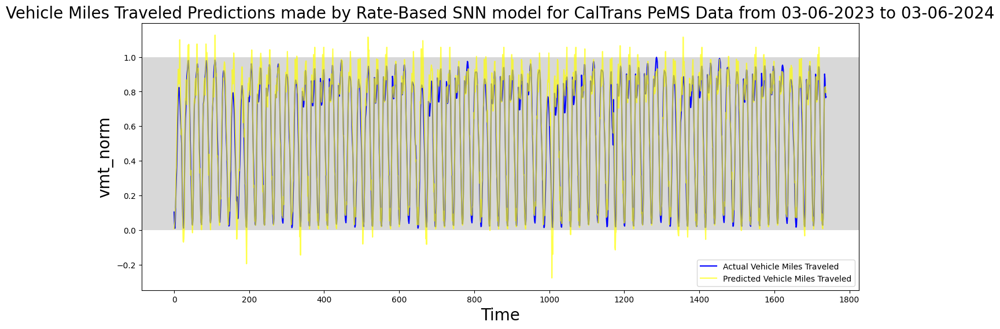

In [295]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(snn_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by Rate-Based SNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Training and Testing Data combined.

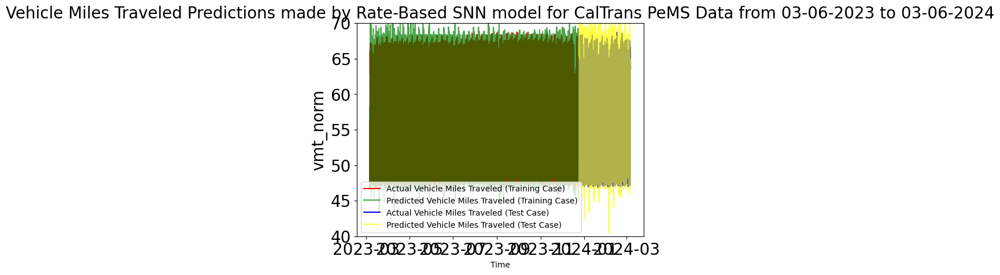

In [296]:
plt.plot(results_SNN_train['Date'], results_SNN_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_SNN_train['Date'],  results_SNN_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_SNN_test['Date'], results_SNN_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_SNN_test['Date'], results_SNN_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by Rate-Based SNN model for {1}".
          format(feature, title_name), fontsize = 20)
plt.xlabel('Time', fontsize = 10)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

## Combine Actual and Predicted Results for Train and Test Cases for SNN.

In [297]:
results_SNN = [results_SNN_train, results_SNN_test]
results_SNN = pd.concat(results_SNN)
display(results_SNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,58.166180
1,2023-03-06 01:00:00,54.239836,51.201374
2,2023-03-06 02:00:00,51.970794,52.146206
3,2023-03-06 03:00:00,49.701251,47.806004
4,2023-03-06 04:00:00,48.048558,48.286388
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,64.856232
1735,2024-03-06 08:00:00,65.973345,64.622238
1736,2024-03-06 09:00:00,64.305188,64.969719
1737,2024-03-06 10:00:00,63.536353,64.185524


## Plot Output Spikes

length of seq_model.layers:  5
layer type:  <class 'keras.src.layers.reshaping.reshape.Reshape'>
layer name:  reshape_4
layer type:  <class 'keras.src.layers.rnn.time_distributed.TimeDistributed'>
layer name:  time_distributed_4
layer type:  <class '__main__.SpikingActivationLayer'>
layer name:  spiking_activation_layer_4
layer type:  <class 'keras.src.layers.pooling.global_average_pooling1d.GlobalAveragePooling1D'>
layer name:  global_average_pooling1d_4
layer type:  <class 'keras.src.layers.core.dense.Dense'>
layer name:  dense_19
layer new name:  dense9
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step
spikes.shape:  (1739, 128, 10)
spikes_dict:  {'reshape_4': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'time_distributed_4': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'spiking_activation_layer_4': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'global_average_pooling1d_4': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'dense9': array([0., 0., 0., ..., 0., 0., 0.]

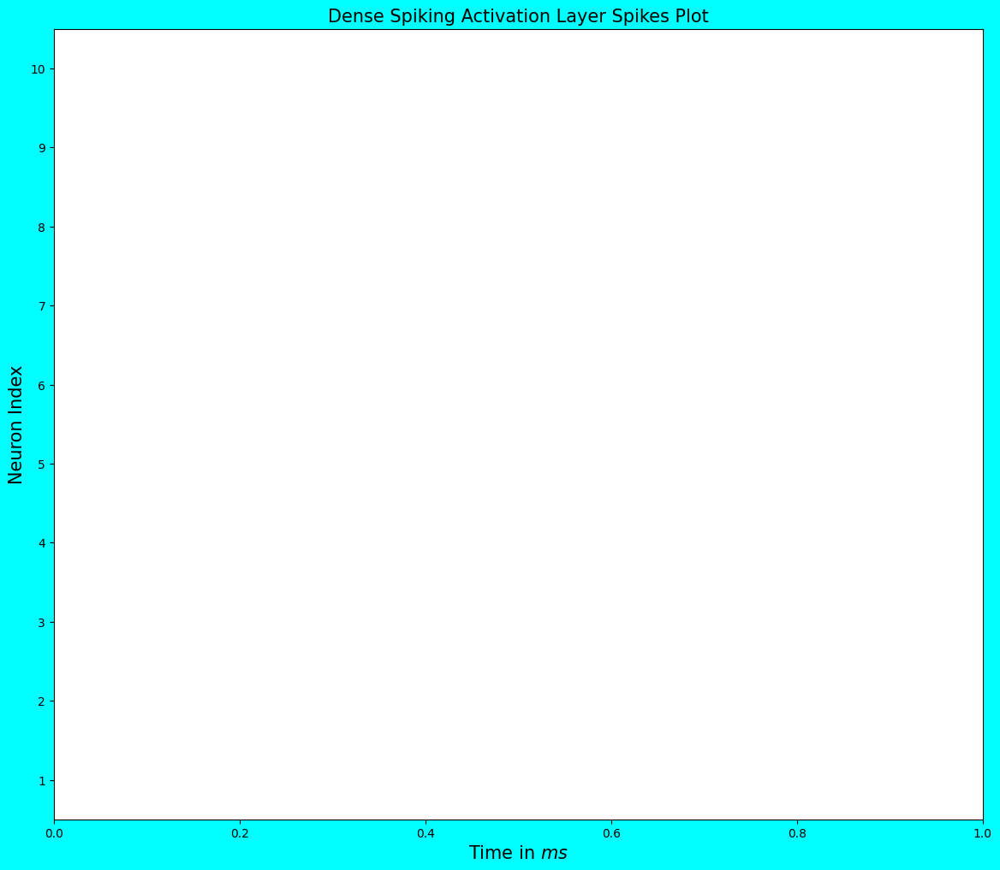

In [298]:
check_output(spiking_model, X_train, X_test, y_train, y_test)

length of seq_model.layers:  5
layer type:  <class 'keras.src.layers.reshaping.reshape.Reshape'>
layer name:  reshape_4
layer type:  <class 'keras.src.layers.rnn.time_distributed.TimeDistributed'>
layer name:  time_distributed_4
layer type:  <class '__main__.SpikingActivationLayer'>
layer name:  spiking_activation_layer_4
layer type:  <class 'keras.src.layers.pooling.global_average_pooling1d.GlobalAveragePooling1D'>
layer name:  global_average_pooling1d_4
layer type:  <class 'keras.src.layers.core.dense.Dense'>
layer name:  dense_19
layer new name:  dense9
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step
spikes.shape:  (1739, 128, 10)
spikes_dict:  {'reshape_4': array([0., 0., 0., ..., 0., 0., 0.], dtype=float32), 'time_distributed_4': array([1., 1., 1., ..., 1., 1., 1.], dtype=float32), 'spiking_activation_layer_4': array([1., 1., 1., ..., 0., 0., 0.], dtype=float32), 'global_average_pooling1d_4': array([1., 1., 1., ..., 1., 1., 1.], dtype=float32), 'dense9': array([0., 0., 0., ..., 1., 1., 1.]

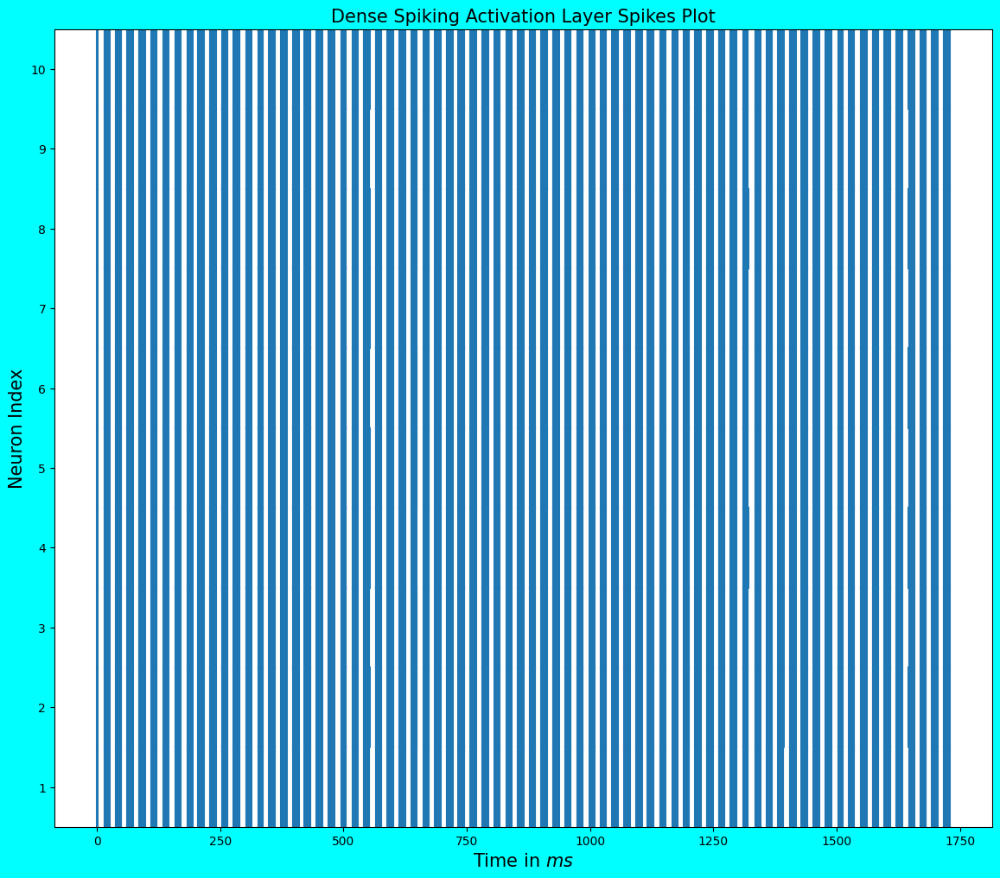

In [299]:
check_output(spiking_model, X_train, X_test, y_train, y_test, modify_dt = 100)

## Plotting Residuals for Actual and Predicted Results for SNN.

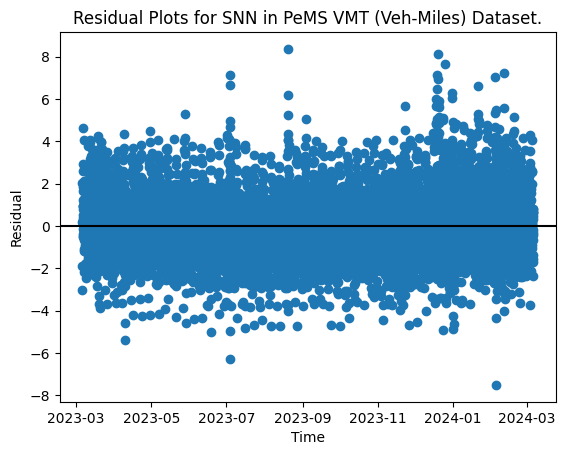

In [300]:
actual_arr_SNN = np.array(results_SNN['Actual'])
predicted_arr_SNN = np.array(results_SNN['Predicted'])
residuals_SNN = predicted_arr_SNN - actual_arr_SNN
plt.scatter(results_SNN['Date'], residuals_SNN)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plots for SNN in PeMS {} Dataset.".format(feature_field))
plt.xlabel("Time")
plt.ylabel("Residual")
plt.show()

From the residual plots for the RNN model, it can be concluded that the RNN model is a good fit.

## Energy Consumption

In [301]:
snn_energy_results = measure_snn_energy(spiking_model, X_test, model_name_str='Rate-Based SNN Model')

Measuring inference time and estimating energy on CPU (for SNN)...
  CPU Inference Time: 0.1756 seconds
  Estimated CPU Energy: 14.0458 Joules (14045810.6995 µJ)

No GPU available. GPU measurements skipped.
Estimated total spikes: 4451840
Estimated SNN Spike Energy: 4451.8400 µJ


# Spiking Network Model with LIF.

## Create SNN with LIF Class.

### Create Model

In [302]:
spiking_LIF_model = tf.keras.Sequential(
    [
        # Add temporal dimension to model. For this dataset, the input_shape is
        # passed into the model.
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        # Keras' TimeDistributed wrapper allows Dense layer to operate on
        # temporal data.
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128)),
        # SpikingActivation: Function replaces any activation function with it's
        # Spiking equivalent. In addition to activation functions, the timestep
        # (dt) can be changed to run the spiking neurons for longer periods of
        # time. spiking_aware_training is set to True as it helps in the
        # regularization.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        #LIFNeuron(threshold=0.5, leak_rate=0.0001),
        #LIFNeuron(threshold=0.5, leak_rate=0.001),
        #tf.keras.layers.Dropout(0.1),  # Added dropout
        #LIFNeuron(threshold=0.7, leak_rate=0.02),
        LIFNeuron(threshold=0.5, leak_rate=0.01),
        #tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(64)),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        #LIFNeuron(threshold=0.5, leak_rate=0.01),
        #tf.keras.layers.Dropout(0.009),  # Added dropout
        #LIFNeuron(threshold=0.5, leak_rate=0.01),
        #tf.keras.layers.Dropout(0.1),  # Added dropout
        #LIFNeuron(threshold=1.0, leak_rate=0.01),
        #tf.keras.layers.Dropout(0.1),  # Added dropout
        #RateBasedSoftmax(time_window=10),
        # GlobalAveragePooling1D: Averages spiking output over time. Used for
        # determining the spiking rate of neuron.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        #tf.keras.layers.Activation(tf.keras.activations.tanh),
        #SpikingActivation(activation=tf.keras.activations.tanh, dt = 100,
        #                  spiking_aware_training=True),
        #spiking_LIFv3_model.add(SpikingActivation(activation=tf.keras.activations.tanh, dt=1.0, spiking_aware_training=True)),
        tf.keras.layers.GlobalAveragePooling1D(),
        #tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(1),
    ]
)

spiking_LIF_model.summary()

Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_5 (Reshape)             │ (None, None, 20)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_5              │ (None, None, 128)      │         2,688 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lif_neuron (LIFNeuron)          │ (None, None, 128)      │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_5      │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,945 (11.50 KB)

 Trainable params: 2,817 (11.00 KB)

 Non-trainable params: 128 (512.00 B)

Number of Neurons for Dense Layer

In [303]:
dense_layer = spiking_LIF_model.layers[1].layer  # Access the Dense layer within TimeDistributed
num_dense_neurons = dense_layer.units
print(f"Number of neurons in Dense layer: {num_dense_neurons}")

Number of neurons in Dense layer: 128


Number of Neurons for LIF Layer

In [304]:
#lif_layer = spiking_LIF_model.layers[2].layer  # Access the LIFNeuron layer
#num_lif_neurons = lif_layer.units
#print(f"Number of neurons in LIFNeuron layer: {num_lif_neurons}")

## Training SNN LIF Model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - loss: 0.1768
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0367
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0237
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.0189
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0161
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0143
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0130
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0121
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0114
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0109


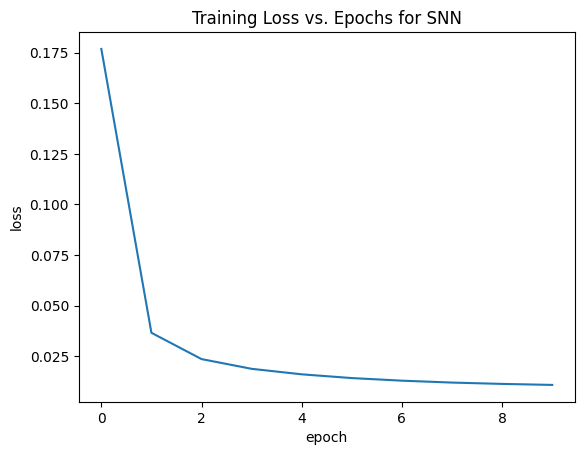

In [305]:
# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
spiking_LIF_model.compile(optimizer='adam', loss=loss)
#spiking_LIF_model.compile(optimizer=optimizer, loss=loss)
spiking_model_LIF_epochs = spiking_LIF_model.fit(X_train,y_train,epochs=epochs,
                                                 batch_size=batch_size)
plot_training_loss(spiking_model_LIF_epochs, "SNN")

## Evaluate SNN LIF Model using MAE, RMSE, and MAPE.

In [306]:
print("Dense LIF SNN Predictions for Training Set")
snn_LIF_pred_train = spiking_LIF_model.predict(X_train)
print("Dense LIF SNN Predictions for Testing Set")
snn_LIF_pred_test = spiking_LIF_model.predict(X_test)
print(snn_LIF_pred_test.shape)
snn_LIF_mae = mean_absolute_error(y_test, snn_LIF_pred_test)
print("MAE of LIF SNN  model = ",snn_LIF_mae)
snn_LIF_rmse =  mean_squared_error(y_test, snn_LIF_pred_test) ** 0.5
print("RMSE of LIF SNN model = ",snn_LIF_rmse)
#rnn_r2_score = r2_score(y_test,rnn_predictions_test)
#print("R2 Score of RNN model = ",rnn_r2_score)
snn_LIF_mape_score = 100*mean_absolute_percentage_error(y_test, snn_LIF_pred_test)
print("MAPE Score of LIF SNN model = {0} %".format(snn_LIF_mape_score))

Dense LIF SNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
Dense LIF SNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
(1739, 1)
MAE of LIF SNN  model =  0.09162704246629147
RMSE of LIF SNN model =  0.11733463333476109
MAPE Score of LIF SNN model = 75.4869468703498 %


In [307]:
perform_statistical_tests(y_test, snn_LIF_pred_test, "LIF SNN")


--- Statistical Tests for LIF SNN ---
Paired t-test: t-statistic = -5.9229, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             646694.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


## Reverse Transform Scaler to Convert to Real Values.

In [308]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
snn_LIF_pred_inv_train = scaler.inverse_transform(snn_LIF_pred_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
snn_LIF_pred_inv_test = scaler.inverse_transform(snn_LIF_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
snn_LIF_pred_inv_train = snn_LIF_pred_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
snn_LIF_pred_inv_test = snn_LIF_pred_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [309]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_SNN_LIF_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': snn_LIF_pred_inv_train})
results_SNN_LIF_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,54.948257
1,2023-03-06 01:00:00,54.239836,54.948257
2,2023-03-06 02:00:00,51.970794,50.901680
3,2023-03-06 03:00:00,49.701251,53.282551
4,2023-03-06 04:00:00,48.048558,50.888557
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,63.510574
7032,2023-12-24 01:00:00,56.957176,52.013351
7033,2023-12-24 02:00:00,54.922600,53.793285
7034,2023-12-24 03:00:00,52.233917,53.204861


### With Testing Dates.

In [310]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_SNN_LIF_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': snn_LIF_pred_inv_test})
results_SNN_LIF_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,53.204861
1,2023-12-25 02:00:00,47.495000,49.032085
2,2023-12-25 03:00:00,46.850460,50.288517
3,2023-12-25 04:00:00,47.579286,54.335094
4,2023-12-25 05:00:00,49.760594,56.066917
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.749222
1735,2024-03-06 08:00:00,65.973345,65.725365
1736,2024-03-06 09:00:00,64.305188,64.731911
1737,2024-03-06 10:00:00,63.536353,64.947266


## Plotting Predictions for PeMS Dataset Output made by SNN LIF Model.

### Only Testing Data.

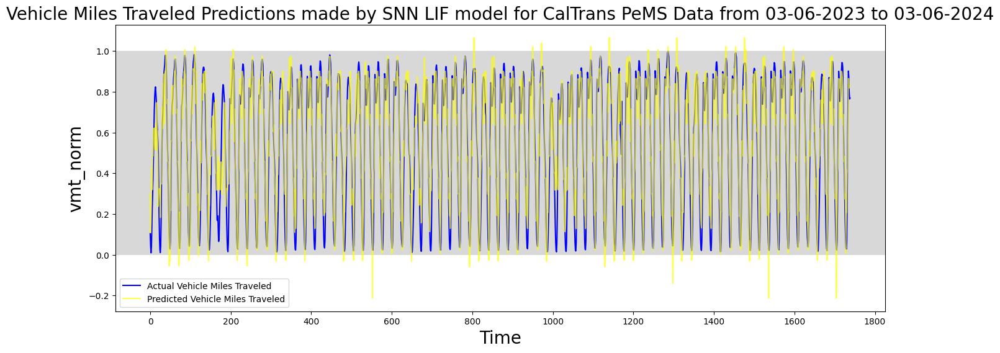

In [311]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(snn_LIF_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN LIF model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Training and Testing Data combined.

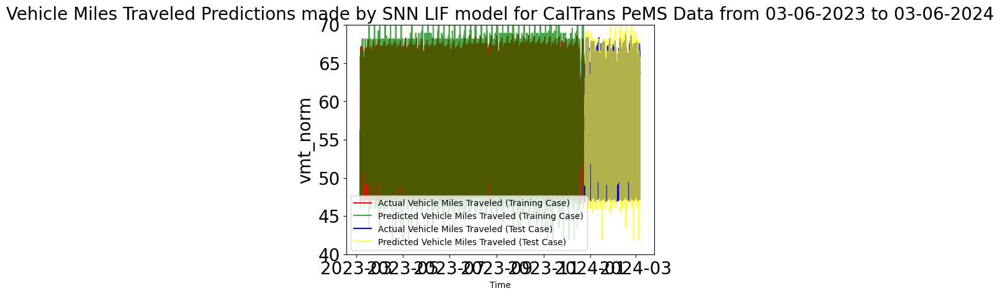

In [312]:
plt.plot(results_SNN_LIF_train['Date'], results_SNN_LIF_train['Actual'], color='red',
         label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_SNN_LIF_train['Date'],  results_SNN_LIF_train['Predicted'], alpha=0.7,
         color='green', label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_SNN_LIF_test['Date'], results_SNN_LIF_test['Actual'], color='blue',
         label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_SNN_LIF_test['Date'], results_SNN_LIF_test['Predicted'], alpha=0.7,
         color='yellow', label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN LIF model for {1}".
          format(feature, title_name), fontsize = 20)
plt.xlabel('Time', fontsize = 10)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

## Combine Actual and Predicted Results for Train and Test Cases for SNN LIF Model.

In [313]:
results_SNN_LIF = [results_SNN_LIF_train, results_SNN_LIF_test]
results_SNN_LIF = pd.concat(results_SNN_LIF)
display(results_SNN_LIF)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,54.948257
1,2023-03-06 01:00:00,54.239836,54.948257
2,2023-03-06 02:00:00,51.970794,50.901680
3,2023-03-06 03:00:00,49.701251,53.282551
4,2023-03-06 04:00:00,48.048558,50.888557
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.749222
1735,2024-03-06 08:00:00,65.973345,65.725365
1736,2024-03-06 09:00:00,64.305188,64.731911
1737,2024-03-06 10:00:00,63.536353,64.947266


## Plot Output Spikes

In [314]:
check_output(spiking_LIF_model, X_train, X_test, y_train, y_test)

length of seq_model.layers:  5
layer type:  <class 'keras.src.layers.reshaping.reshape.Reshape'>
layer name:  reshape_5
layer type:  <class 'keras.src.layers.rnn.time_distributed.TimeDistributed'>
layer name:  time_distributed_5
layer type:  <class '__main__.LIFNeuron'>
layer name:  lif_neuron
layer type:  <class 'keras.src.layers.pooling.global_average_pooling1d.GlobalAveragePooling1D'>
layer name:  global_average_pooling1d_5
layer type:  <class 'keras.src.layers.core.dense.Dense'>
layer name:  dense_21
Error: No SpikingActivation or compatible layer found in the model for spike plotting.


## Plotting Residuals for Actual and Predicted Results for LIF SNN.

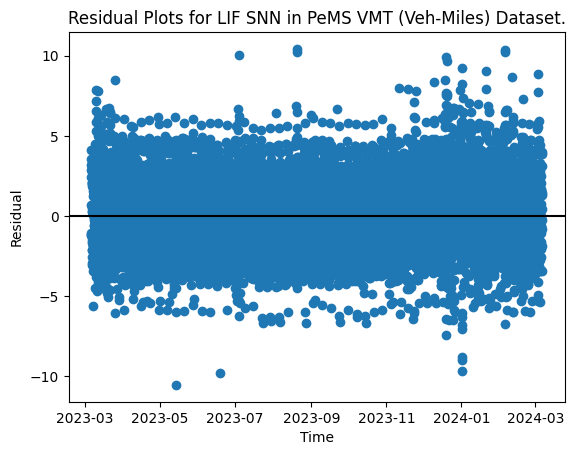

In [315]:
actual_arr_SNN_LIF = np.array(results_SNN_LIF['Actual'])
pred_arr_SNN_LIF = np.array(results_SNN_LIF['Predicted'])
residuals_SNN_LIF = pred_arr_SNN_LIF - actual_arr_SNN_LIF
plt.scatter(results_SNN_LIF['Date'], residuals_SNN_LIF)
plt.axhline(y=0, color = 'black')
plt.title("Residual Plots for LIF SNN in PeMS {} Dataset.".format(feature_field))
plt.xlabel("Time")
plt.ylabel("Residual")
plt.show()

## Energy Consumption

In [316]:
spiking_LIF_energy_results = measure_snn_energy(spiking_LIF_model, X_test, model_name_str='LIF SNN Model')

Measuring inference time and estimating energy on CPU (for SNN)...
  CPU Inference Time: 0.1607 seconds
  Estimated CPU Energy: 12.8559 Joules (12855949.4019 µJ)

No GPU available. GPU measurements skipped.
Estimated total spikes: 4451840
Estimated SNN Spike Energy: 4451.8400 µJ


# Spiking Network Model with LIF (Version 4)

## Create New SNN and LIF Class

### Create Model

In [317]:
spiking_LIFv3_model = tf.keras.Sequential(
    [
        # Add temporal dimension to model. For this dataset, the input_shape is
        # passed into the model.
        tf.keras.layers.Reshape((-1, X_train.shape[1]),
                                input_shape=(None, X_train.shape[1])),
        # Keras' TimeDistributed wrapper allows Dense layer to operate on
        # temporal data.
        tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(128)),
        #tf.keras.layers.Dense(64, activation='tanh'),
        #LIFNeuronV3(threshold=1.25, leak_rate=0.06, refractory_period=5),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        LIFNeuronV3(threshold=0.5, leak_rate=0.01, refractory_period=275),
        tf.keras.layers.Dropout(0.2),
        tf.keras.layers.Reshape((-1, 128)),  # Reshape to (batch_size, time_steps, features)

        #tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(64)),
        #tf.keras.layers.Activation('tanh'),  # Non-linearity before LIF
        #LIFNeuronV3(threshold=0.5, leak_rate=0.01, refractory_period=5),


        #tf.keras.layers.Dropout(0.01),  # Added dropout
        # Use tf.keras.layers.Permute to swap the time_steps and num_neurons dimensions
        #tf.keras.layers.Permute((2, 1)),  # Now shape is (batch_size, num_neurons, time_steps)
        #tf.keras.layers.Reshape((-1, 64)),  # Reshape to (batch_size, time_steps, num_neurons)
        # GlobalAveragePooling1D: Averages spiking output over time. Used for
        # determining the spiking rate of neuron.
        #keras_spiking.SpikingActivation("tanh", dt = 100,
        #                                spiking_aware_training=True),
        #SpikingActivation(activation=tf.keras.activations.tanh, dt = 100,
        #                  spiking_aware_training=True),
        tf.keras.layers.GlobalAveragePooling1D(),
        #tf.keras.layers.GlobalAveragePooling1D(data_format='channels_last'),
        #tf.keras.layers.Dense(future),
        #tf.keras.layers.Flatten(),  # Add Flatten layer
        #tf.keras.layers.Reshape((batch_size, 1)),  # Reshape to (batch_size, 1)
        #tf.keras.layers.Lambda(lambda x: x[:, -1]),
        tf.keras.layers.Dense(1),
        #tf.keras.layers.Dense(1, input_shape=(X_train.shape[1] * 64, )),

    ]

)

spiking_LIFv3_model.summary()

Instructions for updating:
Use fn_output_signature instead


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_6 (Reshape)             │ (None, None, 20)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_6              │ (None, None, 128)      │         2,688 │
│ (TimeDistributed)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lif_neuron_v3 (LIFNeuronV3)     │ (None, None, 1, 128)   │           129 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, None, 1, 128)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_7 (Reshape)             │ (None, None, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_6      │ (None, 128)            │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │           129 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,946 (11.51 KB)

 Trainable params: 2,817 (11.00 KB)

 Non-trainable params: 129 (516.00 B)

## Training SNN V4 Model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 0.1983
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - loss: 0.0734
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0497
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0389
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0331
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 18ms/step - loss: 0.0309
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 13ms/step - loss: 0.0271
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - loss: 0.0262
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0240
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0235


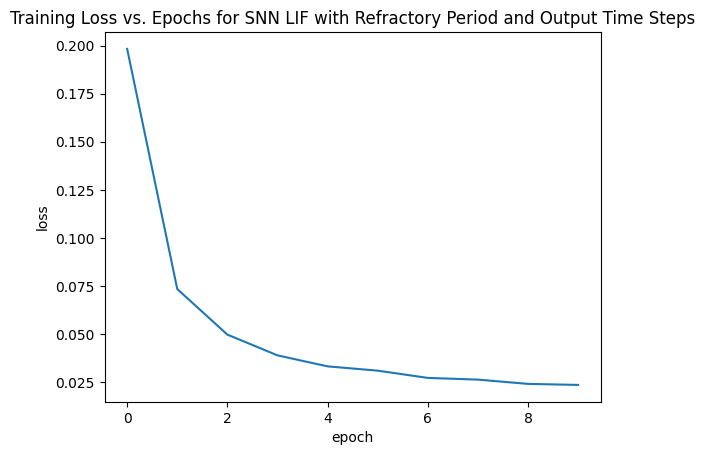

In [318]:
# Compile the model
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
spiking_LIFv3_model.compile(optimizer='adam', loss=loss)
spiking_LIFv3_model.compile(optimizer=optimizer, loss=loss)
spiking_LIFv3_model_epochs = spiking_LIFv3_model.fit(X_train,y_train,epochs=epochs,
                                                 batch_size=batch_size)
plot_training_loss(spiking_LIFv3_model_epochs, "SNN LIF with Refractory Period and Output Time Steps")

## Evaluating SNN V4 Model using MAE, RMSE, R2.

In [319]:
print("SNN v4 Predictions for Training Set")
spiking_LIFv3_model_pred_train = spiking_LIFv3_model.predict(X_train)
print("SNN v4 Predictions for Training Set")
spiking_LIFv3_model_pred_test = spiking_LIFv3_model.predict(X_test)
print(spiking_LIFv3_model_pred_test.shape)

# Reshape the model predictions if necessary
#spiking_LIFv3_model_pred_test = spiking_LIFv3_model_pred_test.reshape(y_test.shape)

spiking_LIFv3_model_mae = mean_absolute_error(y_test, spiking_LIFv3_model_pred_test)
print("MAE of SNN v4 model = ",spiking_LIFv3_model_mae)
spiking_LIFv3_model_rmse =  mean_squared_error(y_test, spiking_LIFv3_model_pred_test) ** 0.5
print("RMSE of SNN v4  model = ", spiking_LIFv3_model_rmse)
spiking_LIFv3_model_r2_score = r2_score(y_test, spiking_LIFv3_model_pred_test)
print("R2 Score of SNN v4 model = ", spiking_LIFv3_model_r2_score)
spiking_LIFv3_model_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                                    spiking_LIFv3_model_pred_test)
print("MAPE Score of SNN v4 model = {0} %".format(spiking_LIFv3_model_mape_score))

SNN v4 Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
SNN v4 Predictions for Training Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
(1739, 1)
MAE of SNN v4 model =  0.10566215232985647
RMSE of SNN v4  model =  0.13660579280122703
R2 Score of SNN v4 model =  0.8180493200124712
MAPE Score of SNN v4 model = 102.9230841944682 %


In [320]:
perform_statistical_tests(y_test, spiking_LIFv3_model_pred_test, "LIF SNN V3")


--- Statistical Tests for LIF SNN V3 ---
Paired t-test: t-statistic = -5.3420, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             673082.0000, p-value = 0.0001
(Result is statistically significant: there is a significant difference between actual and predicted values)


## Reverse Transform Scaler to Convert to Real Values.

In [321]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
spiking_LIFv3_model_inv_train = scaler.inverse_transform(spiking_LIFv3_model_pred_train)

y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
spiking_LIFv3_model_inv_test = scaler.inverse_transform(spiking_LIFv3_model_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
spiking_LIFv3_model_inv_train = spiking_LIFv3_model_inv_train.flatten()

y_test_inverse = y_test_inverse.flatten()
spiking_LIFv3_model_inv_test = spiking_LIFv3_model_inv_test.flatten()

## Show Actual and Predicted y values as Dataframes.

### With Training Dates.

In [322]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_SNN_LIFv3_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': spiking_LIFv3_model_inv_train})
results_SNN_LIFv3_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,57.969868
1,2023-03-06 01:00:00,54.239836,56.093979
2,2023-03-06 02:00:00,51.970794,52.673450
3,2023-03-06 03:00:00,49.701251,51.911335
4,2023-03-06 04:00:00,48.048558,49.770561
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,62.161095
7032,2023-12-24 01:00:00,56.957176,59.863422
7033,2023-12-24 02:00:00,54.922600,57.346523
7034,2023-12-24 03:00:00,52.233917,56.756973


### With Testing Dates.

In [323]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_SNN_LIFv3_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': spiking_LIFv3_model_inv_test})
results_SNN_LIFv3_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,56.756973
1,2023-12-25 02:00:00,47.495000,56.782059
2,2023-12-25 03:00:00,46.850460,54.976135
3,2023-12-25 04:00:00,47.579286,55.994862
4,2023-12-25 05:00:00,49.760594,55.994862
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,60.229000
1735,2024-03-06 08:00:00,65.973345,59.625214
1736,2024-03-06 09:00:00,64.305188,63.021580
1737,2024-03-06 10:00:00,63.536353,64.504631


## Plotting Predictions for PeMS Dataset Output made by SNN LIF Model.

### Only Testing Data.

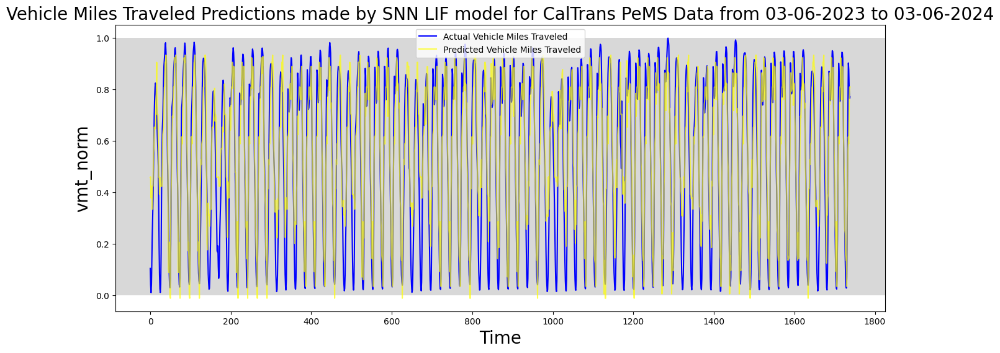

In [324]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(spiking_LIFv3_model_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN LIF model for {1}".
          format(feature, title_name), fontsize = 20)
plt.rc('xtick', labelsize=20)
plt.rc('ytick', labelsize=20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Training and Testing Data combined.

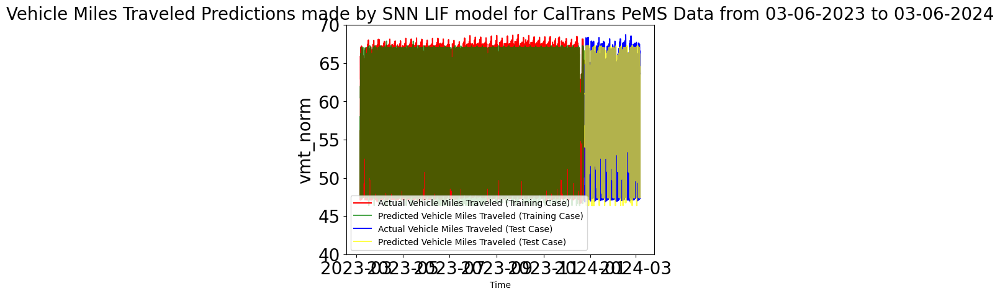

In [325]:
plt.plot(results_SNN_LIFv3_train['Date'], results_SNN_LIFv3_train['Actual'],
         color='red', label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_SNN_LIFv3_train['Date'],  results_SNN_LIFv3_train['Predicted'],
         alpha=0.7, color='green',
         label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_SNN_LIFv3_test['Date'], results_SNN_LIFv3_test['Actual'],
         color='blue', label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_SNN_LIFv3_test['Date'], results_SNN_LIFv3_test['Predicted'],
         alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by SNN LIF model for {1}".
          format(feature, title_name), fontsize = 20)
plt.xlabel('Time', fontsize = 10)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

## Combine Actual and Predicted Results for Train and Test Cases for SNN LIF Model.

In [326]:
results_SNN_LIFv3 = [results_SNN_LIFv3_train, results_SNN_LIFv3_test]
results_SNN_LIFv3 = pd.concat(results_SNN_LIFv3)
display(results_SNN_LIFv3)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,57.969868
1,2023-03-06 01:00:00,54.239836,56.093979
2,2023-03-06 02:00:00,51.970794,52.673450
3,2023-03-06 03:00:00,49.701251,51.911335
4,2023-03-06 04:00:00,48.048558,49.770561
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,60.229000
1735,2024-03-06 08:00:00,65.973345,59.625214
1736,2024-03-06 09:00:00,64.305188,63.021580
1737,2024-03-06 10:00:00,63.536353,64.504631


## Plot Output Spikes

In [327]:
check_output(spiking_LIF_model, X_train, X_test, y_train, y_test)

length of seq_model.layers:  5
layer type:  <class 'keras.src.layers.reshaping.reshape.Reshape'>
layer name:  reshape_5
layer type:  <class 'keras.src.layers.rnn.time_distributed.TimeDistributed'>
layer name:  time_distributed_5
layer type:  <class '__main__.LIFNeuron'>
layer name:  lif_neuron
layer type:  <class 'keras.src.layers.pooling.global_average_pooling1d.GlobalAveragePooling1D'>
layer name:  global_average_pooling1d_5
layer type:  <class 'keras.src.layers.core.dense.Dense'>
layer name:  dense_21
Error: No SpikingActivation or compatible layer found in the model for spike plotting.


## Energy Consumption

In [328]:
spiking_LIFv3_energy_results = measure_snn_energy(spiking_LIFv3_model, X_test, model_name_str='LIF SNN V3 Model')

Measuring inference time and estimating energy on CPU (for SNN)...
  CPU Inference Time: 0.2924 seconds
  Estimated CPU Energy: 23.3936 Joules (23393592.8345 µJ)

No GPU available. GPU measurements skipped.
Estimated total spikes: 4451840
Estimated SNN Spike Energy: 4451.8400 µJ


# Hybrid Models

## CNN-RNN model

### Create CNN-RNN Model.

In [339]:
cnn_rnn_model = Sequential()

cnn_rnn_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_rnn_model.add(MaxPooling1D(pool_size=2))

cnn_rnn_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_rnn_model.add(MaxPooling1D(pool_size=2))

#cnn_rnn_model.add(Conv1D(filters=60, kernel_size=2, activation='relu',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_rnn_model.add(MaxPooling1D(pool_size=2))

#cnn_rnn_model.add(SimpleRNN(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_rnn_model.add(Dropout(0.5))

#cnn_rnn_model.add(SimpleRNN(64,activation="tanh",return_sequences=True))
#cnn_rnn_model.add(Dropout(0.8))

#cnn_rnn_model.add(SimpleRNN(64, activation="tanh",return_sequences=True))
#cnn_rnn_model.add(Dropout(0.8))

cnn_rnn_model.add(SimpleRNN(unit, activation=activation,return_sequences=False))
cnn_rnn_model.add(Dropout(0.1))

cnn_rnn_model.add(Dense(1))
cnn_rnn_model.compile(optimizer='adam', loss='mse')
cnn_rnn_model.summary()

Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_6 (Conv1D)               │ (None, 18, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_6 (MaxPooling1D)  │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_7 (Conv1D)               │ (None, 7, 32)          │         3,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_7 (MaxPooling1D)  │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ simple_rnn_4 (SimpleRNN)        │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,345 (20.88 KB)

 Trainable params: 5,345 (20.88 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-RNN Model.


Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0467
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0128
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 0.0106
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0095
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0088
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0081
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0076
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0071
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0069
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0063


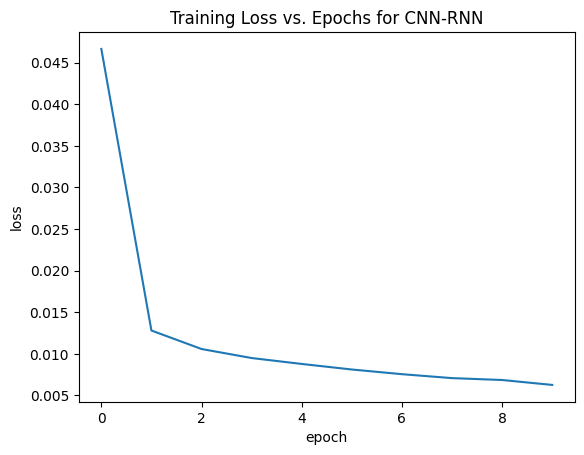

In [340]:
cnn_rnn_model.compile(optimizer="adam",loss=loss)
cnn_rnn_epochs = cnn_rnn_model.fit(X_train, y_train, epochs=epochs,
                                   batch_size=batch_size)
plot_training_loss(cnn_rnn_epochs, "CNN-RNN")

### Evaluate CNN-RNN model using MAE, RMSE, and R^2.

In [341]:
print("CNN-RNN Predictions for Training Set")
cnn_rnn_pred_train = cnn_rnn_model.predict(X_train)
print("CNN-RNN Predictions for Testing Set")
cnn_rnn_pred_test = cnn_rnn_model.predict(X_test)
cnn_rnn_mae = mean_absolute_error(y_test,cnn_rnn_pred_test)
print("MAE of CNN-RNN model = ",cnn_rnn_mae)
cnn_rnn_rmse =  mean_squared_error(y_test,cnn_rnn_pred_test) ** 0.5
print("RMSE of CNN-RNN model = ",cnn_rnn_rmse)
cnn_rnn_r2_score = r2_score(y_test,cnn_rnn_pred_test)
print("R2 Score of CNN-RNN model = ",cnn_rnn_r2_score)
cnn_rnn_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                        cnn_rnn_pred_test)
print("MAPE Score of CNN-RNN model = {0} %".format(cnn_rnn_mape_score))
cnn_rnn_smape_score = 100*symmetric_mean_absolute_percentage_error(y_test,
                                                                   cnn_rnn_pred_test)
print("sMAPE Score of CNN-RNN model = {0} %".format(cnn_rnn_smape_score))

CNN-RNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
CNN-RNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of CNN-RNN model =  0.05250542773125757
RMSE of CNN-RNN model =  0.07371342568754548
R2 Score of CNN-RNN model =  0.9470204042603322
MAPE Score of CNN-RNN model = 35.51723434559895 %
sMAPE Score of CNN-RNN model = 7836.690963617848 %


In [342]:
perform_statistical_tests(y_test, cnn_rnn_pred_test, "CNN-RNN")


--- Statistical Tests for CNN-RNN ---
Paired t-test: t-statistic = -7.2410, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             663410.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


### Calculate 95% Confidence Intervals for CNN-RNN MAE and RMSE

In [343]:
cnn_rnn_mae_ci_lower, cnn_rnn_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_rnn_pred_test.flatten(), mean_absolute_error)
print(f"CNN-RNN MAE 95% CI: [{cnn_rnn_mae_ci_lower:.4f}, {cnn_rnn_mae_ci_upper:.4f}]")

cnn_rnn_rmse_ci_lower, cnn_rnn_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_rnn_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-RNN RMSE 95% CI: [{cnn_rnn_rmse_ci_lower:.4f}, {cnn_rnn_rmse_ci_upper:.4f}]")

CNN-RNN MAE 95% CI: [0.0499, 0.0548]
CNN-RNN RMSE 95% CI: [0.0698, 0.0775]


### Reverse Transform Scaler to Convert to Real Values.

In [344]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_rnn_pred_inv_train = scaler.inverse_transform(cnn_rnn_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_rnn_pred_inv_test = scaler.inverse_transform(cnn_rnn_pred_test)

# Get values after inverse transformation
y_train_inverse = y_train_inverse.flatten()
cnn_rnn_pred_inv_train = cnn_rnn_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_rnn_pred_inv_test = cnn_rnn_pred_inv_test.flatten()

In [345]:
int(test_size*df.shape[0]) + 1 - seq_len

1740

### Showing Actual y and Predicted y values as Dataframes.


#### With Training Dates.


In [346]:
first_6169_index_dates = df.index[:X_train.shape[0]]
results_CNN_RNN_train = pd.DataFrame({"Date": first_6169_index_dates,
                                  'Actual': y_train_inverse,
                                  'Predicted': cnn_rnn_pred_inv_train})
results_CNN_RNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,58.339916
1,2023-03-06 01:00:00,54.239836,55.818523
2,2023-03-06 02:00:00,51.970794,52.722786
3,2023-03-06 03:00:00,49.701251,49.992332
4,2023-03-06 04:00:00,48.048558,48.467823
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,60.647266
7032,2023-12-24 01:00:00,56.957176,57.916435
7033,2023-12-24 02:00:00,54.922600,54.625511
7034,2023-12-24 03:00:00,52.233917,52.654240


#### With Testing Dates.

In [347]:
last_6169_index_dates = df.index[-X_test.shape[0]:]
results_CNN_RNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                     'Actual': y_test_inverse,
                                     'Predicted': cnn_rnn_pred_inv_test})
results_CNN_RNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,51.422539
1,2023-12-25 02:00:00,47.495000,50.677414
2,2023-12-25 03:00:00,46.850460,50.029095
3,2023-12-25 04:00:00,47.579286,51.134113
4,2023-12-25 05:00:00,49.760594,53.338310
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.452126
1735,2024-03-06 08:00:00,65.973345,65.659538
1736,2024-03-06 09:00:00,64.305188,64.438133
1737,2024-03-06 10:00:00,63.536353,63.767105


### Plotting Predictions for Q/VMT/VHT made by CNN-RNN Model.


#### Only Testing Data.

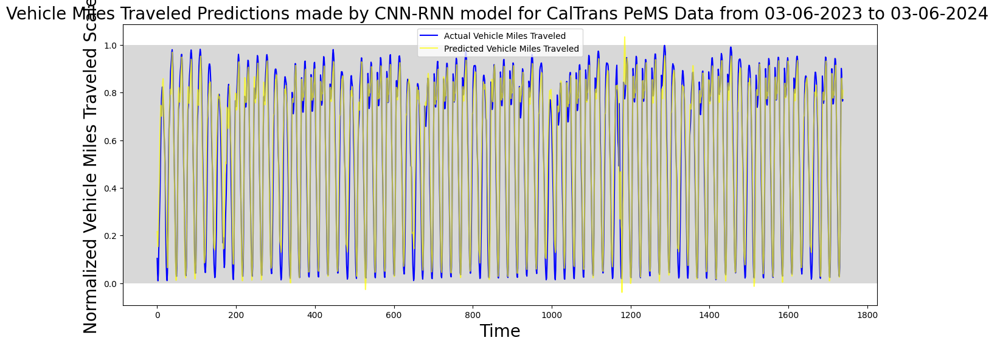

In [348]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_rnn_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-RNN model for {1} ".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel('Normalized {0} Scale'.format(feature), fontsize = 20)
plt.legend()
plt.show()

#### Training and Test Data Combined.

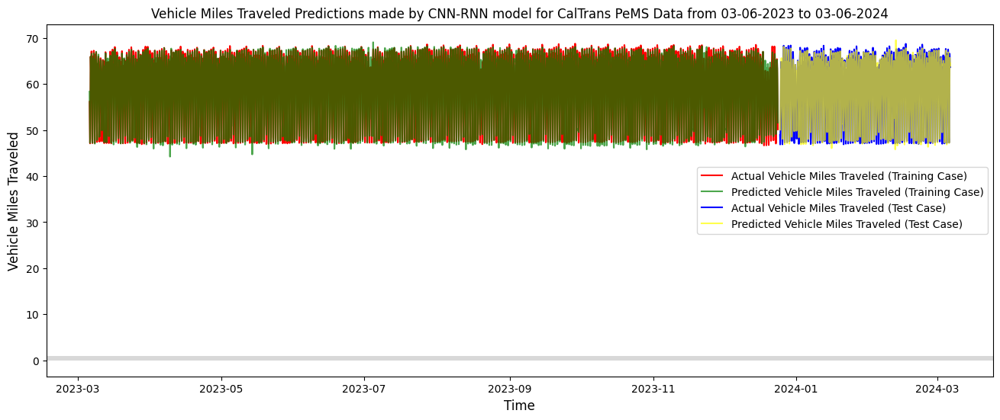

In [349]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_RNN_train['Date'], results_CNN_RNN_train['Actual'],
         color='red',label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_CNN_RNN_train['Date'], results_CNN_RNN_train['Predicted'],
         alpha=0.7, color='green',
          label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Actual'],
         color='blue', label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Predicted'],
         alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-RNN model for {1}".
          format(feature, title_name), fontsize = 12)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-RNN.

In [350]:
results_CNN_RNN = [results_CNN_RNN_train, results_CNN_RNN_test]
results_CNN_RNN = pd.concat(results_CNN_RNN)
display(results_CNN_RNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,58.339916
1,2023-03-06 01:00:00,54.239836,55.818523
2,2023-03-06 02:00:00,51.970794,52.722786
3,2023-03-06 03:00:00,49.701251,49.992332
4,2023-03-06 04:00:00,48.048558,48.467823
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.452126
1735,2024-03-06 08:00:00,65.973345,65.659538
1736,2024-03-06 09:00:00,64.305188,64.438133
1737,2024-03-06 10:00:00,63.536353,63.767105


### Plotting Residuals for Actual and Predicted Results for CNN-RNN.


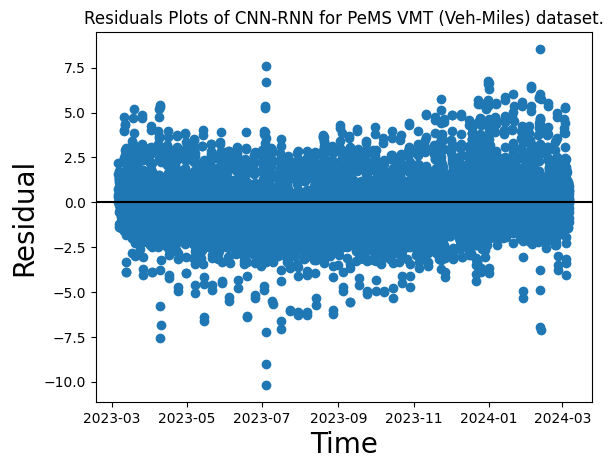

In [351]:
actual_arr_CNN_RNN = np.array(results_CNN_RNN['Actual'])
predicted_arr_CNN_RNN = np.array(results_CNN_RNN['Predicted'])
residuals_CNN_RNN = predicted_arr_CNN_RNN - actual_arr_CNN_RNN
plt.scatter(results_CNN_RNN['Date'], residuals_CNN_RNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots of CNN-RNN for PeMS {} dataset.".format(feature_field))
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.show()

From the residual plots for the CNN-RNN model, it can be concluded that the CNN-RNN model is a good fit.

### Energy Consumption

In [352]:
# Removed keras_spiking.ModelEnergy calls from here as requested

In [353]:
# Removed keras_spiking.ModelEnergy calls from here as requested

In [354]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")

Model execution time: 5.173683166503906e-05 seconds


## CNN-LSTM model

### Create CNN-LSTM Model.


In [355]:
cnn_lstm_model = Sequential()

cnn_lstm_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))

cnn_lstm_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_model.add(MaxPooling1D(pool_size=2))

#cnn_lstm_model.add(Conv1D(filters=60, kernel_size=2, activation='relu',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_lstm_model.add(MaxPooling1D(pool_size=2))

#cnn_lstm_model.add(LSTM(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_lstm_model.add(Dropout(0.5))

#cnn_lstm_model.add(LSTM(64,activation="tanh",return_sequences=True))
#cnn_lstm_model.add(Dropout(0.8))

#cnn_lstm_model.add(LSTM(64, activation="tanh",return_sequences=True))
#cnn_lstm_model.add(Dropout(0.8))

cnn_lstm_model.add(LSTM(unit, activation=activation,return_sequences=False))
cnn_lstm_model.add(Dropout(0.1))

cnn_lstm_model.add(Dense(1))
cnn_lstm_model.compile(optimizer='adam', loss='mse')
cnn_lstm_model.summary()

Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_8 (Conv1D)               │ (None, 18, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_8 (MaxPooling1D)  │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_9 (Conv1D)               │ (None, 7, 32)          │         3,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_9 (MaxPooling1D)  │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,585 (45.25 KB)

 Trainable params: 11,585 (45.25 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-LSTM Model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 0.0667
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0154
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0118
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0102
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0091
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0085
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0078
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0070
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0064
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0063


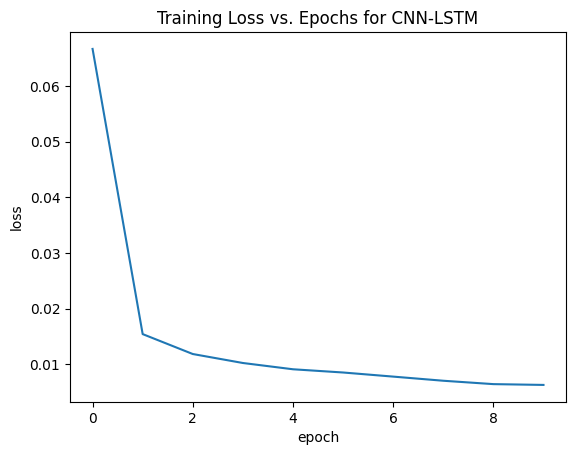

In [356]:
cnn_lstm_model.compile(optimizer="adam",loss=loss)
cnn_lstm_epochs = cnn_lstm_model.fit(X_train, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(cnn_lstm_epochs, "CNN-LSTM")

### Evaluate CNN-LSTM model using MAE, RMSE, and R^2.

In [357]:
print("CNN-LSTM Predictions for Training Set")
cnn_lstm_pred_train = cnn_lstm_model.predict(X_train)
print("CNN-LSTM Predictions for Testing Set")
cnn_lstm_pred_test = cnn_lstm_model.predict(X_test)
cnn_lstm_mae = mean_absolute_error(y_test,cnn_lstm_pred_test)
print("MAE of CNN-LSTM model = ",cnn_lstm_mae)
cnn_lstm_rmse =  mean_squared_error(y_test,cnn_lstm_pred_test) ** 0.5
print("RMSE of CNN-LSTM model = ",cnn_lstm_rmse)
cnn_lstm_r2_score = r2_score(y_test, cnn_lstm_pred_test)
print("R^2 Score of CNN-LSTM model = ",cnn_lstm_r2_score)
cnn_lstm_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_lstm_pred_test)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_mape_score))

CNN-LSTM Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
CNN-LSTM Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
MAE of CNN-LSTM model =  0.062439373498196706
RMSE of CNN-LSTM model =  0.07906343566190192
R^2 Score of CNN-LSTM model =  0.9390509675480655
MAPE Score of CNN-LSTM model = 45.390624068488485 %


In [358]:
perform_statistical_tests(y_test, cnn_lstm_pred_test, "CNN-LSTM")


--- Statistical Tests for CNN-LSTM ---
Paired t-test: t-statistic = -16.9066, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             425121.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


### Calculate 95% Confidence Intervals for CNN-LSTM MAE and RMSE

In [359]:
cnn_lstm_mae_ci_lower, cnn_lstm_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test.flatten(), mean_absolute_error)
print(f"CNN-LSTM MAE 95% CI: [{cnn_lstm_mae_ci_lower:.4f}, {cnn_lstm_mae_ci_upper:.4f}]")

cnn_lstm_rmse_ci_lower, cnn_lstm_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-LSTM RMSE 95% CI: [{cnn_lstm_rmse_ci_lower:.4f}, {cnn_lstm_rmse_ci_upper:.4f}]")

CNN-LSTM MAE 95% CI: [0.0603, 0.0647]
CNN-LSTM RMSE 95% CI: [0.0763, 0.0820]


### Reverse Transform Scaler to Convert to Real Values.

In [360]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_lstm_pred_inv_train = scaler.inverse_transform(cnn_lstm_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_lstm_pred_inv_test = scaler.inverse_transform(cnn_lstm_pred_test)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_lstm_pred_inv_train = cnn_lstm_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_lstm_pred_inv_test = cnn_lstm_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.


In [361]:
results_CNN_LSTM_train = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_lstm_pred_inv_train})
results_CNN_LSTM_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,59.217903
1,2023-03-06 01:00:00,54.239836,57.310204
2,2023-03-06 02:00:00,51.970794,54.316738
3,2023-03-06 03:00:00,49.701251,51.228683
4,2023-03-06 04:00:00,48.048558,49.021488
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,61.826363
7032,2023-12-24 01:00:00,56.957176,59.762119
7033,2023-12-24 02:00:00,54.922600,56.902050
7034,2023-12-24 03:00:00,52.233917,54.198582


In [362]:
# Now let's see our actual y and predicted y values as dataframes
results_CNN_LSTM_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_lstm_pred_inv_test})
results_CNN_LSTM_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,51.359627
1,2023-12-25 02:00:00,47.495000,50.664261
2,2023-12-25 03:00:00,46.850460,50.292000
3,2023-12-25 04:00:00,47.579286,51.010723
4,2023-12-25 05:00:00,49.760594,52.169537
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,64.022789
1735,2024-03-06 08:00:00,65.973345,64.160957
1736,2024-03-06 09:00:00,64.305188,63.975204
1737,2024-03-06 10:00:00,63.536353,64.062340


### Plotting Predictions for VHT/VMT/Q made by CNN-LSTM Model.

#### Only Testing Data.

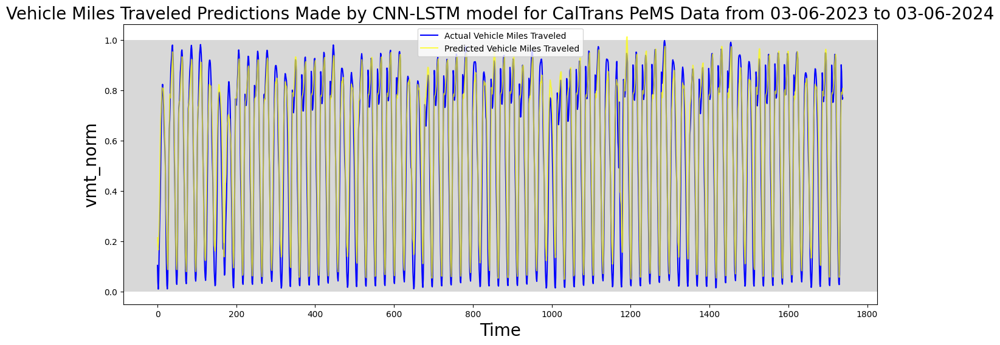

In [363]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_lstm_pred_test, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data Comsbined.

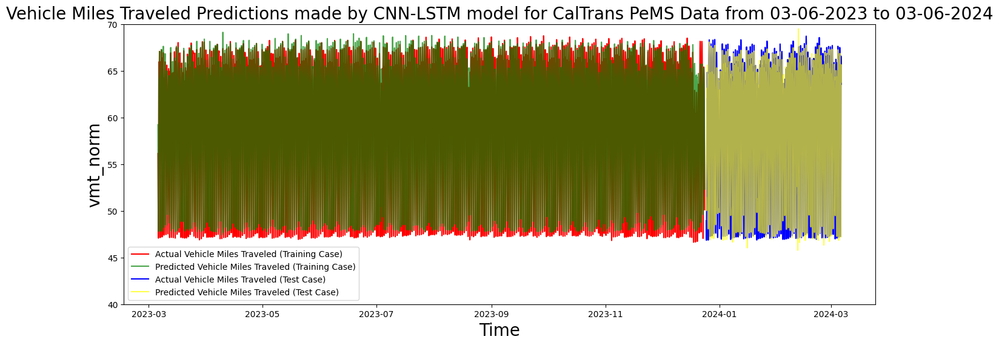

In [364]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_LSTM_train['Date'], results_CNN_LSTM_train['Actual'],
         color='red', label=f'Actual {feature} (Training Case)')
plt.plot(results_CNN_LSTM_train['Date'],  results_CNN_LSTM_train['Predicted'],
         alpha=0.7, color='green', label=f'Predicted {feature} (Training Case)')
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Actual'],
         color='blue', label=f'Actual {feature} (Test Case)')
plt.plot(results_CNN_RNN_test['Date'], results_CNN_RNN_test['Predicted'],
         alpha=0.7, color='yellow', label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-LSTM model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-LSTM.



In [365]:
results_CNN_LSTM = [results_CNN_LSTM_train, results_CNN_LSTM_test]
results_CNN_LSTM = pd.concat(results_CNN_LSTM)
display(results_CNN_LSTM)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,59.217903
1,2023-03-06 01:00:00,54.239836,57.310204
2,2023-03-06 02:00:00,51.970794,54.316738
3,2023-03-06 03:00:00,49.701251,51.228683
4,2023-03-06 04:00:00,48.048558,49.021488
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,64.022789
1735,2024-03-06 08:00:00,65.973345,64.160957
1736,2024-03-06 09:00:00,64.305188,63.975204
1737,2024-03-06 10:00:00,63.536353,64.062340


### Plotting Residuals for Actual and Predicted Results for CNN-LSTM.

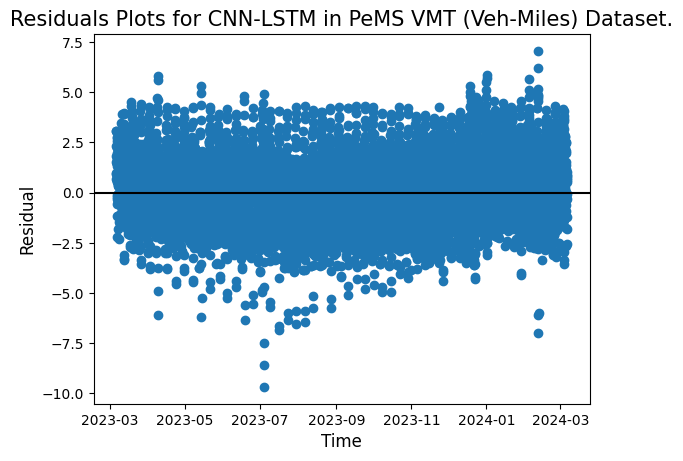

In [366]:
actual_arr_CNN_LSTM = np.array(results_CNN_LSTM['Actual'])
predicted_arr_CNN_LSTM = np.array(results_CNN_LSTM['Predicted'])
residuals_CNN_LSTM = predicted_arr_CNN_LSTM - actual_arr_CNN_LSTM
plt.scatter(results_CNN_LSTM['Date'], residuals_CNN_LSTM)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} Dataset.".
          format(feature_field), fontsize=15)
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

From the residual plots for the CNN-LSTM model, it can be concluded that the CNN-LSTM model is a good fit.

### Energy Consumption

In [367]:
measure_ann_energy(cnn_lstm_model, X_test)

Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2053 seconds
  Estimated CPU Energy: 16.4247 Joules (16424732.2083 µJ)

No GPU available. GPU measurements skipped.


{'model_name': 'sequential_17',
 'cpu_inference_time_s': 0.20530915260314941,
 'estimated_cpu_energy_J': 16.424732208251953,
 'estimated_cpu_energy_uJ': 16424732.208251953,
 'gpu_inference_time_s': None,
 'estimated_gpu_energy_J': None,
 'estimated_gpu_energy_uJ': None,
 'snn_spike_energy_uJ': None}

## CNN-LSTM Model Version 2

This version was taken from https://www.nature.com/articles/s41598-023-41314-y#Sec3



### Create CNN-LSTM Model Version 2.

In [368]:
cnn_lstm_v2 = Sequential()

#cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
#                        input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
                        input_shape=(100, X_train.shape[2])))
cnn_lstm_v2.add(MaxPooling1D(pool_size=2))

#cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
#                         input_shape=(seq_len, X_train.shape[2])))
cnn_lstm_v2.add(Conv1D(filters=32, kernel_size=2, activation='tanh',
                         input_shape=(100, X_train.shape[2])))
#cnn_lstm_v2.add(TimeDistributed(MaxPooling2D(pool_size=2)))
#cnn_lstm_v2.add(TimeDistributed(Flatten()))


#cnn_lstm_v2.add(Conv1D(filters=60, kernel_size=2, activation='relu',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_lstm_v2.add(MaxPooling1D(pool_size=2))

#cnn_lstm_v2.add(LSTM(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_lstm_v2.add(Dropout(0.5))

#cnn_lstm_v2.add(LSTM(64,activation="tanh",return_sequences=True))
#cnn_lstm_v2.add(Dropout(0.8))

cnn_lstm_v2.add(LSTM(32, activation="tanh",return_sequences=True))
#cnn_lstm_v2.add(Dropout(0.8))

cnn_lstm_v2.add(LSTM(32, activation="tanh",return_sequences=False))
#cnn_lstm_v2.add(Dropout(0.1))

cnn_lstm_v2.add(Dense(1))
cnn_lstm_v2.compile(optimizer='adam', loss='mse')
#cnn_lstm_v2.build(input_shape=(batch_size, seq_len, X_train.shape[1], X_train.shape[2], 1)) # Replace None with your batch size if known

cnn_lstm_v2.summary()

Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_10 (Conv1D)              │ (None, 99, 32)         │            96 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_10 (MaxPooling1D) │ (None, 49, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_11 (Conv1D)              │ (None, 48, 32)         │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_6 (LSTM)                   │ (None, 48, 32)         │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_7 (LSTM)                   │ (None, 32)             │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            33 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 18,849 (73.63 KB)

 Trainable params: 18,849 (73.63 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-LSTM Model V2.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 10ms/step - loss: 0.0640
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0151
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0088
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0066
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0057
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0049
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0041
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0035
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0028
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0022


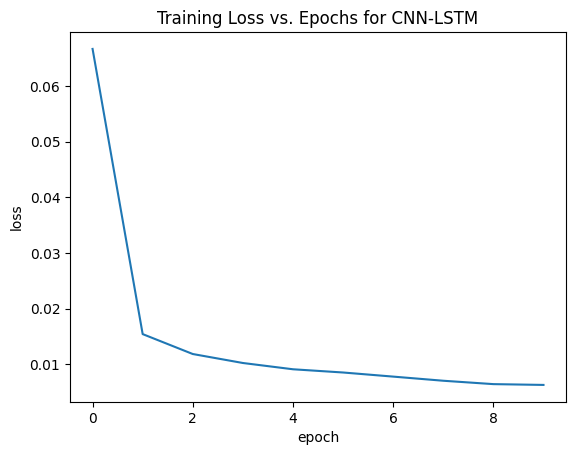

In [369]:
cnn_lstm_v2.compile(optimizer="adam",loss=loss)
cnn_lstm_v2_epochs = cnn_lstm_v2.fit(X_train, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(cnn_lstm_epochs, "CNN-LSTM")

### Evaluate CNN-LSTM V2 model using MAE, RMSE, and R^2.

In [370]:
print("CNN-LSTM Predictions for Training Set")
cnn_lstm_pred_train_v2 = cnn_lstm_v2.predict(X_train)
print("CNN-LSTM Predictions for Testing Set")
cnn_lstm_pred_test_v2 = cnn_lstm_v2.predict(X_test)
cnn_lstm_v2_mae = mean_absolute_error(y_test,cnn_lstm_pred_test_v2)
print("MAE of CNN-LSTM model = ",cnn_lstm_v2_mae)
cnn_lstm_v2_rmse =  mean_squared_error(y_test,cnn_lstm_pred_test_v2) ** 0.5
print("RMSE of CNN-LSTM model = ",cnn_lstm_v2_rmse)
cnn_lstm_v2_r2_score = r2_score(y_test, cnn_lstm_pred_test_v2)
print("R^2 Score of CNN-LSTM model = ",cnn_lstm_v2_r2_score)
cnn_lstm_v2_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_lstm_pred_test_v2)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_v2_mape_score))

CNN-LSTM Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step
CNN-LSTM Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
MAE of CNN-LSTM model =  0.038549562118872366
RMSE of CNN-LSTM model =  0.0530336527121571
R^2 Score of CNN-LSTM model =  0.9725767747148628
MAPE Score of CNN-LSTM model = 17.75842826750596 %


In [371]:
perform_statistical_tests(y_test, cnn_lstm_pred_test_v2, "CNN-LSTM V2")


--- Statistical Tests for CNN-LSTM V2 ---
Paired t-test: t-statistic = -2.6637, p-value = 0.0078
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             714665.0000, p-value = 0.0459
(Result is statistically significant: there is a significant difference between actual and predicted values)


### Calculate 95% Confidence Intervals for CNN-LSTM V2 MAE and RMSE

In [372]:
cnn_lstm_v2_mae_ci_lower, cnn_lstm_v2_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test_v2.flatten(), mean_absolute_error)
print(f"CNN-LSTM V2 MAE 95% CI: [{cnn_lstm_v2_mae_ci_lower:.4f}, {cnn_lstm_v2_mae_ci_upper:.4f}]")

cnn_lstm_v2_rmse_ci_lower, cnn_lstm_v2_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test_v2.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-LSTM V2 RMSE 95% CI: [{cnn_lstm_v2_rmse_ci_lower:.4f}, {cnn_lstm_v2_rmse_ci_upper:.4f}]")

CNN-LSTM V2 MAE 95% CI: [0.0369, 0.0402]
CNN-LSTM V2 RMSE 95% CI: [0.0501, 0.0564]


### Reverse Transform Scaler to Convert to Real Values.

In [373]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_lstm_pred_inv_train_v2 = scaler.inverse_transform(cnn_lstm_pred_train_v2)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_lstm_pred_inv_test_v2 = scaler.inverse_transform(cnn_lstm_pred_test_v2)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_lstm_pred_inv_train_v2 = cnn_lstm_pred_inv_train_v2.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_lstm_pred_inv_test_v2 = cnn_lstm_pred_inv_test_v2.flatten()

### Showing Actual y and Predicted y values as Dataframes.

In [374]:
results_CNN_LSTM_train_v2 = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_lstm_pred_inv_train_v2})
results_CNN_LSTM_train_v2

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,58.056034
1,2023-03-06 01:00:00,54.239836,54.101921
2,2023-03-06 02:00:00,51.970794,50.932682
3,2023-03-06 03:00:00,49.701251,48.909801
4,2023-03-06 04:00:00,48.048558,47.875504
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,58.418697
7032,2023-12-24 01:00:00,56.957176,54.724728
7033,2023-12-24 02:00:00,54.922600,53.072960
7034,2023-12-24 03:00:00,52.233917,52.239632


In [375]:
# Now let's see our actual y and predicted y values as dataframes
results_CNN_LSTM_test_v2 = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_lstm_pred_inv_test_v2})
results_CNN_LSTM_test_v2

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,49.009979
1,2023-12-25 02:00:00,47.495000,48.286098
2,2023-12-25 03:00:00,46.850460,48.704525
3,2023-12-25 04:00:00,47.579286,48.631130
4,2023-12-25 05:00:00,49.760594,48.429848
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.250061
1735,2024-03-06 08:00:00,65.973345,65.737991
1736,2024-03-06 09:00:00,64.305188,64.947357
1737,2024-03-06 10:00:00,63.536353,64.139336


### Plotting Predictions for VHT/VMT/Q made by CNN-LSTM V2 Model.

#### Only Testing Data

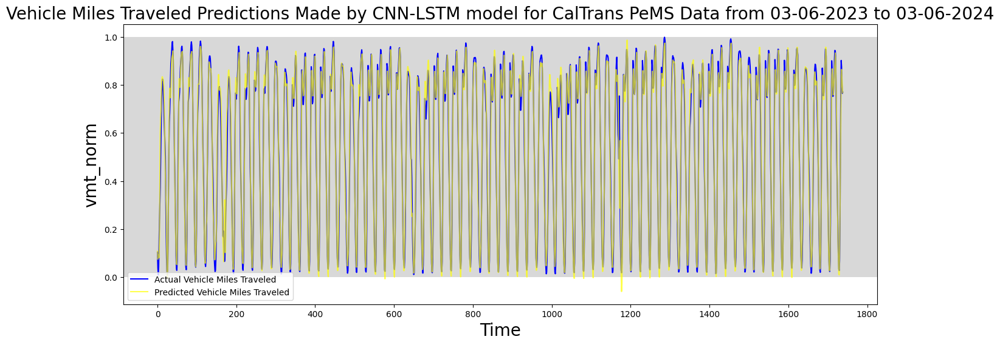

In [376]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_lstm_pred_test_v2, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature_norm, fontsize = 20)
plt.legend()
plt.show()

#### Training and Testing Data Combined.

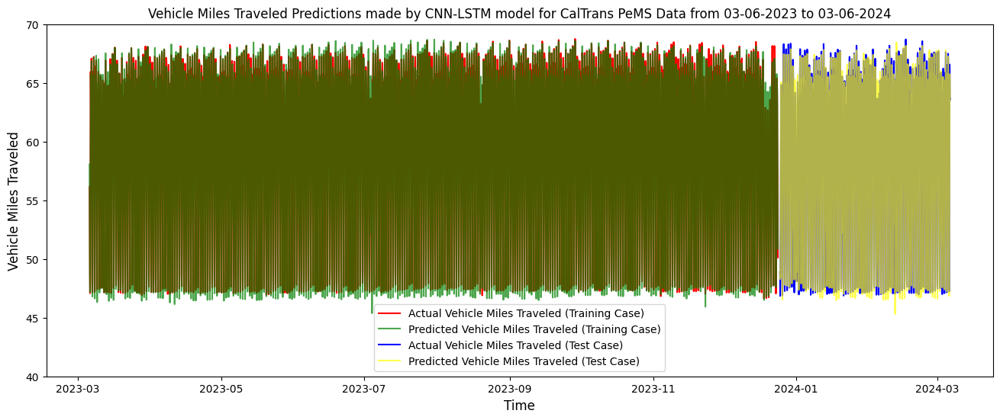

In [377]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_LSTM_train_v2['Date'], results_CNN_LSTM_train_v2['Actual'],
         color='red', label=f'Actual {feature} (Training Case)')
plt.plot(results_CNN_LSTM_train_v2['Date'],
         results_CNN_LSTM_train_v2['Predicted'], alpha=0.7, color='green',
         label=f'Predicted {feature} (Training Case)')
plt.plot(results_CNN_LSTM_test_v2['Date'], results_CNN_LSTM_test_v2['Actual'],
         color='blue', label=f'Actual {feature} (Test Case)')
plt.plot(results_CNN_LSTM_test_v2['Date'], results_CNN_LSTM_test_v2['Predicted'],
         alpha=0.7, color='yellow', label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-LSTM v2.

In [378]:
results_CNN_LSTM_v2 = [results_CNN_LSTM_train_v2, results_CNN_LSTM_test_v2]
results_CNN_LSTM_v2 = pd.concat(results_CNN_LSTM_v2)
display(results_CNN_LSTM_v2)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,58.056034
1,2023-03-06 01:00:00,54.239836,54.101921
2,2023-03-06 02:00:00,51.970794,50.932682
3,2023-03-06 03:00:00,49.701251,48.909801
4,2023-03-06 04:00:00,48.048558,47.875504
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.250061
1735,2024-03-06 08:00:00,65.973345,65.737991
1736,2024-03-06 09:00:00,64.305188,64.947357
1737,2024-03-06 10:00:00,63.536353,64.139336


### Plotting Residuals for Actual and Predicted Results for CNN-LSTM v2.

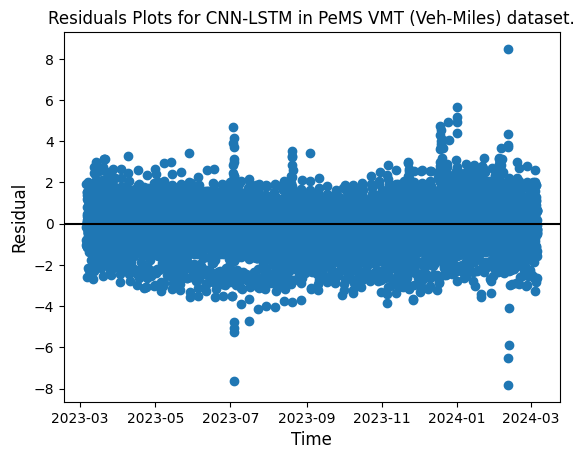

In [379]:
actual_arr_CNN_LSTM_v2 = np.array(results_CNN_LSTM_v2['Actual'])
predicted_arr_CNN_LSTM_v2 = np.array(results_CNN_LSTM_v2['Predicted'])
residuals_CNN_LSTM_v2 = predicted_arr_CNN_LSTM_v2 - actual_arr_CNN_LSTM_v2
plt.scatter(results_CNN_LSTM_v2['Date'], residuals_CNN_LSTM_v2)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

### Energy Consumption

In [380]:
measure_ann_energy(cnn_lstm_v2, X_test)

Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2607 seconds
  Estimated CPU Energy: 20.8599 Joules (20859909.0576 µJ)

No GPU available. GPU measurements skipped.


{'model_name': 'sequential_18',
 'cpu_inference_time_s': 0.26074886322021484,
 'estimated_cpu_energy_J': 20.859909057617188,
 'estimated_cpu_energy_uJ': 20859909.057617188,
 'gpu_inference_time_s': None,
 'estimated_gpu_energy_J': None,
 'estimated_gpu_energy_uJ': None,
 'snn_spike_energy_uJ': None}

## CNN-LSTM v3 Implementation
This implementation was taken from https://github.com/Pradnya1208/Time-series-forecasting-using-Deep-Learning/blob/main/deep_learning_for_time_series_forecasting.ipynb

### Spiking Activation Layer

In [381]:
@keras.saving.register_keras_serializable()
class SpikingActivationCell(tf.keras.layers.Layer):
    def __init__(self, activation='tanh', threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        super(SpikingActivationCell, self).__init__(**kwargs)
        self.activation = activation
        self.threshold = threshold
        self.dt = dt
        self.spiking_aware_training = spiking_aware_training
        self.state_size = 1  # State to store membrane potential

    def build(self, input_shape):
        self.membrane_potential = self.add_weight(
            name='membrane_potential',
            shape=(input_shape[-1],),
            initializer='zeros',
            trainable=False
        )
        super(SpikingActivationCell, self).build(input_shape)

    def call(self, inputs, states, training=None):
        prev_membrane_potential = states[0]

        # Apply activation function
        activated_input = tf.keras.activations.get(self.activation)(inputs)

        # Update membrane potential
        membrane_potential = prev_membrane_potential + activated_input * self.dt

        # Generate spikes based on threshold
        if training and self.spiking_aware_training:
            # Use a surrogate gradient during training
            # This is a common surrogate gradient (Heaviside step function with identity gradient)
            spikes = tf.where(membrane_potential >= self.threshold,
                              tf.ones_like(membrane_potential),
                              tf.zeros_like(membrane_potential))
            # Define the surrogate gradient
            @tf.custom_gradient
            def surrogate_spike(x):
                spike = tf.where(x >= self.threshold, tf.ones_like(x), tf.zeros_like(x))
                def grad(dy):
                    # Here we use an identity gradient for simplicity, you might use others
                    return dy
                return spike, grad
            spikes = surrogate_spike(membrane_potential)
        else:
            # Use standard spiking during inference/evaluation
            spikes = tf.cast(membrane_potential >= self.threshold, dtype=tf.float32)

        # Reset membrane potential after spike
        membrane_potential = membrane_potential - spikes * self.threshold

        # Return the spikes and the updated membrane potential as the new state
        return spikes, [membrane_potential]

@keras.saving.register_keras_serializable()
class SpikingActivationLayer(tf.keras.layers.RNN):
    def __init__(self, activation='tanh', threshold=1.0, dt=1.0, spiking_aware_training=False, **kwargs):
        cell = SpikingActivationCell(activation=activation, threshold=threshold,
                                     dt=dt, spiking_aware_training=spiking_aware_training)
        super(SpikingActivationLayer, self).__init__(cell, **kwargs)

    def call(self, inputs, initial_state=None, training=None, **kwargs):
        # Get the input shape
        input_shape = tf.shape(inputs)
        batch_size = input_shape[0]
        num_features = input_shape[-1]

        # Initialize the state if it's not provided
        if initial_state is None:
            # The initial state for the cell is a list of tensors. Since state_size is 1,
            # the initial state should be a list containing one tensor.
            initial_state = [tf.zeros((batch_size, num_features), dtype=tf.float32)]

        # Call the RNN with the correct initial state and training flag
        # The training flag from the layer's call method is passed to the cell's call method
        return super(SpikingActivationLayer, self).call(inputs,
                                                        initial_state=initial_state,
                                                        training=training,
                                                        **kwargs)

    # This method is usually called internally by Keras to determine the shape
    # of the output tensor. It should align with the arguments received in the
    # `call()` method. Based on the error, the argument `sequences_shape` should
    # be aligned with the `inputs` argument of `call()`.
    def compute_output_shape(self, input_shape):
        return input_shape

    # Override the build method to accept and ignore the sequences_shape argument
    # This is often not needed for RNN layers that handle variable length sequences,
    # but keeping it here for consistency with your original code structure.
    def build(self, input_shape):
        # Call the parent class's build method, passing only the input_shape
        super(SpikingActivationLayer, self).build(input_shape)


### Creating CNN-LSTM model Version 3.

In [382]:
# For this implementation, this will require a reshaping of the input shape.
# The input shape will be  [samples, subsequences = 2, timesteps = seq_len,
# features = 1].
X_train_v3 = X_train.reshape(X_train.shape[0], 1, seq_len, X_train.shape[2])
X_test_v3 = X_test.reshape(X_test.shape[0], 1, seq_len, X_test.shape[2])

In [383]:
cnn_lstm_v3 = Sequential()

# Reshape the input to have 3 dimensions within the TimeDistributed layer
cnn_lstm_v3.add(TimeDistributed(Conv1D(filters=64, kernel_size=1,
                                       activation='relu',
                                       input_shape=(None,
                                                    X_train_v3.shape[2],
                                                    X_train_v3.shape[3]))))
cnn_lstm_v3.add(TimeDistributed(MaxPooling1D(pool_size=2)))
cnn_lstm_v3.add(TimeDistributed(Flatten()))
cnn_lstm_v3.add(LSTM(50, activation='relu'))
cnn_lstm_v3.add(Dense(1))
cnn_lstm_v3.compile(loss='mse', optimizer='adam')
#cnn_lstm_v3.build(input_shape=(None,X_train_v3.shape[2], X_train_v3.shape[3]))
#cnn_lstm_v3.summary()

### Train CNN-LSTM Model V3.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.0348
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0040
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 0.0024
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.0020
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0017
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0015
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0015
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0014
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 0.0014
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 0.0012


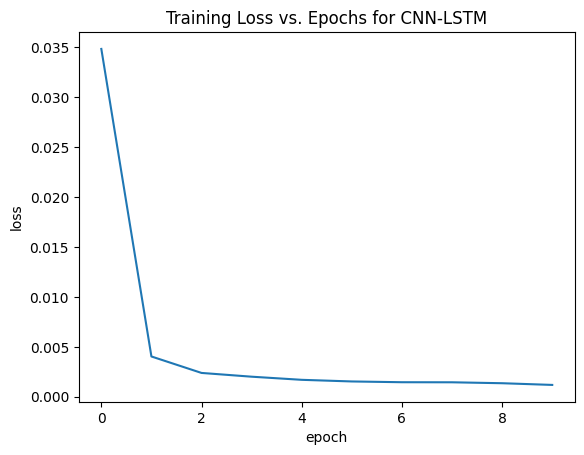

In [384]:
cnn_lstm_v3.compile(optimizer="adam",loss=loss)
cnn_lstm_v3_epochs = cnn_lstm_v3.fit(X_train_v3, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(cnn_lstm_v3_epochs, "CNN-LSTM")

### Evaluate CNN-LSTM V3 model using MAE, RMSE, and R^2.

In [385]:
print("CNN-LSTM Predictions for Training Set")
cnn_lstm_pred_train_v3 = cnn_lstm_v3.predict(X_train_v3)
print("CNN-LSTM Predictions for Testing Set")
cnn_lstm_pred_test_v3 = cnn_lstm_v3.predict(X_test_v3)
cnn_lstm_v3_mae = mean_absolute_error(y_test,cnn_lstm_pred_test_v3)
print("MAE of CNN-LSTM model = ",cnn_lstm_v3_mae)
cnn_lstm_v3_rmse =  mean_squared_error(y_test,cnn_lstm_pred_test_v3) ** 0.5
print("RMSE of CNN-LSTM model = ",cnn_lstm_v3_rmse)
cnn_lstm_v3_r2_score = r2_score(y_test, cnn_lstm_pred_test_v3)
print("R^2 Score of CNN-LSTM model = ",cnn_lstm_v3_r2_score)
cnn_lstm_v3_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_lstm_pred_test_v3)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_lstm_v3_mape_score))

CNN-LSTM Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
CNN-LSTM Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of CNN-LSTM model =  0.02784059061207787
RMSE of CNN-LSTM model =  0.03784632722038268
R^2 Score of CNN-LSTM model =  0.9860342928584483
MAPE Score of CNN-LSTM model = 14.294686003824278 %


In [386]:
perform_statistical_tests(y_test, cnn_lstm_pred_test_v3, "CNN-LSTM V3")


--- Statistical Tests for CNN-LSTM V3 ---
Paired t-test: t-statistic = -15.5098, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             421944.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


### Calculate 95% Confidence Intervals for CNN-LSTM V3 MAE and RMSE

In [387]:
cnn_lstm_v3_mae_ci_lower, cnn_lstm_v3_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test_v3.flatten(), mean_absolute_error)
print(f"CNN-LSTM V3 MAE 95% CI: [{cnn_lstm_v3_mae_ci_lower:.4f}, {cnn_lstm_v3_mae_ci_upper:.4f}]")

cnn_lstm_v3_rmse_ci_lower, cnn_lstm_v3_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_lstm_pred_test_v3.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-LSTM V3 RMSE 95% CI: [{cnn_lstm_v3_rmse_ci_lower:.4f}, {cnn_lstm_v3_rmse_ci_upper:.4f}]")

CNN-LSTM V3 MAE 95% CI: [0.0268, 0.0291]
CNN-LSTM V3 RMSE 95% CI: [0.0357, 0.0404]


### Reverse Transform Scaler to Convert to Real Values.

In [388]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_lstm_pred_inv_train_v3 = scaler.inverse_transform(cnn_lstm_pred_train_v3)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_lstm_pred_inv_test_v3 = scaler.inverse_transform(cnn_lstm_pred_test_v3)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_lstm_pred_inv_train_v3 = cnn_lstm_pred_inv_train_v3.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_lstm_pred_inv_test_v3 = cnn_lstm_pred_inv_test_v3.flatten()

### Showing Actual y and Predicted y values as Dataframes.

In [389]:
results_CNN_LSTM_train_v3 = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': cnn_lstm_pred_inv_train_v3})
results_CNN_LSTM_train_v3

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,57.443008
1,2023-03-06 01:00:00,54.239836,54.361713
2,2023-03-06 02:00:00,51.970794,51.972797
3,2023-03-06 03:00:00,49.701251,49.978436
4,2023-03-06 04:00:00,48.048558,48.135578
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,58.216377
7032,2023-12-24 01:00:00,56.957176,55.766499
7033,2023-12-24 02:00:00,54.922600,54.168961
7034,2023-12-24 03:00:00,52.233917,52.851524


In [390]:
# Now let's see our actual y and predicted y values as dataframes
results_CNN_LSTM_test_v3 = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': cnn_lstm_pred_inv_test_v3})
results_CNN_LSTM_test_v3

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,49.229378
1,2023-12-25 02:00:00,47.495000,48.202168
2,2023-12-25 03:00:00,46.850460,48.049488
3,2023-12-25 04:00:00,47.579286,48.173035
4,2023-12-25 05:00:00,49.760594,49.738567
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,66.018028
1735,2024-03-06 08:00:00,65.973345,66.073677
1736,2024-03-06 09:00:00,64.305188,65.268486
1737,2024-03-06 10:00:00,63.536353,65.053032


### Plotting Predictions for VHT/VMT/Q made by CNN-LSTM V3 Model.

#### Only Testing Data

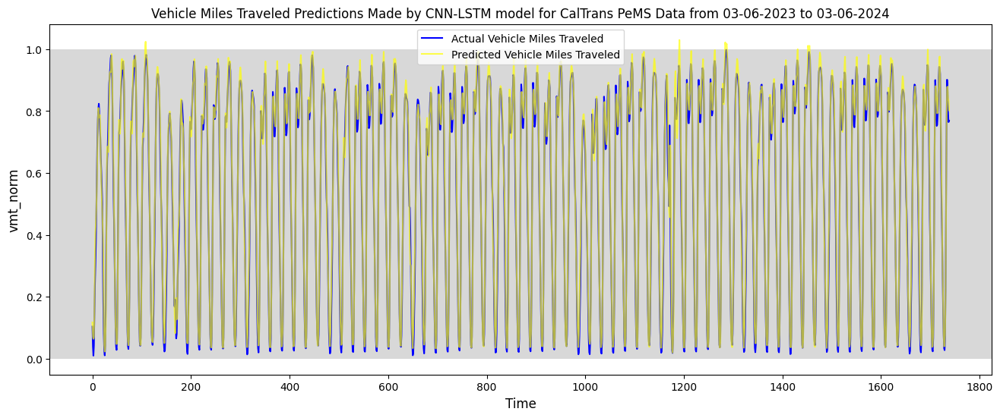

In [391]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_lstm_pred_test_v3, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature_norm, fontsize = 12)
plt.legend()
plt.show()

#### Testing and Training Data Combined.

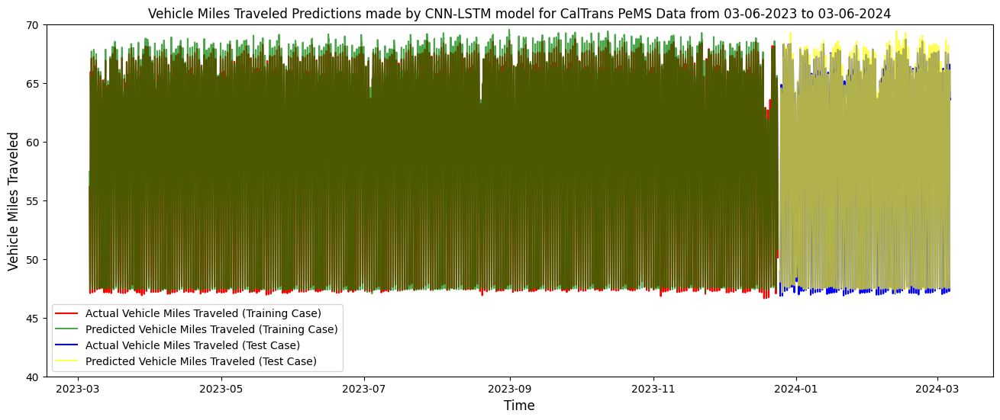

In [392]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_LSTM_train_v3['Date'], results_CNN_LSTM_train_v3['Actual'],
         color='red', label=f'Actual {feature} (Training Case)')
plt.plot(results_CNN_LSTM_train_v3['Date'],
         results_CNN_LSTM_train_v3['Predicted'], alpha=0.7, color='green',
         label=f'Predicted {feature} (Training Case)')
plt.plot(results_CNN_LSTM_test_v3['Date'], results_CNN_LSTM_test_v3['Actual'],
         color='blue', label=f'Actual {feature} (Test Case)')
plt.plot(results_CNN_LSTM_test_v3['Date'],
         results_CNN_LSTM_test_v3['Predicted'], alpha=0.7, color='yellow',
         label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-LSTM model for {1}"\
          .format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-LSTM v3.

In [393]:
results_CNN_LSTM_v3 = [results_CNN_LSTM_train_v3, results_CNN_LSTM_test_v3]
results_CNN_LSTM_v3 = pd.concat(results_CNN_LSTM_v3)
display(results_CNN_LSTM_v3)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,57.443008
1,2023-03-06 01:00:00,54.239836,54.361713
2,2023-03-06 02:00:00,51.970794,51.972797
3,2023-03-06 03:00:00,49.701251,49.978436
4,2023-03-06 04:00:00,48.048558,48.135578
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,66.018028
1735,2024-03-06 08:00:00,65.973345,66.073677
1736,2024-03-06 09:00:00,64.305188,65.268486
1737,2024-03-06 10:00:00,63.536353,65.053032


### Plotting Residuals for Actual and Predicted Results for CNN-LSTM v3.

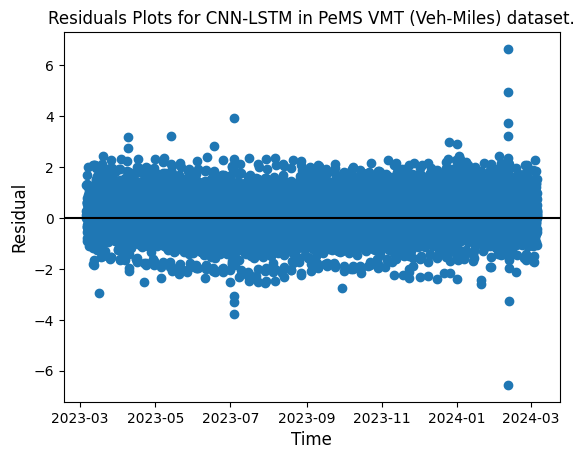

In [394]:
actual_arr_CNN_LSTM_v3 = np.array(results_CNN_LSTM_v3['Actual'])
predicted_arr_CNN_LSTM_v3 = np.array(results_CNN_LSTM_v3['Predicted'])
residuals_CNN_LSTM_v3 = predicted_arr_CNN_LSTM_v3 - actual_arr_CNN_LSTM_v3
plt.scatter(results_CNN_LSTM_v3['Date'], residuals_CNN_LSTM_v3)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for CNN-LSTM in PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

### Energy Consumption

In [395]:
measure_ann_energy(cnn_lstm_v3, X_test_v3)

Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2240 seconds
  Estimated CPU Energy: 17.9170 Joules (17916965.4846 µJ)

No GPU available. GPU measurements skipped.


{'model_name': 'sequential_19',
 'cpu_inference_time_s': 0.22396206855773926,
 'estimated_cpu_energy_J': 17.91696548461914,
 'estimated_cpu_energy_uJ': 17916965.48461914,
 'gpu_inference_time_s': None,
 'estimated_gpu_energy_J': None,
 'estimated_gpu_energy_uJ': None,
 'snn_spike_energy_uJ': None}

## LSTM-CNN implementation

### Create and Train LSTM-CNN Model

This implementation was taken from Aditi, & Nagda, Mayank & Eswaran, Poovammal. (2019). Image
 Classification using a Hybrid LSTM-CNN Deep Neural Network. In
ternational Journal of Engineering and Advanced Technology. 8. 1342 1348. 10.35940/ijeat.F8602.088619.

In [396]:
lstm_cnn_model = Sequential()
lstm_cnn_model.add(LSTM(32, activation="tanh",return_sequences=True,
                        input_shape=(seq_len, X_train.shape[2])))
lstm_cnn_model.add(Dropout(0.5))
lstm_cnn_model.add(Conv1D(filters=32, kernel_size=2, activation='relu'))
lstm_cnn_model.add(MaxPooling1D(pool_size=2))
# Flatten the output before the Dense layer to ensure a single output value
lstm_cnn_model.add(Flatten()) # This line is added
lstm_cnn_model.add(Dense(1))
lstm_cnn_model.compile(optimizer='adam', loss='mse')
lstm_cnn_model.summary()

Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm_9 (LSTM)                   │ (None, 20, 32)         │         4,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 20, 32)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_13 (Conv1D)              │ (None, 19, 32)         │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_12 (MaxPooling1D) │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 288)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 1)              │           289 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,721 (26.25 KB)

 Trainable params: 6,721 (26.25 KB)

 Non-trainable params: 0 (0.00 B)

### Train LSTM-CNN Model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 6s 12ms/step - loss: 0.0700
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 0.0170
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0132
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0117
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 0.0101
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0091
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0082
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0078
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 0.0070
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 0.0067


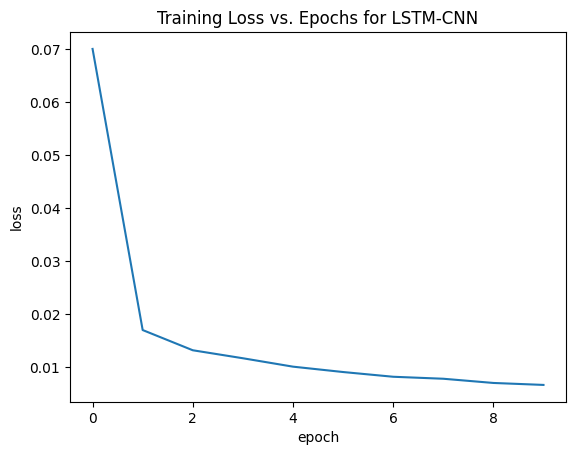

In [397]:
lstm_cnn_model.compile(optimizer="adam",loss=loss)
lstm_cnn_model_epochs = lstm_cnn_model.fit(X_train, y_train, epochs=epochs,
                                     batch_size=batch_size)
plot_training_loss(lstm_cnn_model_epochs, "LSTM-CNN")

### Evaluate LSTM-CNN model using MAE, RMSE, and MAPE.

In [398]:
print("LSTM-CNN Predictions for Training Set")
lstm_cnn_pred_train = lstm_cnn_model.predict(X_train)
print("LSTM-CNN Predictions for Testing Set")
lstm_cnn_pred_test = lstm_cnn_model.predict(X_test)
lstm_cnn_mae = mean_absolute_error(y_test,lstm_cnn_pred_test)
print("MAE of LSTM-CNN model = ",lstm_cnn_mae)
lstm_cnn_rmse =  mean_squared_error(y_test,lstm_cnn_pred_test) ** 0.5
print("RMSE of LSTM-CNN model = ",lstm_cnn_rmse)
lstm_cnn_r2_score = r2_score(y_test, lstm_cnn_pred_test)
print("R^2 Score of LSTM-CNN model = ",lstm_cnn_r2_score)
lstm_cnn_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         lstm_cnn_pred_test)
print("MAPE Score of LSTM-CNN model = {0} %".format(lstm_cnn_mape_score))

LSTM-CNN Predictions for Training Set
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
LSTM-CNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
MAE of LSTM-CNN model =  0.06864236310827512
RMSE of LSTM-CNN model =  0.08582194572668125
R^2 Score of LSTM-CNN model =  0.9281854962530132
MAPE Score of LSTM-CNN model = 34.80474723608316 %


In [399]:
perform_statistical_tests(y_test, lstm_cnn_pred_test, "LSTM-CNN")


--- Statistical Tests for LSTM-CNN ---
Paired t-test: t-statistic = 8.2296, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             530494.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


### Calculate 95% Confidence Intervals for LSTM-CNN MAE and RMSE

In [400]:
lstm_cnn_mae_ci_lower, lstm_cnn_mae_ci_upper = calculate_bootstrap_ci(y_test, lstm_cnn_pred_test.flatten(), mean_absolute_error)
print(f"LSTM-CNN MAE 95% CI: [{lstm_cnn_mae_ci_lower:.4f}, {lstm_cnn_mae_ci_upper:.4f}]")

lstm_cnn_rmse_ci_lower, lstm_cnn_rmse_ci_upper = calculate_bootstrap_ci(y_test, lstm_cnn_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"LSTM-CNN RMSE 95% CI: [{lstm_cnn_rmse_ci_lower:.4f}, {lstm_cnn_rmse_ci_upper:.4f}]")

LSTM-CNN MAE 95% CI: [0.0662, 0.0711]
LSTM-CNN RMSE 95% CI: [0.0828, 0.0887]


### Reverse Transform Scaler to Convert to Real Values.

In [401]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
lstm_cnn_pred_inv_train = scaler.inverse_transform(lstm_cnn_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
lstm_cnn_pred_inv_test = scaler.inverse_transform(lstm_cnn_pred_test)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
lstm_cnn_pred_inv_train = lstm_cnn_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
lstm_cnn_pred_inv_test = lstm_cnn_pred_inv_test.flatten()

### Showing Actual y and Predicted y values as Dataframes.

In [402]:
results_LSTM_CNN_train = pd.DataFrame({"Date":first_6169_index_dates,
                                 'Actual': y_train_inverse,
                                 'Predicted': lstm_cnn_pred_inv_train})
results_LSTM_CNN_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,56.875202
1,2023-03-06 01:00:00,54.239836,54.513039
2,2023-03-06 02:00:00,51.970794,51.430695
3,2023-03-06 03:00:00,49.701251,48.329815
4,2023-03-06 04:00:00,48.048558,46.384602
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,59.498207
7032,2023-12-24 01:00:00,56.957176,57.186886
7033,2023-12-24 02:00:00,54.922600,54.404652
7034,2023-12-24 03:00:00,52.233917,51.902386


In [403]:
# Now let's see our actual y and predicted y values as dataframes
results_LSTM_CNN_test = pd.DataFrame({"Date":last_6169_index_dates,
                                 'Actual': y_test_inverse,
                                 'Predicted': lstm_cnn_pred_inv_test})
results_LSTM_CNN_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,49.049904
1,2023-12-25 02:00:00,47.495000,48.558105
2,2023-12-25 03:00:00,46.850460,49.297245
3,2023-12-25 04:00:00,47.579286,51.424427
4,2023-12-25 05:00:00,49.760594,53.963539
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,64.005020
1735,2024-03-06 08:00:00,65.973345,64.583992
1736,2024-03-06 09:00:00,64.305188,64.489243
1737,2024-03-06 10:00:00,63.536353,64.532425


### Plotting Predictions for VHT/VMT/Q made by LSTM-CNN Model.

#### Only Testing Data.

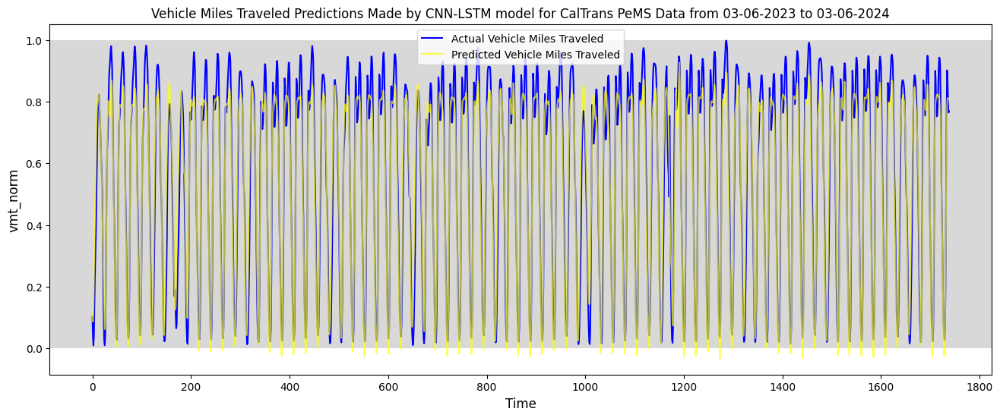

In [404]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(lstm_cnn_pred_test, alpha=0.7, color='yellow', \
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-LSTM model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature_norm, fontsize = 12)
plt.legend()
plt.show()

#### Testing and Training Data Combined.

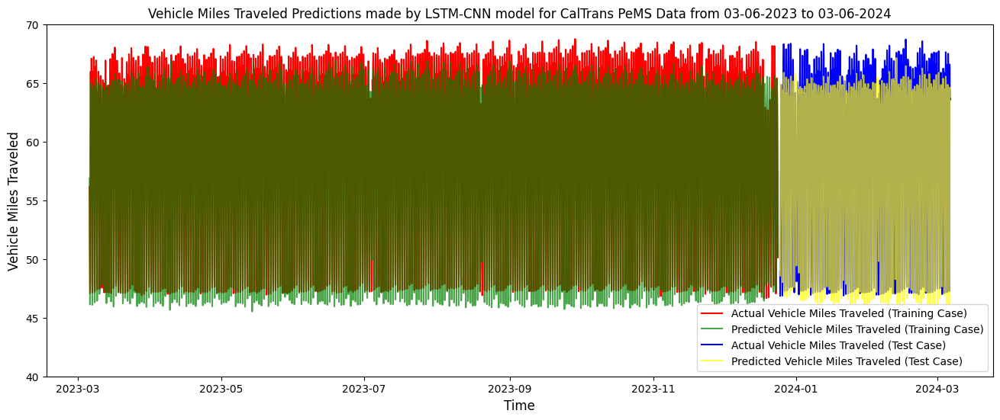

In [405]:
plt.figure(figsize=(16,6))
plt.plot(results_LSTM_CNN_train['Date'], results_LSTM_CNN_train['Actual'], color='red',
         label=f'Actual {feature} (Training Case)')
plt.plot(results_LSTM_CNN_train['Date'],  results_LSTM_CNN_train['Predicted'], alpha=0.7,
         color='green', label=f'Predicted {feature} (Training Case)')
plt.plot(results_LSTM_CNN_test['Date'], results_LSTM_CNN_test['Actual'], color='blue',
         label=f'Actual {feature} (Test Case)')
plt.plot(results_LSTM_CNN_test['Date'], results_LSTM_CNN_test['Predicted'], alpha=0.7, color='yellow',
         label=f'Predicted {feature} (Test Case)')
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by LSTM-CNN model for {1}".
          format(feature, title_name))
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel(feature, fontsize = 12)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for LSTM-CNN.

In [406]:
results_LSTM_CNN = [results_CNN_LSTM_train, results_CNN_LSTM_test]
results_LSTM_CNN = pd.concat(results_LSTM_CNN)
display(results_LSTM_CNN)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,59.217903
1,2023-03-06 01:00:00,54.239836,57.310204
2,2023-03-06 02:00:00,51.970794,54.316738
3,2023-03-06 03:00:00,49.701251,51.228683
4,2023-03-06 04:00:00,48.048558,49.021488
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,64.022789
1735,2024-03-06 08:00:00,65.973345,64.160957
1736,2024-03-06 09:00:00,64.305188,63.975204
1737,2024-03-06 10:00:00,63.536353,64.062340


### Plotting Residuals for Actual and Predicted Results for LSTM-CNN.

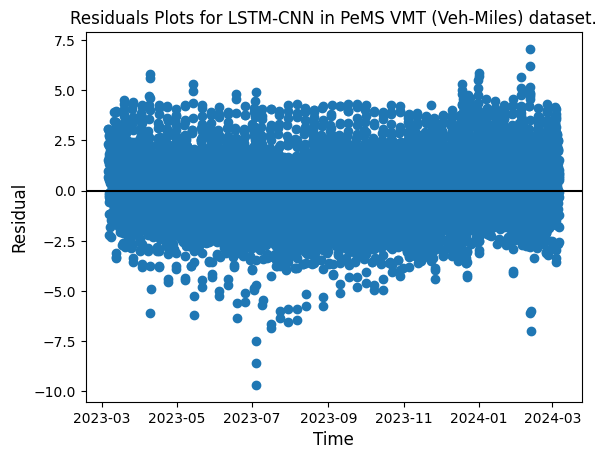

In [407]:
actual_arr_LSTM_CNN = np.array(results_LSTM_CNN['Actual'])
predicted_arr_LSTM_CNN = np.array(results_LSTM_CNN['Predicted'])
residuals_LSTM_CNN = predicted_arr_LSTM_CNN - actual_arr_LSTM_CNN
plt.scatter(results_LSTM_CNN['Date'], residuals_LSTM_CNN)
plt.axhline(y=0, color = 'black')
plt.title("Residuals Plots for LSTM-CNN in PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 12)
plt.ylabel("Residual", fontsize = 12)
plt.show()

## CNN-GRU model

### Create CNN-GRU Model.

In [408]:
cnn_gru_model = Sequential()

cnn_gru_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_gru_model.add(MaxPooling1D(pool_size=2))

cnn_gru_model.add(Conv1D(filters=filter, kernel_size=kernel, activation=activation,
                         input_shape=(seq_len, X_train.shape[2])))
cnn_gru_model.add(MaxPooling1D(pool_size=2))

#cnn_gru_model.add(Conv1D(filters=60, kernel_size=2, activation='tanh',
#input_shape=(seq_len, X_train.shape[2])))
#cnn_gru_model.add(MaxPooling1D(pool_size=2))

#cnn_gru_model.add(GRU(60,activation="tanh",return_sequences=True,
#input_shape=(X_train.shape[1],1)))
#cnn_gru_model.add(Dropout(0.5))

#cnn_gru_model.add(GRU(64,activation="tanh",return_sequences=True))
#cnn_gru_model.add(Dropout(0.8))

cnn_gru_model.add(GRU(64,activation=activation, return_sequences=False))
cnn_gru_model.add(Dropout(0.8))

cnn_gru_model.add(Dense(1))
cnn_gru_model.compile(optimizer='adam', loss='mse')
cnn_gru_model.summary()

Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_14 (Conv1D)              │ (None, 18, 32)         │           128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_13 (MaxPooling1D) │ (None, 9, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_15 (Conv1D)              │ (None, 7, 32)          │         3,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_14 (MaxPooling1D) │ (None, 3, 32)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru_4 (GRU)                     │ (None, 64)             │        18,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,113 (86.38 KB)

 Trainable params: 22,113 (86.38 KB)

 Non-trainable params: 0 (0.00 B)

### Train CNN-GRU Model.

Epoch 1/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 0.0849
Epoch 2/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0380
Epoch 3/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0298
Epoch 4/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0244
Epoch 5/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0198
Epoch 6/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0179
Epoch 7/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 0.0157
Epoch 8/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 8ms/step - loss: 0.0145
Epoch 9/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0141
Epoch 10/10
220/220 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step - loss: 0.0133


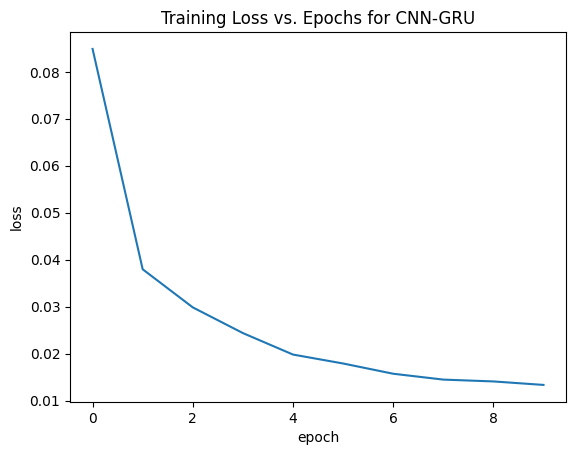

In [409]:
cnn_gru_model.compile(optimizer="adam",loss=loss)
cnn_gru_epochs = cnn_gru_model.fit(X_train, y_train, epochs=epochs,
                                   batch_size=batch_size)
plot_training_loss(cnn_gru_epochs, "CNN-GRU")

### Evaluate CNN-GRU model using MAE, RMSE, and R^2.

In [410]:
cnn_gru_pred_train = cnn_gru_model.predict(X_train)
print("RNN Predictions for Testing Set")
cnn_gru_pred_test = cnn_gru_model.predict(X_test)
cnn_gru_mae = mean_absolute_error(y_test,cnn_gru_pred_test)
print("MAE of CNN-GRU model = ",cnn_gru_mae)
cnn_gru_rmse =  mean_squared_error(y_test,cnn_gru_pred_test) ** 0.5
print("RMSE of CNN-GRU model = ",cnn_gru_rmse)
cnn_gru_r2_score = r2_score(y_test, cnn_gru_pred_test)
print("R^2 Score of CNN-GRU model = ",cnn_gru_r2_score)
cnn_gru_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                        cnn_gru_pred_test)
print("MAPE Score of CNN-GRU model = {0} %".format(cnn_gru_mape_score))
cnn_gru_mape_score = 100*mean_absolute_percentage_error(y_test,
                                                         cnn_gru_pred_test)
print("MAPE Score of CNN-LSTM model = {0} %".format(cnn_gru_mape_score))

220/220 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step
RNN Predictions for Testing Set
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
MAE of CNN-GRU model =  0.0783971081859341
RMSE of CNN-GRU model =  0.09807364811434104
R^2 Score of CNN-GRU model =  0.9062178658562132
MAPE Score of CNN-GRU model = 68.83039062936483 %
MAPE Score of CNN-LSTM model = 68.83039062936483 %


In [411]:
perform_statistical_tests(y_test, cnn_gru_pred_test, "CNN-GRU")


--- Statistical Tests for CNN-GRU ---
Paired t-test: t-statistic = -18.8740, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)
Wilcoxon Signed-Rank Test: statistic =             413926.0000, p-value = 0.0000
(Result is statistically significant: there is a significant difference between actual and predicted values)


### Calculate 95% Confidence Intervals for CNN-GRU MAE and RMSE

In [412]:
cnn_gru_mae_ci_lower, cnn_gru_mae_ci_upper = calculate_bootstrap_ci(y_test, cnn_gru_pred_test.flatten(), mean_absolute_error)
print(f"CNN-GRU MAE 95% CI: [{cnn_gru_mae_ci_lower:.4f}, {cnn_gru_mae_ci_upper:.4f}]")

cnn_gru_rmse_ci_lower, cnn_gru_rmse_ci_upper = calculate_bootstrap_ci(y_test, cnn_gru_pred_test.flatten(), lambda yt, yp: mean_squared_error(yt, yp)**0.5)
print(f"CNN-GRU RMSE 95% CI: [{cnn_gru_rmse_ci_lower:.4f}, {cnn_gru_rmse_ci_upper:.4f}]")

CNN-GRU MAE 95% CI: [0.0758, 0.0812]
CNN-GRU RMSE 95% CI: [0.0943, 0.1016]


### Reverse transform scaler to convert to real values.

In [413]:
y_train_inverse = scaler.inverse_transform(y_train.reshape(-1, 1))
cnn_gru_pred_inv_train = scaler.inverse_transform(cnn_gru_pred_train)
y_test_inverse = scaler.inverse_transform(y_test.reshape(-1, 1))
cnn_gru_pred_inv_test = scaler.inverse_transform(cnn_gru_pred_test)

# Get values after inverse transformation.
y_train_inverse = y_train_inverse.flatten()
cnn_gru_pred_inv_train = cnn_gru_pred_inv_train.flatten()
y_test_inverse = y_test_inverse.flatten()
cnn_gru_pred_inv_test = cnn_gru_pred_inv_test.flatten()

### Showing Actual and Predicted y values as Dataframes.

In [414]:
results_CNN_GRU_train = pd.DataFrame({"Date":first_6169_index_dates,
                                'Actual': y_train_inverse,
                                'Predicted': cnn_gru_pred_inv_train})
results_CNN_GRU_train

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,59.156456
1,2023-03-06 01:00:00,54.239836,57.129604
2,2023-03-06 02:00:00,51.970794,54.272007
3,2023-03-06 03:00:00,49.701251,51.845112
4,2023-03-06 04:00:00,48.048558,49.700783
...,...,...,...
7031,2023-12-24 00:00:00,57.996638,61.195000
7032,2023-12-24 01:00:00,56.957176,58.829750
7033,2023-12-24 02:00:00,54.922600,56.346073
7034,2023-12-24 03:00:00,52.233917,54.078918


In [415]:
results_CNN_GRU_test = pd.DataFrame({"Date":last_6169_index_dates,
                                'Actual': y_test_inverse,
                                'Predicted': cnn_gru_pred_inv_test})
results_CNN_GRU_test

,Date,Actual,Predicted
0,2023-12-25 01:00:00,48.928536,52.830868
1,2023-12-25 02:00:00,47.495000,51.952595
2,2023-12-25 03:00:00,46.850460,51.858528
3,2023-12-25 04:00:00,47.579286,52.675827
4,2023-12-25 05:00:00,49.760594,54.217632
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.468117
1735,2024-03-06 08:00:00,65.973345,65.775307
1736,2024-03-06 09:00:00,64.305188,65.017868
1737,2024-03-06 10:00:00,63.536353,64.935715


### Plotting Predictions for VMT/VHT/Q made by CNN-GRU Model.

#### Only Testing Data

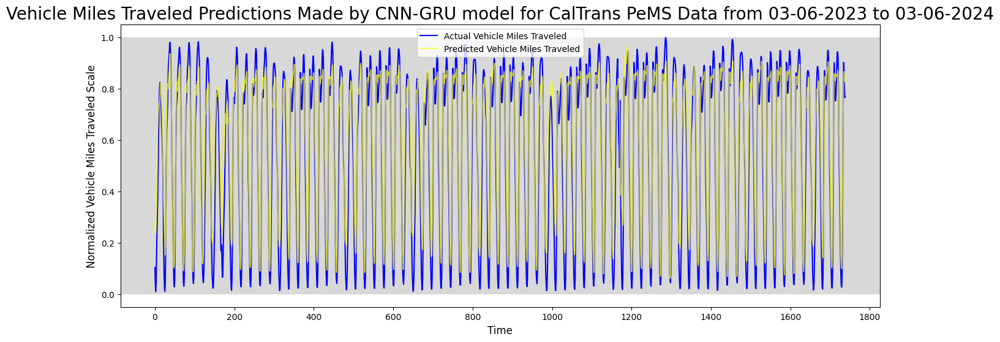

In [416]:
plt.figure(figsize=(16,6))
plt.plot(y_test, color='blue',label='Actual {0}'.format(feature))
plt.plot(cnn_gru_pred_test, alpha=0.7, color='yellow',
         label='Predicted {0}'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions Made by CNN-GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 12)
plt.ylabel('Normalized {0} Scale'.format(feature), fontsize = 12)
plt.legend()
plt.show()

#### Testing and Training Data Combined.

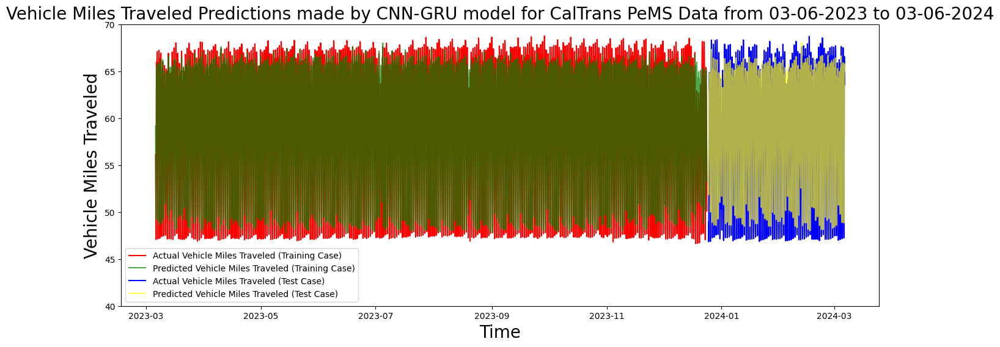

In [417]:
plt.figure(figsize=(16,6))
plt.plot(results_CNN_GRU_train['Date'], results_CNN_GRU_train['Actual'],
         color='red', label='Actual {0} (Training Case)'.format(feature))
plt.plot(results_CNN_GRU_train['Date'], results_CNN_GRU_train['Predicted'],
         alpha=0.7, color='green',
         label='Predicted {0} (Training Case)'.format(feature))
plt.plot(results_CNN_GRU_test['Date'], results_CNN_GRU_test['Actual'],
         color='blue', label='Actual {0} (Test Case)'.format(feature))
plt.plot(results_CNN_GRU_test['Date'], results_CNN_GRU_test['Predicted'],
         alpha=0.7, color='yellow',
         label='Predicted {0} (Test Case)'.format(feature))
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.title("{0} Predictions made by CNN-GRU model for {1}".
          format(feature, title_name), fontsize = 20)
plt.locator_params(axis='x', nbins=10)
plt.locator_params(axis='y', nbins=10)
plt.ylim([40, 70])
plt.xlabel('Time', fontsize = 20)
plt.ylabel(feature, fontsize = 20)
plt.legend()
plt.show()

### Combine Actual and Predicted Results for Train and Test Cases for CNN-GRU.

In [418]:
results_CNN_GRU = [results_CNN_GRU_train, results_CNN_GRU_test]
results_CNN_GRU = pd.concat(results_CNN_GRU)
display(results_CNN_GRU)

,Date,Actual,Predicted
0,2023-03-06 00:00:00,56.133026,59.156456
1,2023-03-06 01:00:00,54.239836,57.129604
2,2023-03-06 02:00:00,51.970794,54.272007
3,2023-03-06 03:00:00,49.701251,51.845112
4,2023-03-06 04:00:00,48.048558,49.700783
...,...,...,...
1734,2024-03-06 07:00:00,66.569088,65.468117
1735,2024-03-06 08:00:00,65.973345,65.775307
1736,2024-03-06 09:00:00,64.305188,65.017868
1737,2024-03-06 10:00:00,63.536353,64.935715


### Plotting Residuals for Actual and Predicted Results for CNN-GRU.

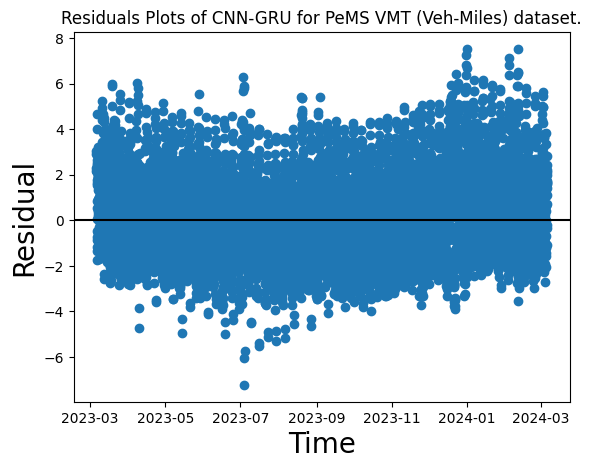

In [419]:
actual_arr_CNN_GRU = np.array(results_CNN_GRU['Actual'])
predicted_arr_CNN_GRU = np.array(results_CNN_GRU['Predicted'])
residuals_CNN_GRU = predicted_arr_CNN_GRU - actual_arr_CNN_GRU
plt.scatter(results_CNN_GRU['Date'], residuals_CNN_GRU)
plt.title("Residuals Plots of CNN-GRU for PeMS {} dataset.".format(feature_field))
#plt.locator_params(axis='x', nbins=10)
#plt.locator_params(axis='y', nbins=10)
#plt.ylim([40, 70])
plt.xlabel("Time", fontsize = 20)
plt.ylabel("Residual", fontsize = 20)
plt.axhline(y=0, color = 'black')
plt.show()

From the residual plots for the CNN-GRU model, it can be concluded that the CNN-GRU model is a good fit.

### Energy Consumption

In [420]:
start_time = time.time()
# Run inference or training with your rnn_model here
end_time = time.time()

execution_time = end_time - start_time
print("Model execution time:", execution_time, "seconds")
measure_ann_energy(cnn_gru_model, X_test)

Model execution time: 5.6743621826171875e-05 seconds
Measuring inference time and estimating energy on CPU (for ANN)...
  CPU Inference Time: 0.2152 seconds
  Estimated CPU Energy: 17.2164 Joules (17216415.4053 µJ)

No GPU available. GPU measurements skipped.


{'model_name': 'sequential_21',
 'cpu_inference_time_s': 0.21520519256591797,
 'estimated_cpu_energy_J': 17.216415405273438,
 'estimated_cpu_energy_uJ': 17216415.405273438,
 'gpu_inference_time_s': None,
 'estimated_gpu_energy_J': None,
 'estimated_gpu_energy_uJ': None,
 'snn_spike_energy_uJ': None}

# Compare Predictions

* For both models, we see that the predicted values are close to the actual values, which means that the models perform well in predicting the sequence.

## Training

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_train, c="black", linewidth=3, label="Original values")
plt.plot(lstm_pred_train, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions_train, alpha=0.5, c="yellow",
         linewidth=3, label="RNN predictions")
plt.plot(gru_pred_train, alpha=0.5, c="orange", linewidth=3,
         label="GRU predictions")
plt.plot(cnn_pred_train, alpha=0.5, c="blue", linewidth=3,
         label="CNN predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour')
plt.ylabel('Q')
plt.title("Predictions(RNN, LSTM, GRU, & CNN) vs Actual Data (Training)",
          fontsize=20)
plt.show()

## Testing

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_test, c="black", linewidth=3, label="Original values")
plt.plot(lstm_pred_test, c="red", linewidth=3, label="LSTM predictions")
plt.plot(rnn_predictions_test, alpha=0.5, c="yellow",
         linewidth=3, label="RNN predictions")
plt.plot(gru_pred_test, alpha=0.5, c="orange", linewidth=3,
         label="GRU predictions")
#plt.plot(cnn_pred_test, alpha=0.5, c="blue", linewidth=3,
#         label="CNN predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour', fontsize = 20)
#plt.ylabel('Q', fontsize = 20)
plt.ylabel('VHT', fontsize = 20)
#plt.title("Predictions(RNN, LSTM, GRU, & CNN) vs Actual Data (Test)",
#          fontsize=20)
plt.title("Predictions(RNN, LSTM, GRU) vs Actual Data (Test)",
          fontsize=20)
plt.show()

## Training (Hybrid Models)

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_train, c="black", linewidth=3, label="Original values")
plt.plot(cnn_rnn_pred_train, c="red", linewidth=3, label="CNN-RNN predictions")
plt.plot(cnn_gru_pred_train, alpha=0.5, c="yellow", linewidth=3,
         label="CNN-GRU predictions")
plt.plot(cnn_lstm_pred_train, alpha=0.5, c="blue", linewidth=3,
         label="CNN-LSTM predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour')
plt.ylabel('Q')
plt.title("Predictions (CNN-RNN, CNN-LSTM, CNN-GRU) vs Actual Data (Training)",
          fontsize=20)
plt.show()

## Testing (Hybrid Models)

In [ ]:
plt.figure(figsize=(15,8))

plt.plot(y_test, c="black", linewidth=3, label="Original values")
plt.plot(cnn_rnn_pred_test, c="red", linewidth=3, label="CNN-RNN predictions")
plt.plot(cnn_gru_pred_test, alpha=0.5, c="yellow", linewidth=3, label="CNN-GRU predictions")
plt.plot(cnn_lstm_pred_test, alpha=0.5, c="blue", linewidth=3, label="CNN-LSTM predictions")
plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
plt.legend()
plt.xlabel('Hour',fontsize=20)
plt.ylabel('Q', fontsize=20)
plt.title("Predictions(CNN-RNN, CNN-LSTM, CNN-GRU) vs Actual Data (Test)",
          fontsize=20)
plt.show()

## Energy Efficiency Comparison

In [ ]:
def plot_energy_results(all_results):
    print(f"all_results: {all_results}")
    cpu_times = [res['cpu_inference_time_s'] for res in all_results]
    estimated_cpu_energy_uJ = [res['estimated_cpu_energy_uJ']
                               for res in all_results]
    estimated_gpu_energy_uJ = [res['estimated_gpu_energy_uJ']
                               if res['estimated_gpu_energy_uJ'] is not None
                               else 0 for res in all_results]
    snn_spike_energy_uJ = [res['snn_spike_energy_uJ']
                           if res['snn_spike_energy_uJ'] is not None
                           else 0 for res in all_results]
    model_names = [res['model_name'] for res in all_results]

    x = np.arange(len(model_names))
    width = 0.2
    fig, ax1 = plt.subplots(figsize=(13, 6))

    # Plot estimated CPU Energy
    ax1.bar(x - width, estimated_cpu_energy_uJ, width,
            label='Estimated CPU Energy (µJ)', color='skyblue')
    # Plot estimated GPU Energy
    ax1.bar(x, estimated_gpu_energy_uJ, width,
            label='Estimated GPU Energy (µJ) (if available)', color='lightcoral')
    # Plot SNN Spike Energy
    ax1.bar(x + width, snn_spike_energy_uJ, width,
            label='Estimated SNN Spike Energy (µJ)', color='lightgreen')
    ax1.set_ylabel('Estimated Energy (µJ)', fontsize=14, fontweight='bold')
    ax1.set_xlabel('Model', fontsize=14, fontweight='bold')
    ax1.set_title('Estimated Energy Consumption per Model', fontsize=20,
                  fontweight = 'bold')
    ax1.set_xticks(x)
    ax1.set_xticklabels(model_names, rotation=45, ha="right", fontsize=12)
    ax1.tick_params(axis='y', labelsize=12)
    ax1.legend(loc='upper left', fontsize=10)
    ax1.grid(axis='y', linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

In [ ]:
all_models_energy_results = [
    rnn_energy_results,
    snn_energy_results,
    spiking_LIF_energy_results,
    spiking_LIFv3_energy_results,
    lstm_energy_results,
    cnn_model_energy_results,
    gru_energy_results
]

# Re-run energy calculation and store results for hybrid models
cnn_lstm_energy_results = measure_ann_energy(cnn_lstm_model, X_test, model_name_str='CNN-LSTM Model')
all_models_energy_results.append(cnn_lstm_energy_results)

cnn_lstm_v2_energy_results = measure_ann_energy(cnn_lstm_v2, X_test, model_name_str='CNN-LSTM V2 Model')
all_models_energy_results.append(cnn_lstm_v2_energy_results)

cnn_lstm_v3_energy_results = measure_ann_energy(cnn_lstm_v3, X_test_v3, model_name_str='CNN-LSTM V3 Model')
all_models_energy_results.append(cnn_lstm_v3_energy_results)

cnn_rnn_energy_results = measure_ann_energy(cnn_rnn_model, X_test, model_name_str='CNN-RNN Model')
all_models_energy_results.append(cnn_rnn_energy_results)

cnn_gru_energy_results = measure_ann_energy(cnn_gru_model, X_test, model_name_str='CNN-GRU Model')
all_models_energy_results.append(cnn_gru_energy_results)

lstm_cnn_energy_results = measure_ann_energy(lstm_cnn_model, X_test, model_name_str='LSTM-CNN Model')
all_models_energy_results.append(lstm_cnn_energy_results)

plot_energy_results(all_models_energy_results)

## Applying Diebold-Mariano Test to Model Predictions

In [ ]:
print("\n--- Diebold-Mariano Test Results ---")

models = {
    "RNN": rnn_predictions_test.flatten(),
    "LSTM": lstm_pred_test.flatten(),
    "GRU": gru_pred_test.flatten(),
    "CNN": cnn_pred_test.flatten(),
    "Rate-Based SNN": snn_pred_test.flatten(),
    "LIF SNN": snn_LIF_pred_test.flatten(),
    "LIF SNN V3": spiking_LIFv3_model_pred_test.flatten(),
    "CNN-RNN": cnn_rnn_pred_test.flatten(),
    "CNN-LSTM": cnn_lstm_pred_test.flatten(),
    "CNN-LSTM V2": cnn_lstm_pred_test_v2.flatten(),
    "CNN-LSTM V3": cnn_lstm_pred_test_v3.flatten(),
    "LSTM-CNN": lstm_cnn_pred_test.flatten(),
    "CNN-GRU": cnn_gru_pred_test.flatten()
}

model_names = list(models.keys())

# Compare each model against every other model
for i in range(len(model_names)):
    for j in range(i + 1, len(model_names)):
        name1 = model_names[i]
        name2 = model_names[j]
        preds1 = models[name1]
        preds2 = models[name2]

        if len(y_test) != len(preds1) or len(y_test) != len(preds2):
            print(f"Skipping DM test for {name1} vs {name2} due to length mismatch.\n")
            continue

        try:
            dm_stat_mae, p_value_mae = diebold_mariano_mae(y_test, preds1, preds2)
            dm_stat_mse, p_value_mse = diebold_mariano_mse(y_test, preds1, preds2)

            print(f"Comparing {name1} vs {name2}:")
            print(f"DM Statistic (MAE loss): {dm_stat_mae:.4f}, p-value: {p_value_mae:.4f}")
            if p_value_mae < 0.05:
                print(f"(Significant difference: {name1} and {name2} have different predictive accuracy based on MAE loss)")
            else:
                print(f"(No significant difference: {name1} and {name2} have similar predictive accuracy based on MAE loss)")

            print(f"DM Statistic (MSE loss): {dm_stat_mse:.4f}, p-value: {p_value_mse:.4f}")
            if p_value_mse < 0.05:
                print(f"(Significant difference: {name1} and {name2} have different predictive accuracy based on MSE loss)")
            else:
                print(f"(No significant difference: {name1} and {name2} have similar predictive accuracy based on MSE loss)\n")

        except Exception as e:
            print(f"Error performing DM test for {name1} vs {name2}: {e}\n")


# Forecasting Future Data for all models

## Essential Functions.

In [ ]:
# this section for unknown future.
future=20
#future=seq_len
forecast_RNN = []
forecast_LSTM = []
forecast_GRU = []
forecast_CNN = []
forecast_CNN_RNN = []
forecast_CNN_LSTM = []
forecast_CNN_GRU = []
Xin = X_test[:,:,:]
Xin

In [ ]:
def insert_end(Xin, new_input, timestep):
    for i in range(timestep-1):
        Xin[:,i,:] = Xin[:,i+1,:]
    Xin[:,timestep-1,:] = new_input
    return Xin

def forecast_data(Xin, model_type, forecast, future_num):
    time=[]
    data_pts = 24*future_num
    for j in range(data_pts):
      out = model_type.predict(Xin, batch_size=1000)
      forecast.append(out[j, 0])
      Xin = insert_end(Xin, out[j, 0], future_num)
      time_current = pd.to_datetime(df_norm.index[-1])+timedelta(hours=j)
      if (j % 100 == 0):
        print("j = {0}".format(j))
        print("forecast: {0}".format(forecast))
        print("time_current: ",  time_current)
      time.append(time_current)


    forcasted_output=np.asanyarray(forecast)
    forcasted_output=forcasted_output.reshape(-1,1)
    forcasted_output = scaler.inverse_transform(forcasted_output)
    forcasted_output = pd.DataFrame(forcasted_output)
    date = pd.DataFrame(time)
    forecast_result = pd.concat([date, forcasted_output],axis=1)
    forecast_result.columns = "Date","Forecasted"

    return forecast_result

In [ ]:
# Plotting Predictions for VMT/VHT/Q for each model.
def plot_forecast(forecast_set, model_name, mode, min=30, max=70):
    plt.figure(figsize=(16,6))
    plt.plot(forecast_set['Date'], forecast_set['Forecasted'], alpha=0.7,
             color='teal', label='Forecasted {0}'.format(feature))
    plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
    plt.title('{0} Forecast for {1} using {2}'.
              format(feature_field, mode, model_name), fontsize = 15)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.ylim([min, max])
    plt.xlabel('Time', fontsize = 15)
    #plt.ylabel(feature_field, fontsize = 15)
    plt.ylabel('Normalized {0} Scale'.format(feature_field), fontsize = 15)
    plt.rc('xtick', labelsize=15)
    plt.rc('ytick', labelsize=15)
    plt.legend()
    plt.show()

In [ ]:
# Plotting Predictions for VMT/VHT/Q for Training, Testing, and Future Data.
def plot_with_forecast(train_set, test_set, forecast_set, model_name, mode,
                       min=30, max=70):
    plt.figure(figsize=(16,6))
    plt.plot(train_set['Date'], train_set['Actual'], color='red',
             label='Actual {0} (Training Case)'.format(feature))
    plt.plot(train_set['Date'], train_set['Predicted'], alpha=0.7,
             color='green',
             label='Predicted {0} (Training Case)'.format(feature))
    plt.plot(test_set['Date'], test_set['Actual'], color='blue',
            label='Actual {0} (Test Case)'.format(feature))
    plt.plot(test_set['Date'], test_set['Predicted'], alpha=0.7, color='yellow',
             label='Predicted {0} (Test Case)'.format(feature))
    plt.plot(forecast_set['Date'], forecast_set['Forecasted'], alpha=0.7,
             color='teal', label='Forecasted {0}'.format(feature))
    plt.axhspan(0, 1, facecolor='gray', alpha=0.3)
    plt.title("{0} Predictions and Forecasts made by {1} model for {2}".
              format(feature_field, model_name, title_name), fontsize=15)
    plt.locator_params(axis='x', nbins=10)
    plt.locator_params(axis='y', nbins=10)
    plt.rc('xtick', labelsize=10)
    plt.rc('ytick', labelsize=10)
    plt.ylim([min, max])
    plt.xlabel('Time', fontsize = 15)
    plt.ylabel('Normalized {0} Scale'.format(feature_field), fontsize = 15)
    plt.legend()
    plt.show()

## Forecasting Future Data for RNN.

In [ ]:
forecast_result_rnn = forecast_data(Xin, rnn_model, forecast_RNN, future)

In [ ]:
forecast_result_rnn

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_RNN_train, results_RNN_test, forecast_result_rnn,
                   'Simple RNN', title_name)

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_rnn, 'Simple RNN', title_name)

## Forecasting Future Data for LSTM.

In [ ]:
forecast_result_lstm = forecast_data(Xin, lstm_model, forecast_LSTM, future)

In [ ]:
forecast_result_lstm

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_LSTM_train, results_LSTM_test, forecast_result_lstm,
                   'LSTM', title_name, min=40, max=70)

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_lstm, 'LSTM', title_name, min=60, max=65)

## Forecasting Future Data for GRU.

In [ ]:
forecast_result_gru = forecast_data(Xin, gru_model, forecast_GRU, future)

In [ ]:
forecast_result_gru

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_GRU_train, results_GRU_test, forecast_result_gru,
                   'GRU', title_name)

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_gru, 'GRU', title_name)

## Forecasting Future Data for CNN.

In [ ]:
forecast_result_cnn = forecast_data(Xin, cnn_model, forecast_CNN, future)

In [ ]:
forecast_result_cnn

In [ ]:
# Plot Forecast combined with Training and Testing Data.
plot_with_forecast(results_CNN_train, results_CNN_test, forecast_result_cnn,
                   'CNN', title_name)

In [ ]:
# Only Forecast Data for closer look.
plot_forecast(forecast_result_cnn, 'CNN', title_name)

## Forecasting Future Data for CNN-RNN.

In [ ]:
forecast_result_cnn_rnn = forecast_data(Xin, cnn_rnn_model, forecast_CNN_RNN, future)

In [ ]:
forecast_result_cnn_rnn

In [ ]:
plot_with_forecast(results_CNN_RNN_train, results_CNN_RNN_test,
                   forecast_result_cnn_rnn, 'CNN-RNN', title_name)

In [ ]:
plot_forecast(forecast_result_cnn_rnn, 'CNN RNN', title_name)

## Forecasting Future Data for CNN-LSTM.

In [ ]:
forecast_result_cnn_lstm = forecast_data(Xin, cnn_lstm_model, forecast_CNN_LSTM, future)

In [ ]:
forecast_result_cnn_lstm

In [ ]:
plot_with_forecast(results_CNN_LSTM_train, results_CNN_LSTM_test,
                   forecast_result_cnn_lstm, 'Hybrid DNN', title_name, min=30,
                   max=70)

In [ ]:
plot_forecast(forecast_result_cnn_lstm, 'Hybrid DNN', title_name)

## Forecasting Future Data for CNN-GRU.

In [ ]:
forecast_result_cnn_gru = forecast_data(Xin, cnn_gru_model, forecast_CNN_GRU,
                                        future)

In [ ]:
forecast_result_cnn_gru

In [ ]:
plot_with_forecast(results_CNN_GRU_train, results_CNN_GRU_test,
                   forecast_result_cnn_gru, 'CNN-GRU', title_name)

In [ ]:
plot_forecast(forecast_result_cnn_gru, 'CNN GRU', title_name)

# Creating a pickle file for all classifier models.

## Mount model_pkl folder.

In [ ]:
os.chdir('/content/drive/My Drive/VT/Research/TSC_datasets/model_pkl')

## Send model to pkl file.

In [ ]:
# Creating a pickle file for all classifier models
filename_cnn_rnn = 'TSC_apdatasets-prediction-cnn-rnn-model_vehicle_hours.pkl'
pickle.dump(cnn_rnn_model, open(filename_cnn_rnn, 'wb'))

filename_cnn_lstm = 'TSC_apdatasets-prediction-cnn-lstm-model_vehicle_hours.pkl'
pickle.dump(cnn_lstm_model, open(filename_cnn_lstm, 'wb'))

filename_cnn_gru = 'TSC_apdatasets-prediction-cnn-gru-model_vehicle_hours.pkl'
pickle.dump(cnn_gru_model, open(filename_cnn_gru, 'wb'))

filename_rnn = 'TSC_apdatasets-prediction-rnn-model_vehicle_hours.pkl'
pickle.dump(rnn_model, open(filename_rnn, 'wb'))

filename_lstm = 'TSC_apdatasets-prediction-lstm-model_vehicle_hours.pkl'
pickle.dump(lstm_model, open(filename_lstm, 'wb'))

filename_cnn = 'TSC_apdatasets-prediction-cnn-model_vehicle_hours.pkl'
pickle.dump(cnn_model, open(filename_cnn, 'wb'))

In [ ]:
!pip install nbconvert
!apt-get-qq install texlive texlive-xetex texlive-latex-extra pandoc
#!pip install--quiet pypandoc

In [ ]:
#!jupyter nbconvert --to latex /content/drive/My Drive/VT/Research/TSC_datasets/TSC_Program_Implementation/PeMS Dataset/TSC_pems_models_DNN.ipynb
!jupyter nbconvert--to PDF "/content/drive/My Drive/VT/Research/TSC_datasets/TSC_Program_Implementation/PeMS Dataset/TSC_pems_models_DNN.ipynb"

In [ ]:
#files.download('TSC_pems_models_DNN.pdf')